# Librairies

In [1]:
# Basic librairies (all the librairies used for the machine learning are imported in the tools.py file)
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error

# Data importation
data = pd.read_sas("datas/total_red.sas7bdat")
# Useful to plot the model 

In [2]:
from DreamLib.linear_models import *
from DreamLib.processing_datas import *
import datas.selected_columns_36 as cl

# Models Formulas


## Linear Regression
LinearRegression fits a linear model with coefficients $w = (w_1, ..., w_p)$ to minimize the residual sum of squares between the observed targets in the dataset, and the targets predicted by the linear approximation. Mathematically it solves a problem of the form:

$$
\underset{\omega}{\text{min}}||X{\omega}-y||_{2}^{2}
$$

## Ridge Regression
Ridge regression addresses some of the problems of Ordinary Least Squares by imposing a penalty on the size of the coefficients. The ridge coefficients minimize a penalized residual sum of squares:
$$\min_{w} || X w - y||_2^2 + \alpha ||w||_2^2$$

The complexity parameter 
α
≥
0
 controls the amount of shrinkage: the larger the value of $\alpha>0$, the greater the amount of shrinkage and thus the coefficients become more robust to collinearity.

## Lasso
The Lasso is a linear model that estimates sparse coefficients. It is useful in some contexts due to its tendency to prefer solutions with fewer non-zero coefficients, effectively reducing the number of features upon which the given solution is dependent. For this reason, Lasso and its variants are fundamental to the field of compressed sensing. Under certain conditions, it can recover the exact set of non-zero coefficients.

Mathematically, it consists of a linear model with an added regularization term. The objective function to minimize is:

$$\min_{w} { \frac{1}{2n_{\text{samples}}} ||X w - y||_2 ^ 2 + \alpha ||w||_1}$$

## Elastic Net
ElasticNet is a linear regression model trained with both $\ell_1$ and $\ell_2$-norm regularization of the coefficients. This combination allows for learning a sparse model where few of the weights are non-zero like Lasso, while still maintaining the regularization properties of Ridge. We control the convex combination of $\ell_1$ and $\ell_2$ using the l1_ratio parameter.

Elastic-net is useful when there are multiple features that are correlated with one another. Lasso is likely to pick one of these at random, while elastic-net is likely to pick both.

A practical advantage of trading-off between Lasso and Ridge is that it allows Elastic-Net to inherit some of Ridge’s stability under rotation.

The objective function to minimize is in this case:
$$\min_{w} { \frac{1}{2n_{\text{samples}}} ||X w - y||_2 ^ 2 + \alpha \rho ||w||_1 +
\frac{\alpha(1-\rho)}{2} ||w||_2 ^ 2}$$

The class ElasticNetCV can be used to set the parameters alpha ($\alpha$) and l1_ratio ($\rho$) by cross-validation.

# Focus on Chronique CHR2

In [3]:
chronique=b'CHR2'
start = 1
period = 36
norm = "MinMax"
split = 0.2
X_train, X_test, y_train, y_test, X_validation = clean_data(data,start,period=period,chronique=chronique,col_used=cl.col_2_corr,split=split,norm=norm)
index = pd.concat([X_train, X_test], axis=1).index

## Machine Learning
We will focus on all the different features selection and after we choose the best model, with the best features we will focus on doing a grid search on this model

### Correlation Features

In [11]:
X_train, X_test, y_train, y_test, X_validation = clean_data(data,start,period=period,chronique=chronique,col_used=cl.col_2_corr,split=split,norm=norm)
summary = summary_ml(X_train,y_train,X_test,y_test)
summary

/Users/simonevanno/opt/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


,rmse,mse,mae,r2
Index,,,,
CatBoostRegressor,0.000275,7.561958e-08,0.000194,-1.554715
XGBRegressor,0.000279,7.799986e-08,0.000220,-1.635130
Ridge,0.000328,1.078012e-07,0.000238,-2.641934
KNeighborsRegressor,0.000338,1.140800e-07,0.000200,-2.854054
DecisionTreeRegressor,0.000424,1.800000e-07,0.000320,-5.081081
LinearSVR,0.000643,4.129447e-07,0.000609,-12.950833
LinearRegression,0.001708,2.915635e-06,0.001560,-97.501178


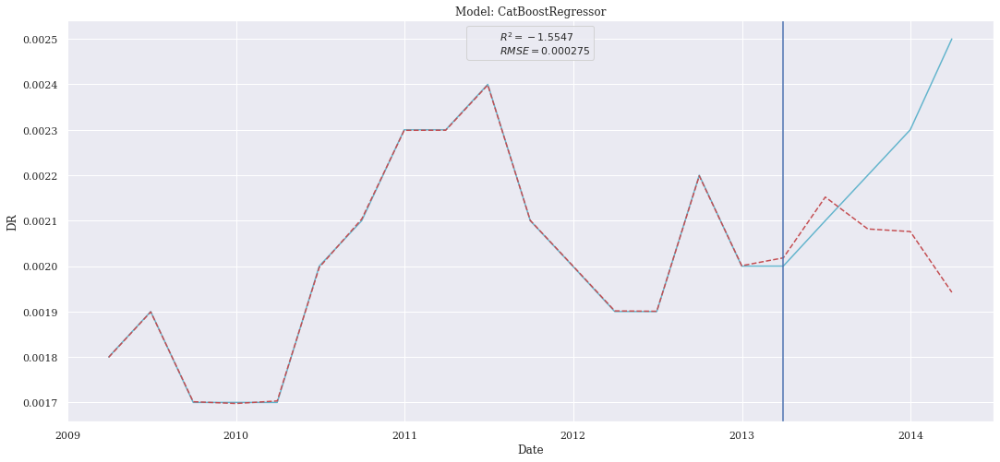

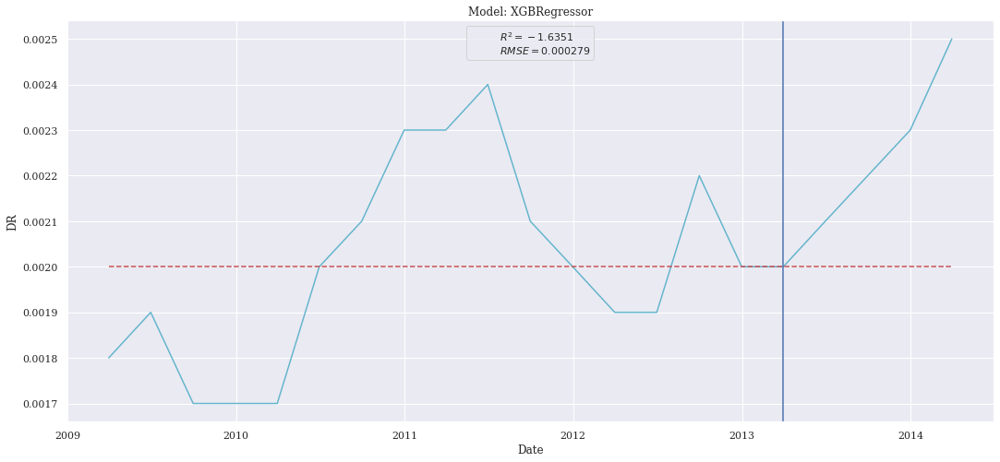

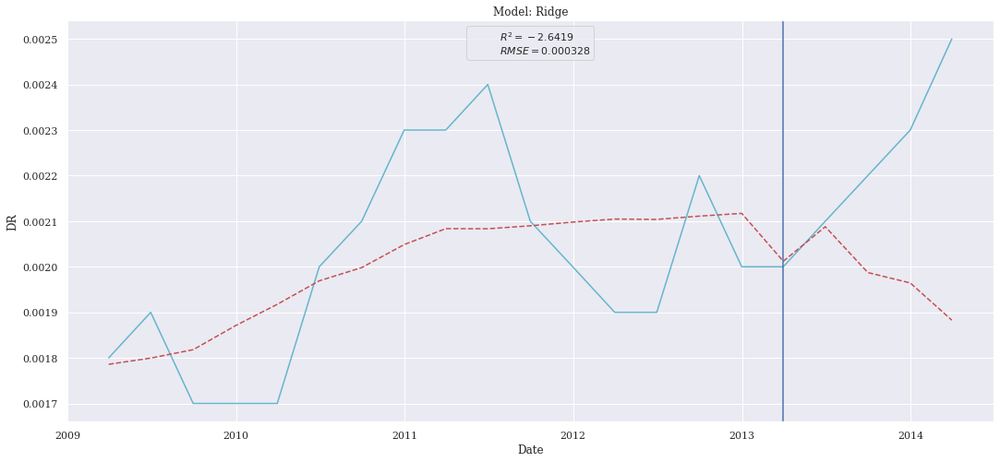

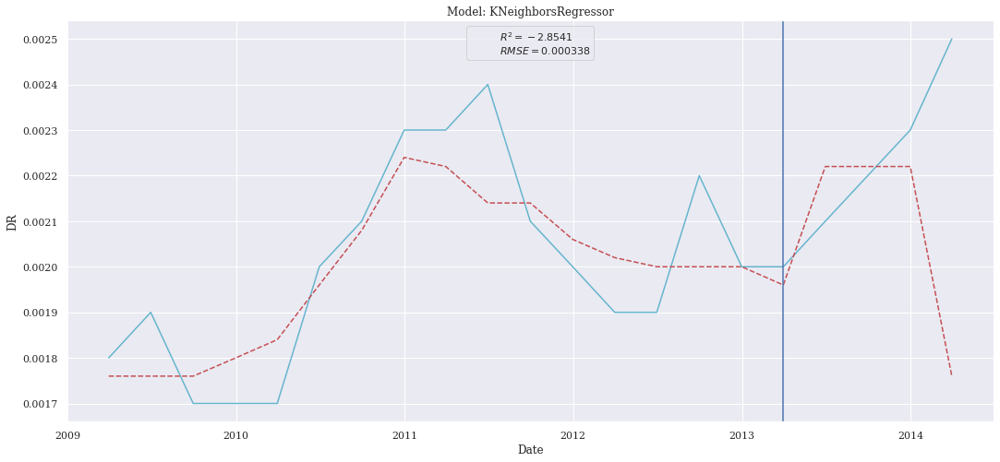

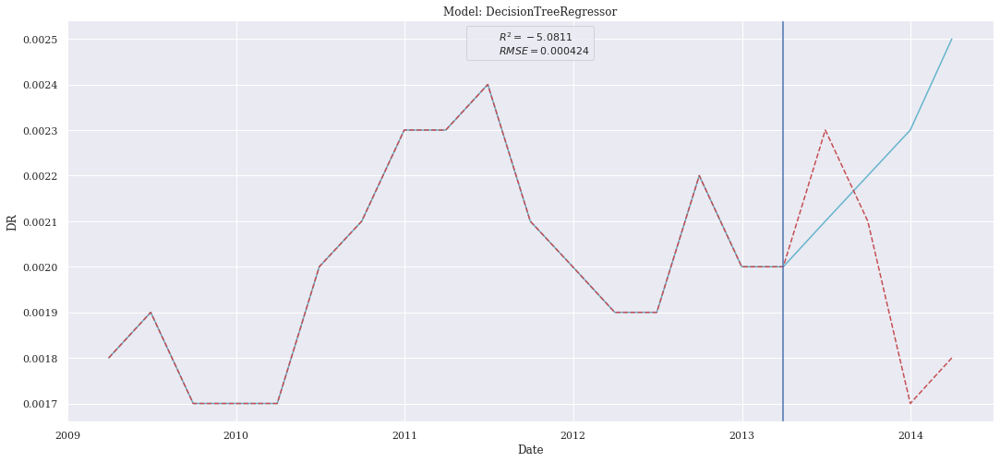

/Users/simonevanno/opt/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
/Users/simonevanno/opt/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


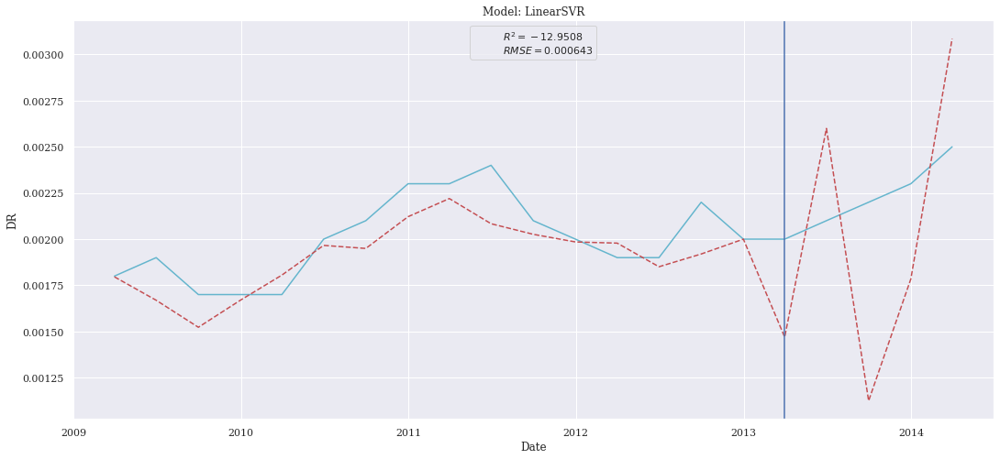

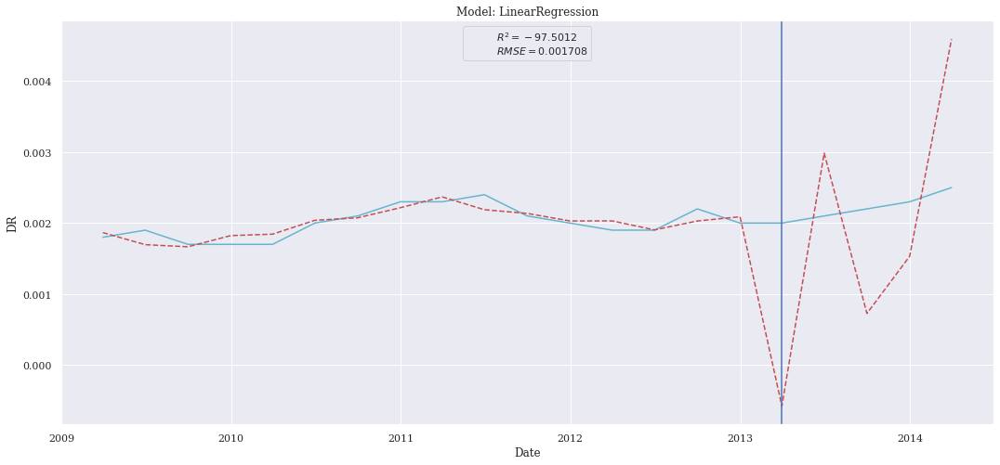

In [12]:
for i in range(summary.shape[0]): 
  y_train_pred = y_pred(X_train,y_train,X_train,y_train,model=summary.index[i])
  y_test_pred = y_pred(X_train,y_train,X_test,y_test,model=summary.index[i])
  plot_pred_detail(y_train,y_test,y_train_pred,y_test_pred,index,name_model=summary.index[i],df_score=summary)

### Low Variance Features

In [13]:
X_train, X_test, y_train, y_test, X_validation = clean_data(data,start,period=period,chronique=chronique,col_used=cl.col_2_low_var,split=split,norm=norm)
summary = summary_ml(X_train,y_train,X_test,y_test)
summary

,rmse,mse,mae,r2
Index,,,,
Ridge,0.000254,6.454331e-08,0.000223,-1.180517
LinearRegression,0.000260,6.770603e-08,0.000248,-1.287366
KNeighborsRegressor,0.000267,7.112000e-08,0.000212,-1.402703
CatBoostRegressor,0.000275,7.545484e-08,0.000225,-1.549150
XGBRegressor,0.000279,7.799986e-08,0.000220,-1.635130
DecisionTreeRegressor,0.000290,8.400000e-08,0.000200,-1.837838
LinearSVR,0.000521,2.717270e-07,0.000435,-8.179966


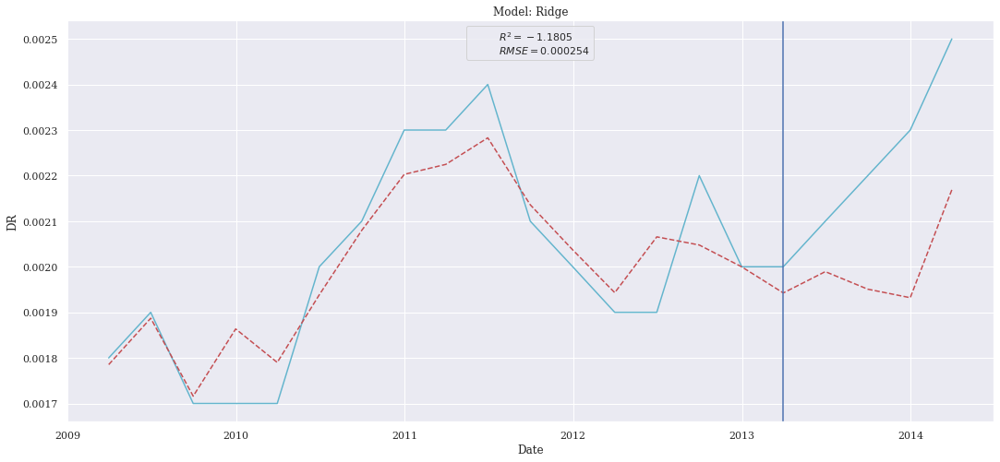

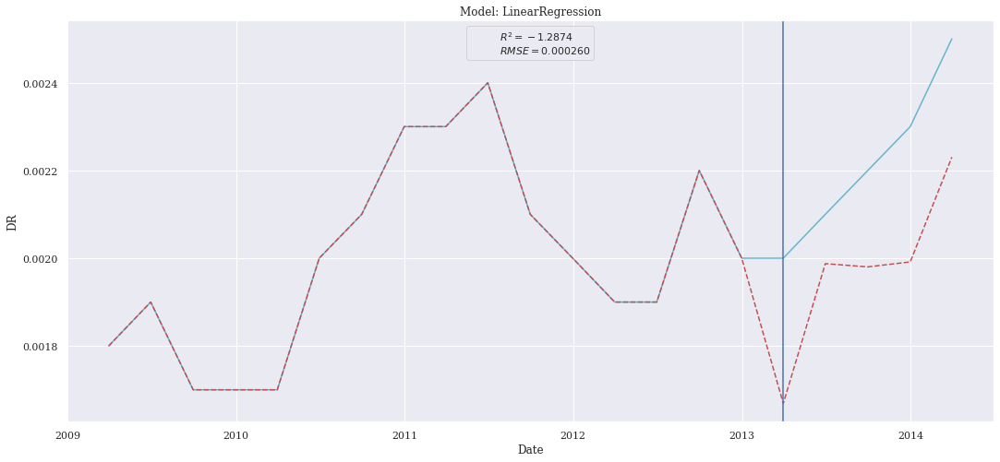

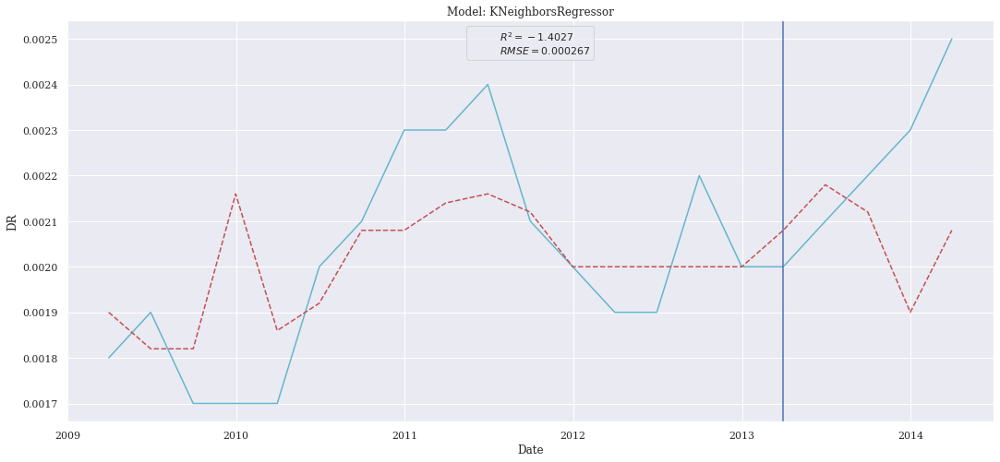

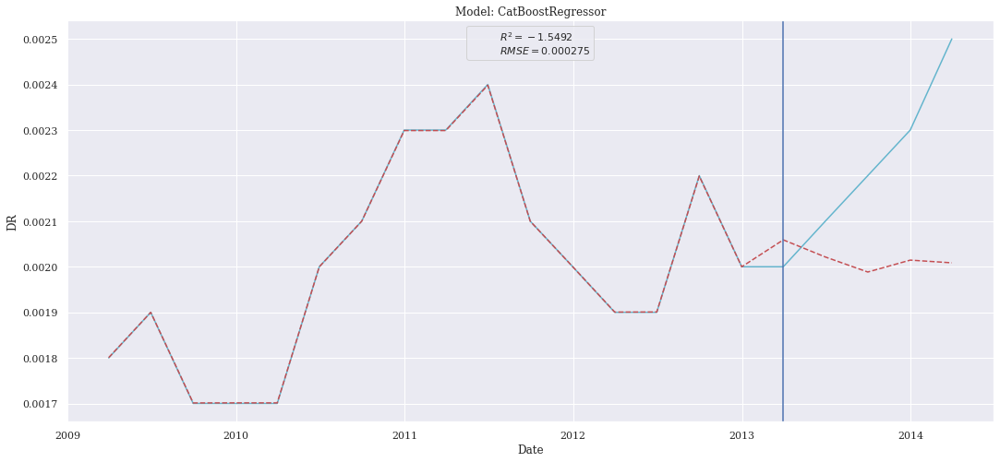

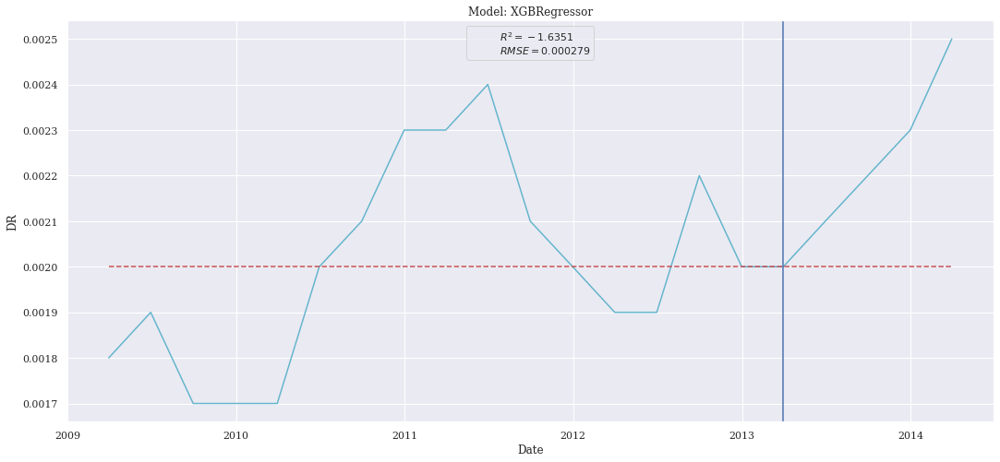

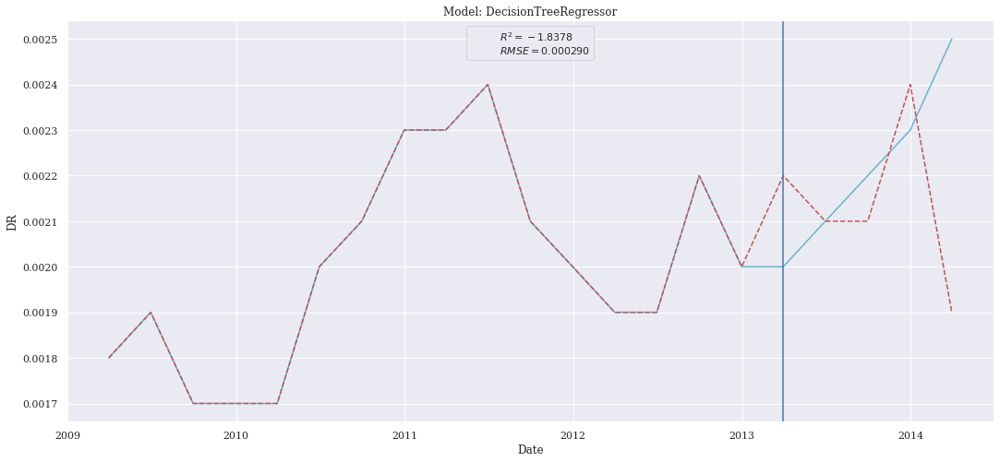

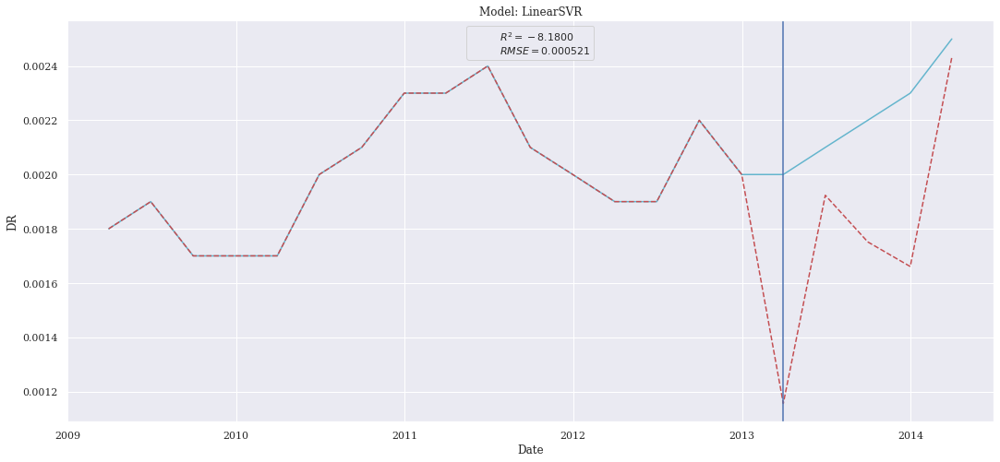

In [14]:
for i in range(summary.shape[0]): 
  y_train_pred = y_pred(X_train,y_train,X_train,y_train,model=summary.index[i])
  y_test_pred = y_pred(X_train,y_train,X_test,y_test,model=summary.index[i])
  plot_pred_detail(y_train,y_test,y_train_pred,y_test_pred,index,name_model=summary.index[i],df_score=summary)

### KBest Features

In [4]:
X_train, X_test, y_train, y_test, X_validation = clean_data(data,start,period=period,chronique=chronique,col_used=cl.col_2_kbest,split=split,norm=norm)
summary = summary_ml(X_train,y_train,X_test,y_test)
summary

/Users/simonevanno/opt/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


,rmse,mse,mae,r2
Index,,,,
Ridge,0.000227,5.140751e-08,0.000179,-0.736740
XGBRegressor,0.000279,7.799986e-08,0.000220,-1.635130
CatBoostRegressor,0.000284,8.064894e-08,0.000221,-1.724626
KNeighborsRegressor,0.000336,1.127200e-07,0.000236,-2.808108
DecisionTreeRegressor,0.000361,1.300000e-07,0.000300,-3.391892
LinearSVR,0.000782,6.121000e-07,0.000644,-19.679054
LinearRegression,0.000926,8.579616e-07,0.000796,-27.985190


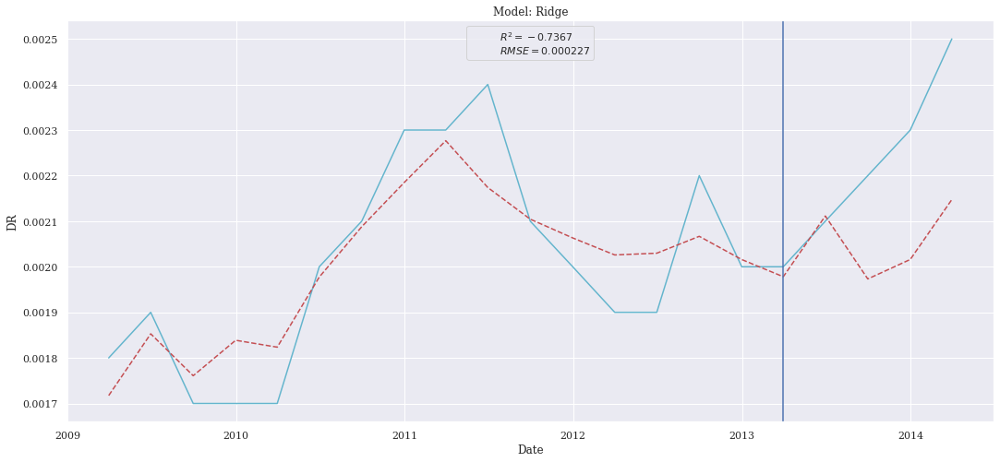

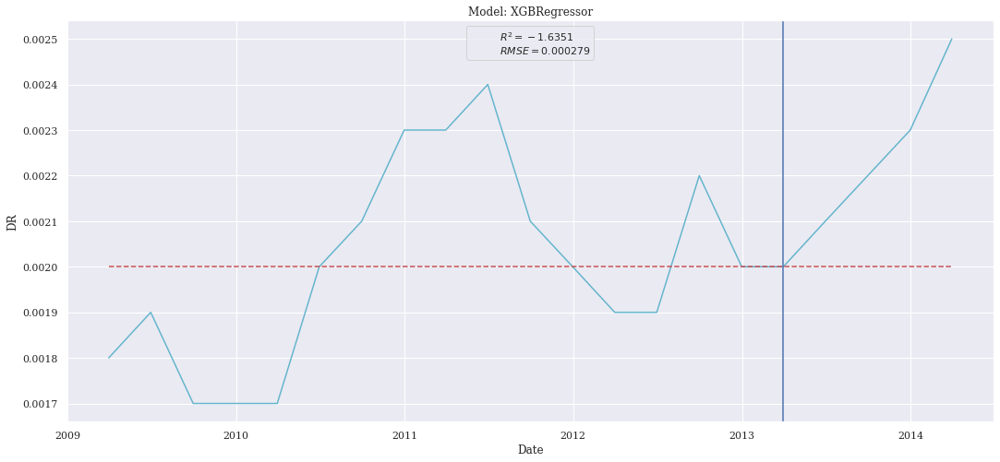

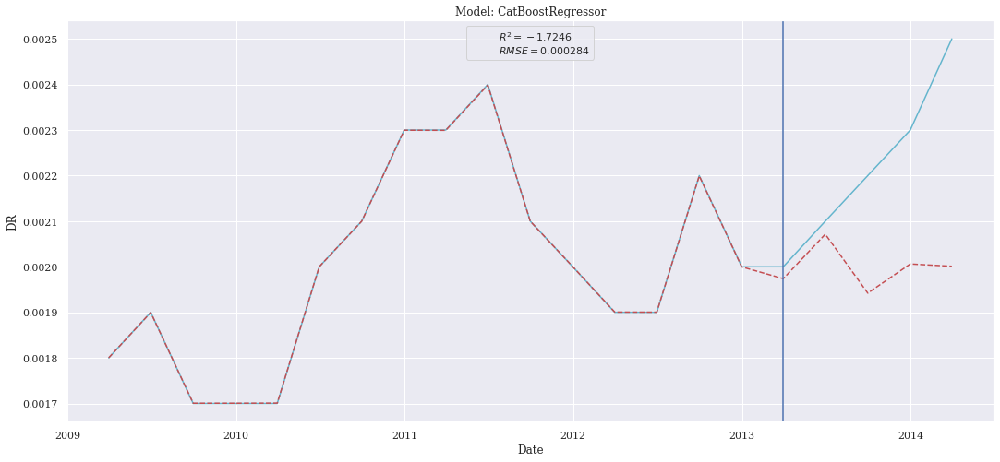

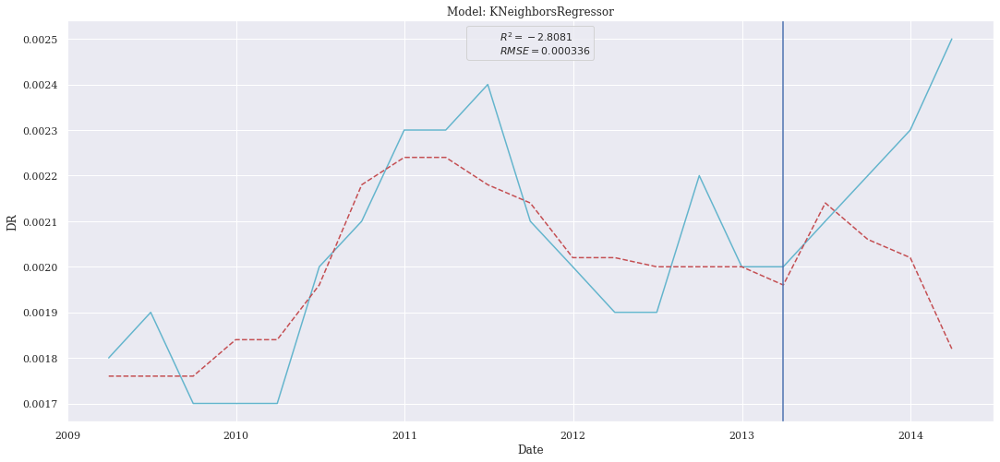

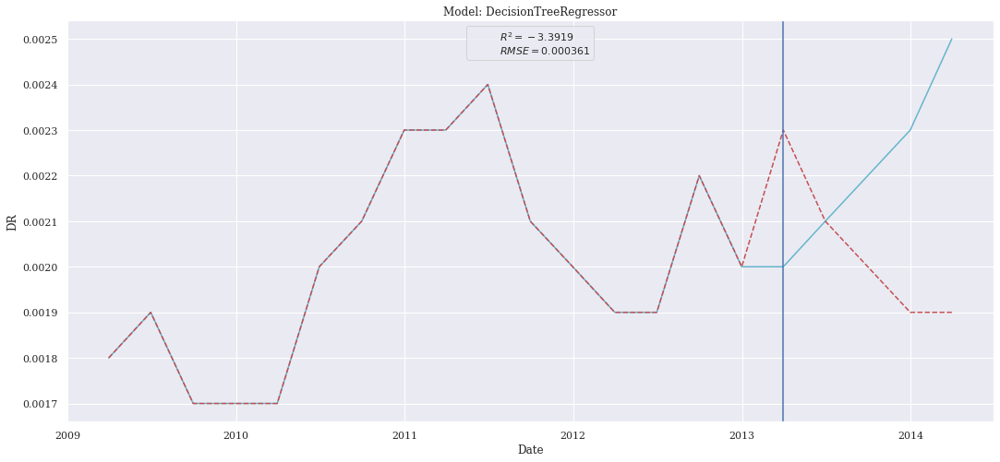

/Users/simonevanno/opt/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
/Users/simonevanno/opt/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


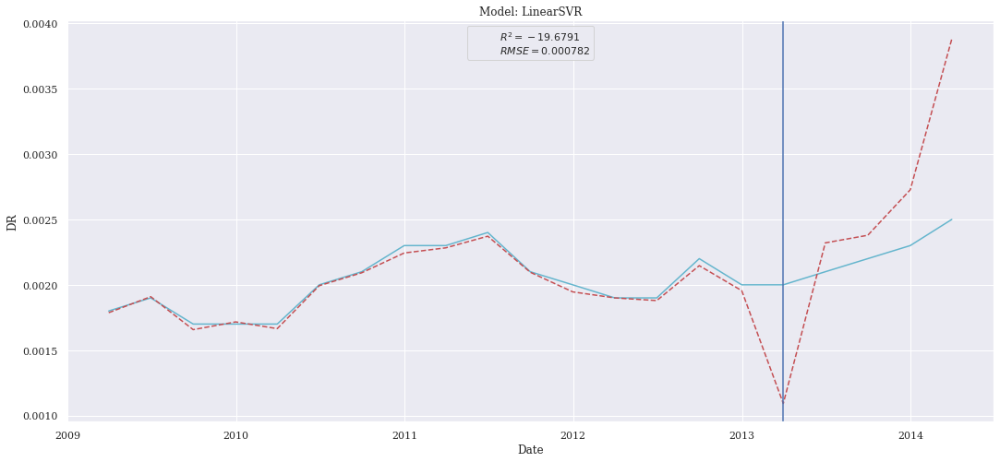

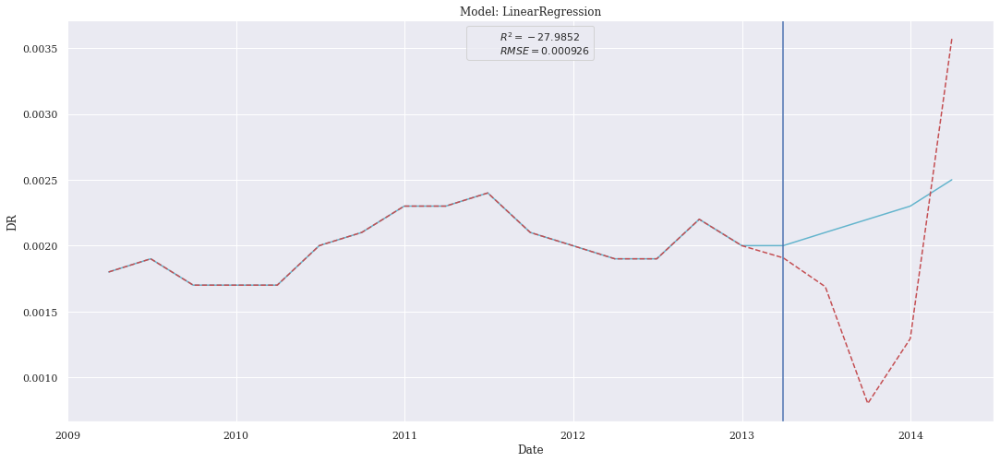

In [5]:
for i in range(summary.shape[0]): 
  y_train_pred = y_pred(X_train,y_train,X_train,y_train,model=summary.index[i])
  y_test_pred = y_pred(X_train,y_train,X_test,y_test,model=summary.index[i])
  plot_pred_detail(y_train,y_test,y_train_pred,y_test_pred,index,name_model=summary.index[i],df_score=summary)

### Recursive Features

In [8]:
X_train, X_test, y_train, y_test, X_validation = clean_data(data,start,period=period,chronique=chronique,col_used=cl.col_2_recur,split=split,norm=norm)
summary = summary_ml(X_train,y_train,X_test,y_test)
summary

,rmse,mse,mae,r2
Index,,,,
XGBRegressor,0.000279,7.799986e-08,0.000220,-1.635130
CatBoostRegressor,0.000282,7.979791e-08,0.000222,-1.695875
KNeighborsRegressor,0.000312,9.712000e-08,0.000240,-2.281081
Ridge,0.000322,1.039029e-07,0.000267,-2.510233
LinearRegression,0.000370,1.369229e-07,0.000300,-3.625775
DecisionTreeRegressor,0.000469,2.200000e-07,0.000400,-6.432432
LinearSVR,0.000637,4.056677e-07,0.000577,-12.704991


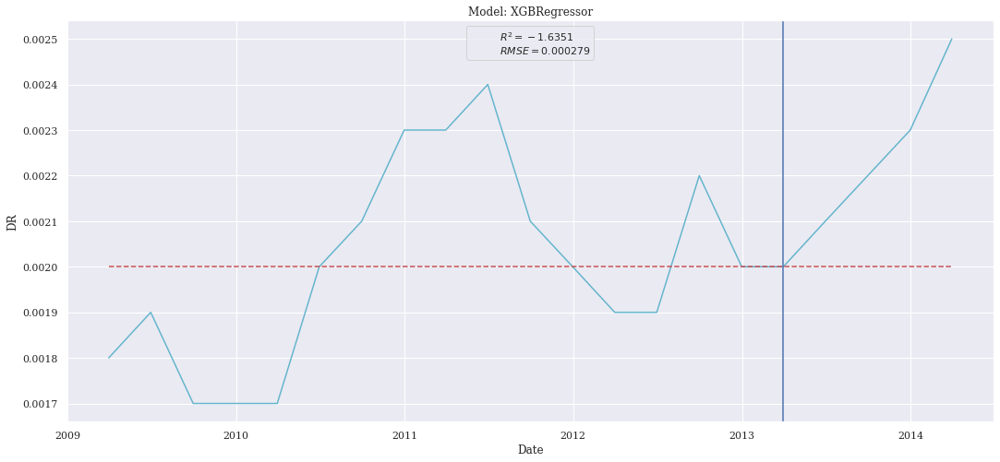

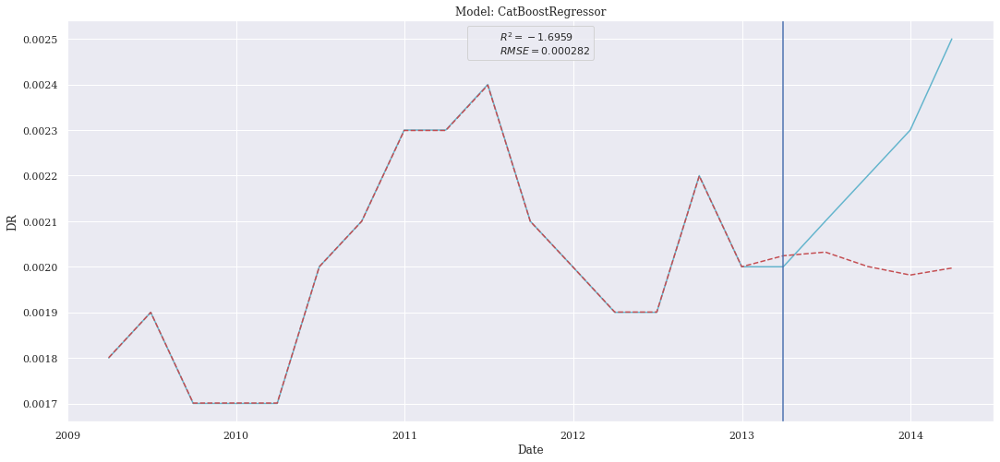

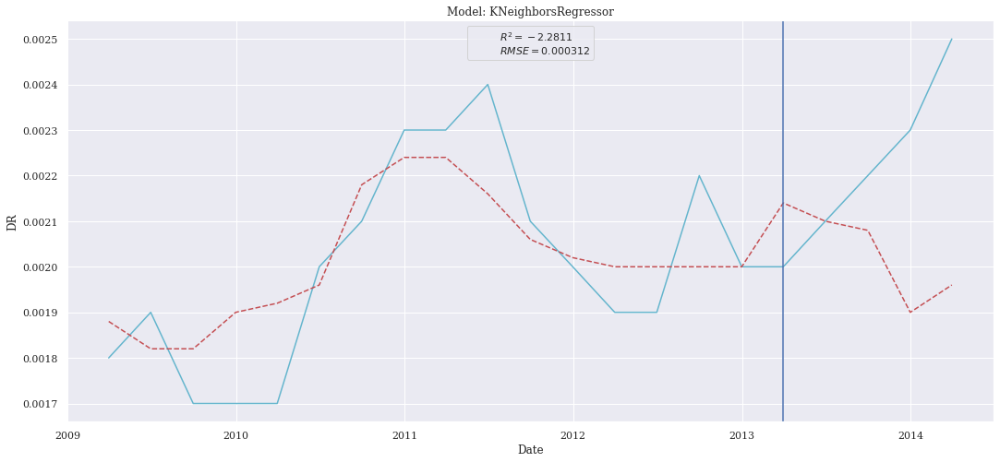

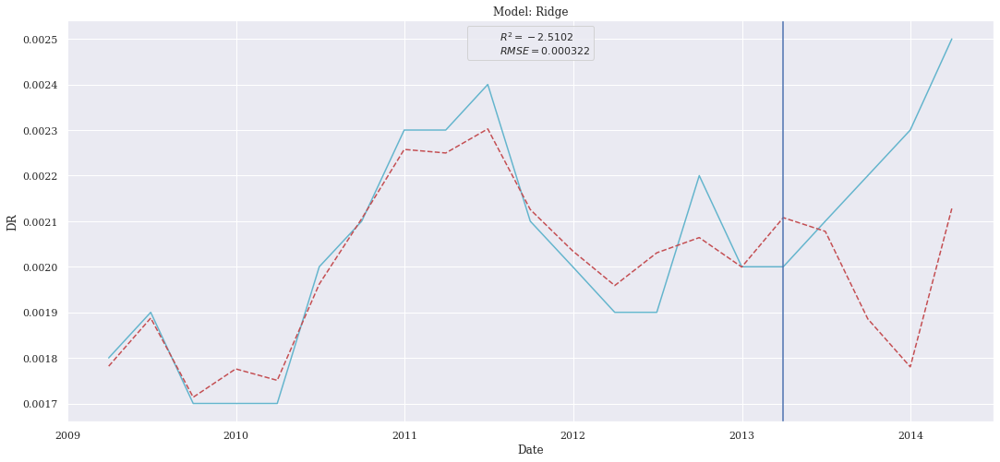

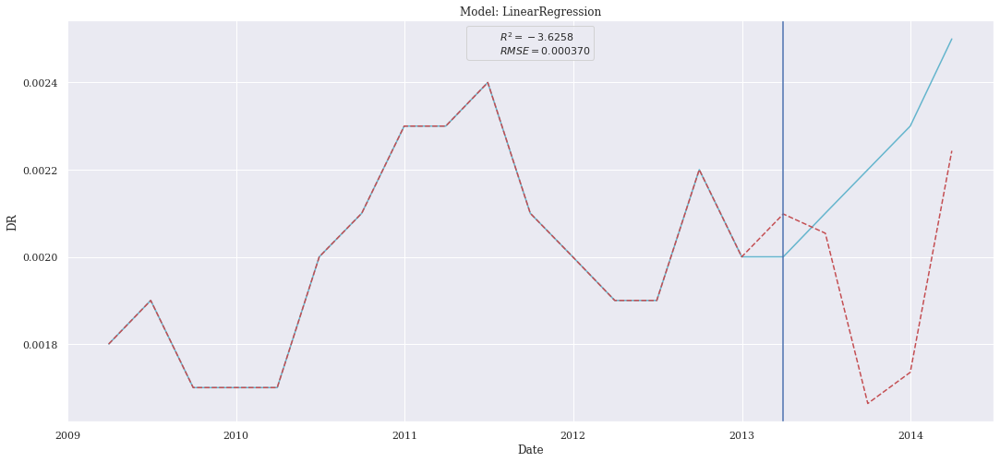

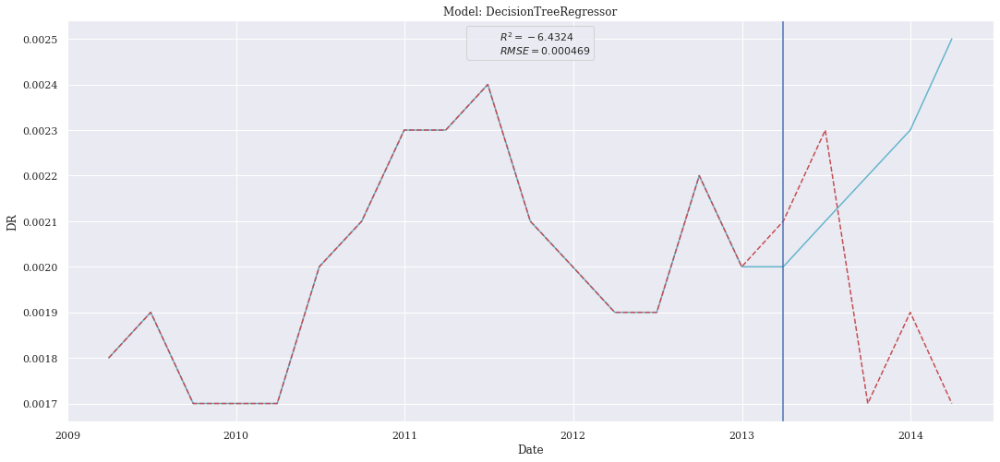

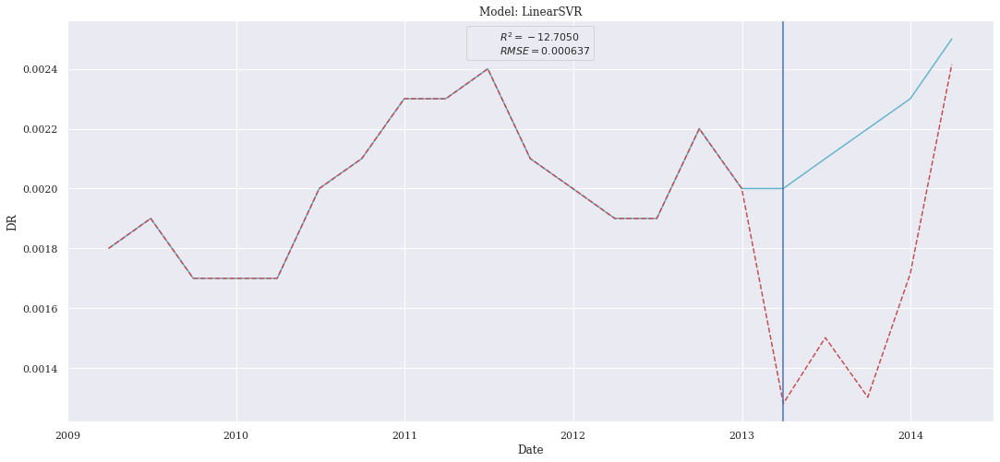

In [9]:
for i in range(summary.shape[0]): 
  y_train_pred = y_pred(X_train,y_train,X_train,y_train,model=summary.index[i])
  y_test_pred = y_pred(X_train,y_train,X_test,y_test,model=summary.index[i])
  plot_pred_detail(y_train,y_test,y_train_pred,y_test_pred,index,name_model=summary.index[i],df_score=summary)

### SelectFromModel Features

In [11]:
X_train, X_test, y_train, y_test, X_validation = clean_data(data,start,period=period,chronique=chronique,col_used=cl.col_2_sfm,split=split,norm=norm)
summary = summary_ml(X_train,y_train,X_test,y_test)
summary

/Users/simonevanno/opt/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


,rmse,mse,mae,r2
Index,,,,
XGBRegressor,0.000279,7.799986e-08,0.000220,-1.635130
KNeighborsRegressor,0.000286,8.152000e-08,0.000220,-1.754054
CatBoostRegressor,0.000299,8.969953e-08,0.000246,-2.030389
Ridge,0.000315,9.897729e-08,0.000249,-2.343827
DecisionTreeRegressor,0.000395,1.560000e-07,0.000360,-4.270270
LinearRegression,0.000679,4.612122e-07,0.000595,-14.581493
LinearSVR,0.001008,1.016323e-06,0.000921,-33.335243


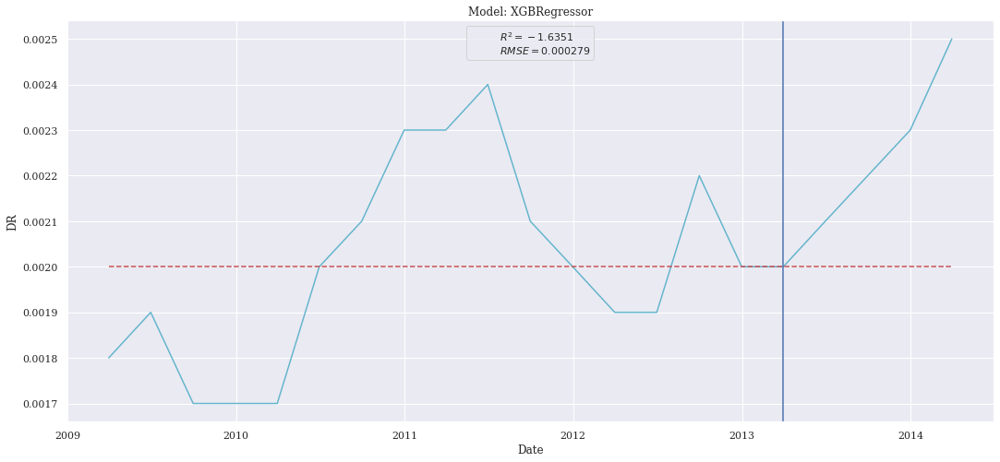

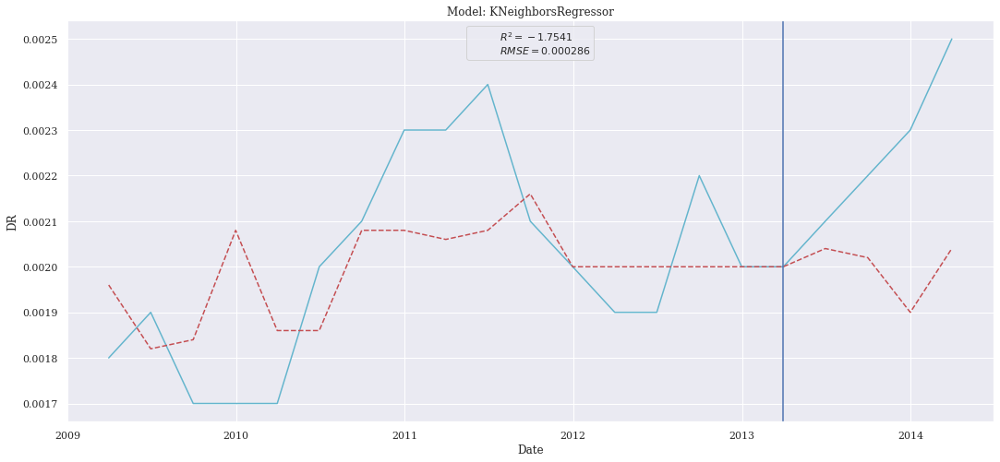

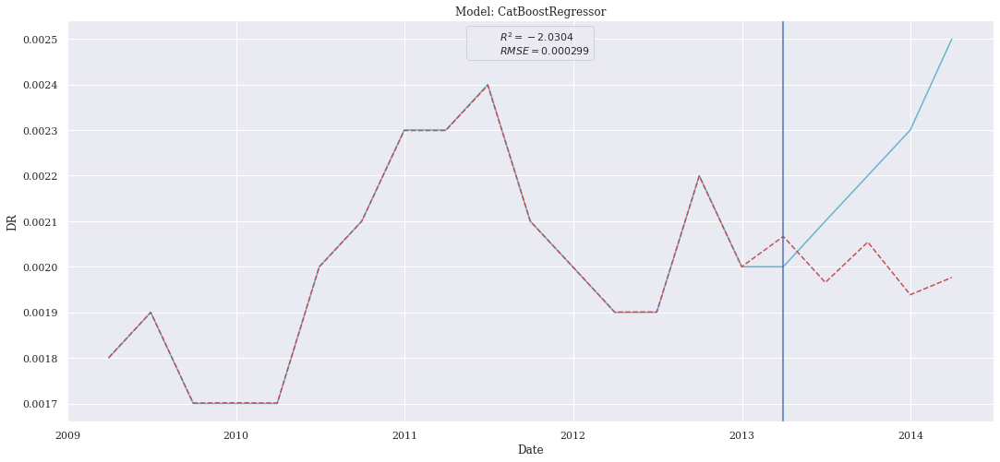

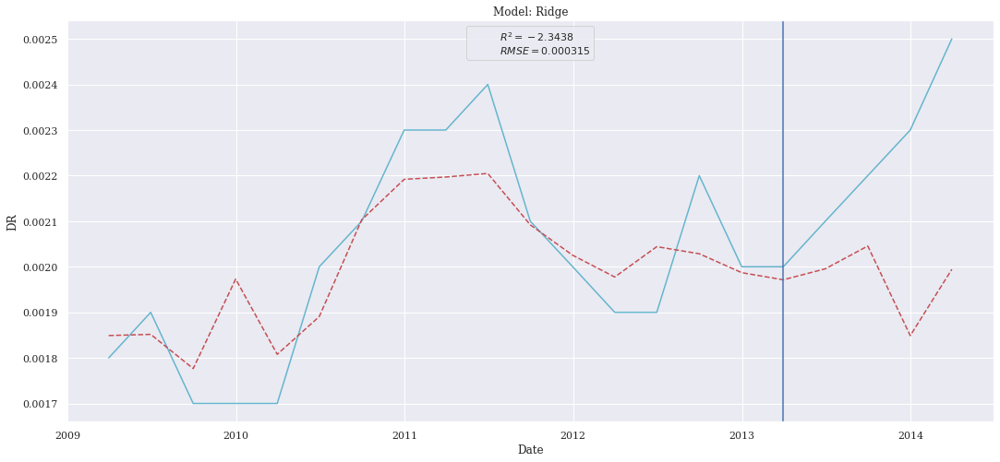

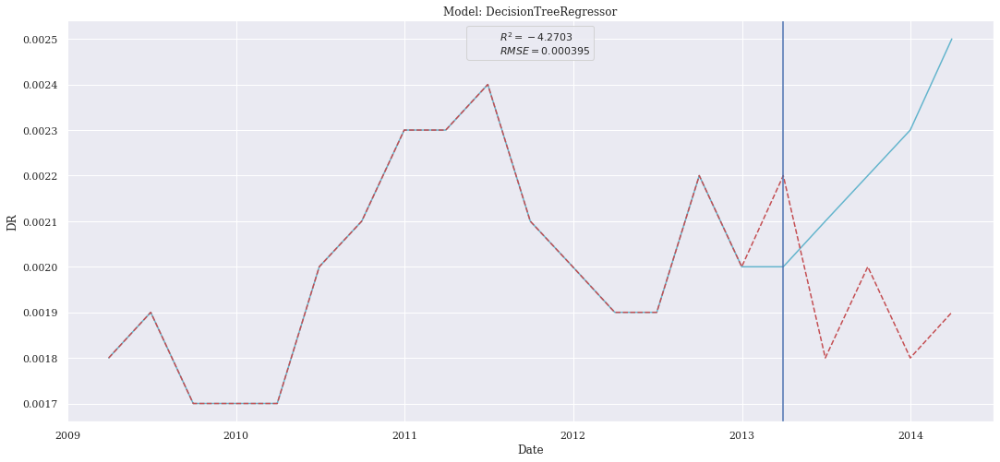

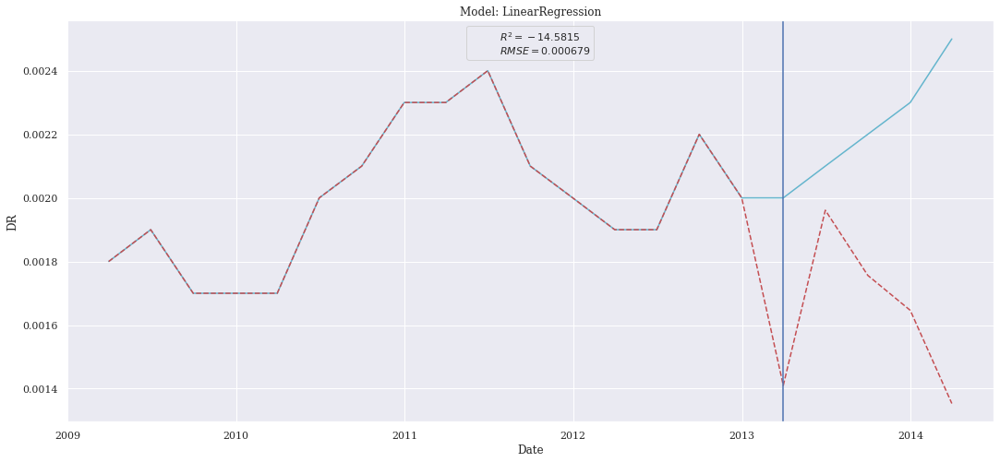

/Users/simonevanno/opt/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
/Users/simonevanno/opt/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


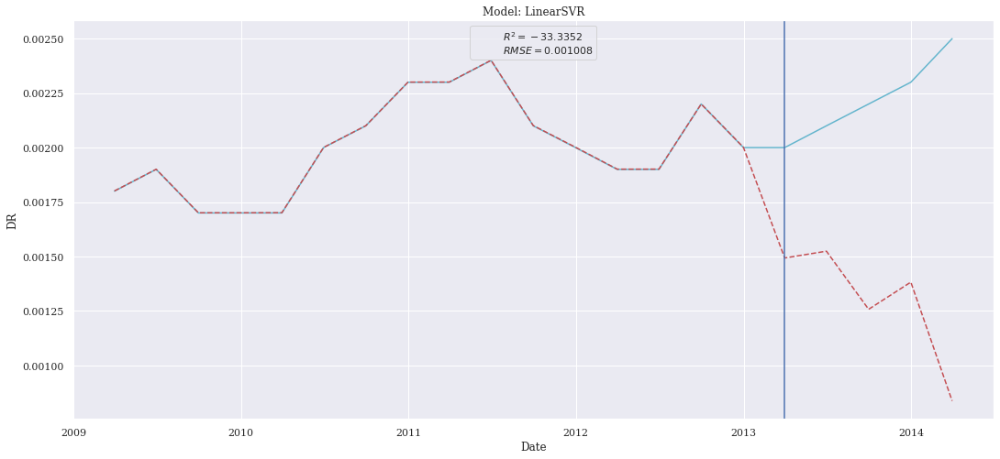

In [12]:
for i in range(summary.shape[0]): 
  y_train_pred = y_pred(X_train,y_train,X_train,y_train,model=summary.index[i])
  y_test_pred = y_pred(X_train,y_train,X_test,y_test,model=summary.index[i])
  plot_pred_detail(y_train,y_test,y_train_pred,y_test_pred,index,name_model=summary.index[i],df_score=summary)

### Tree-Based Features

In [15]:
X_train, X_test, y_train, y_test, X_validation = clean_data(data,start,period=period,chronique=chronique,col_used=cl.col_2_tree,split=split,norm=norm)
summary = summary_ml(X_train,y_train,X_test,y_test)
summary

/Users/simonevanno/opt/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


,rmse,mse,mae,r2
Index,,,,
XGBRegressor,0.000279,7.799986e-08,0.000220,-1.635130
DecisionTreeRegressor,0.000316,1.000000e-07,0.000240,-2.378378
CatBoostRegressor,0.000359,1.285572e-07,0.000278,-3.343148
Ridge,0.000384,1.474771e-07,0.000320,-3.982333
KNeighborsRegressor,0.000408,1.661600e-07,0.000292,-4.613514
LinearSVR,0.001006,1.012399e-06,0.000823,-33.202672
LinearRegression,0.012961,1.679939e-04,0.011704,-5674.468145


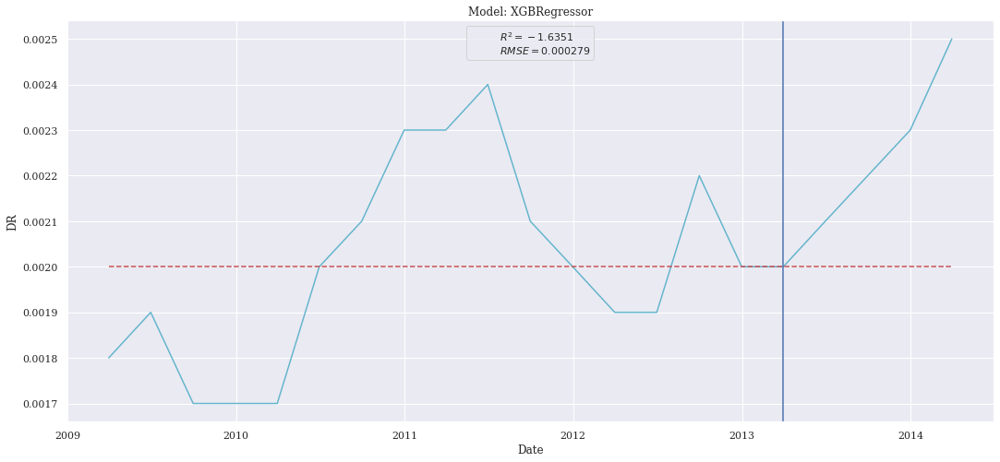

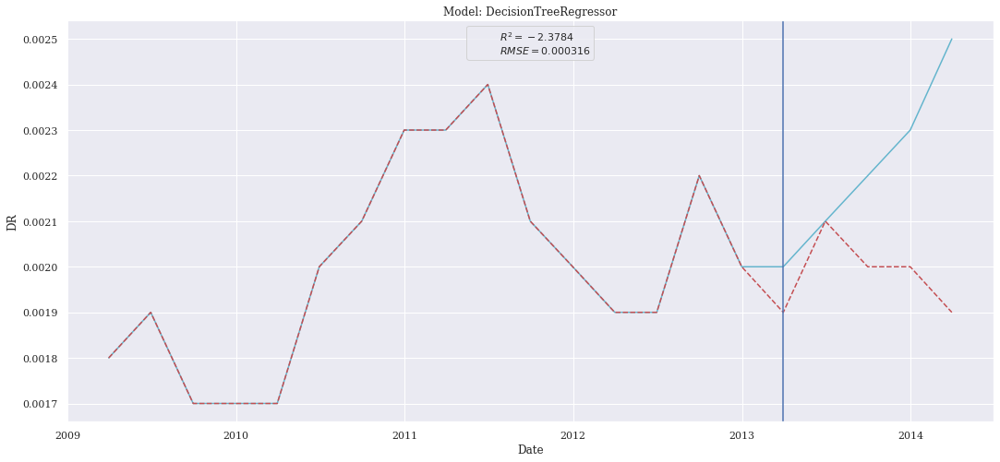

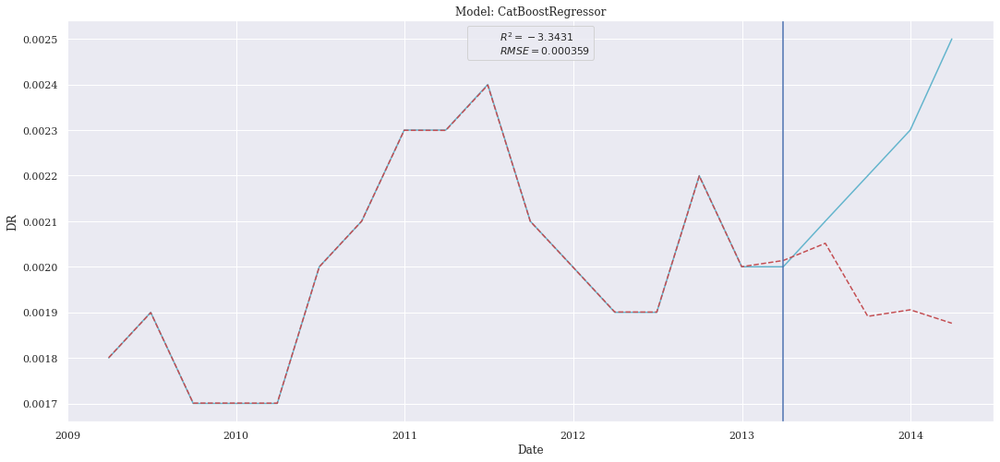

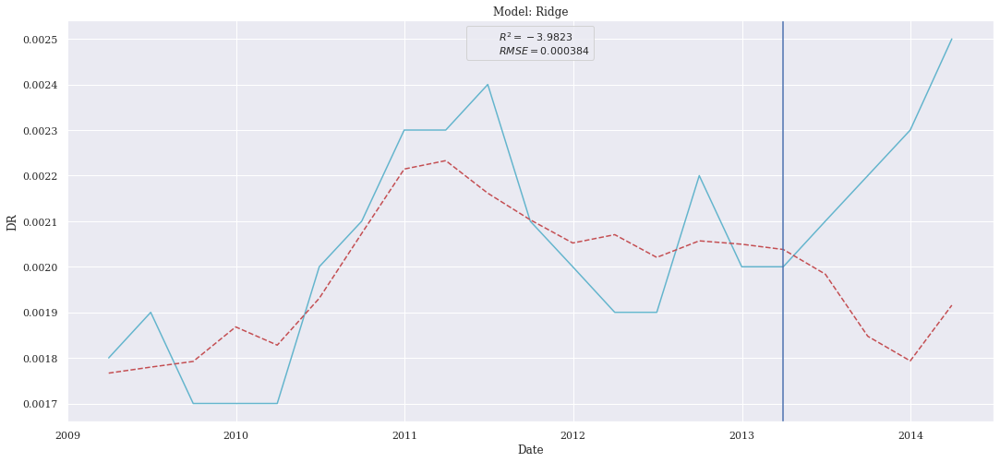

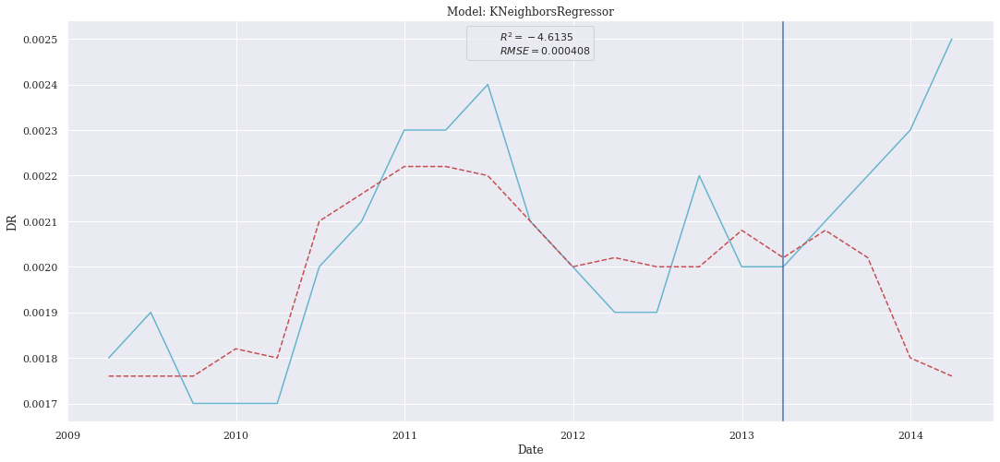

/Users/simonevanno/opt/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
/Users/simonevanno/opt/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


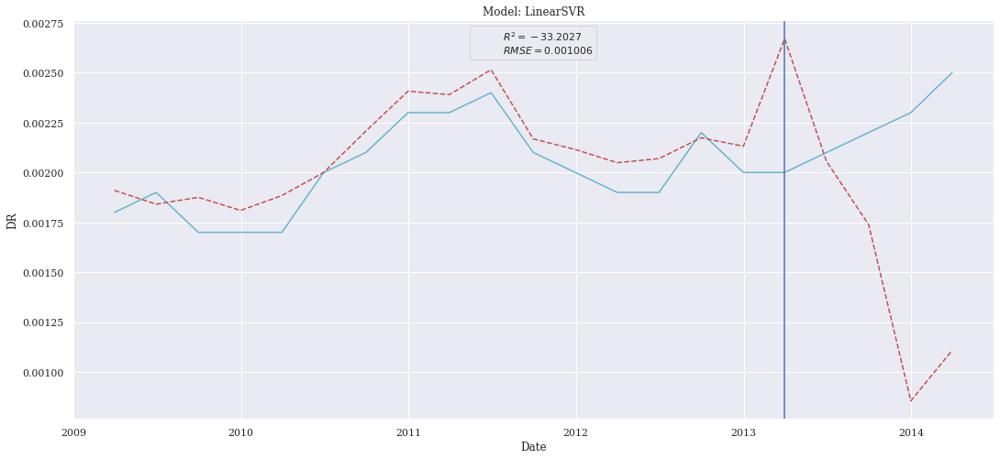

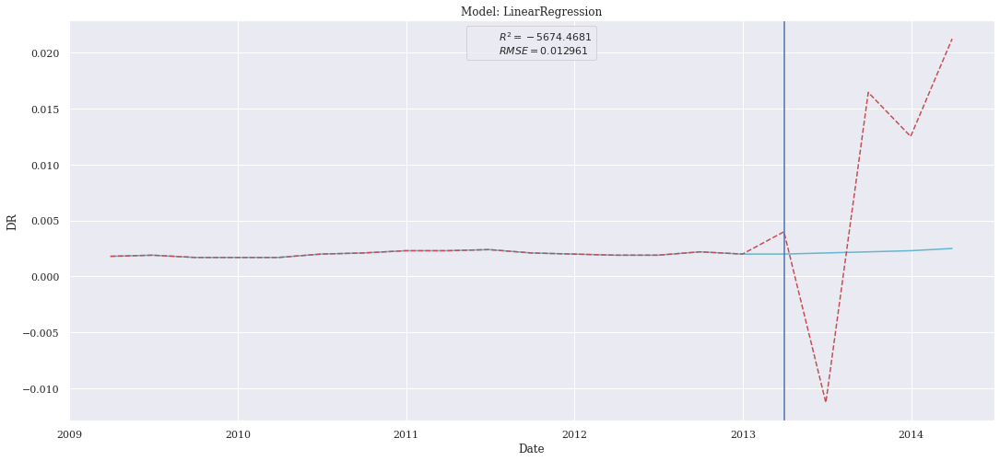

In [16]:
for i in range(summary.shape[0]): 
  y_train_pred = y_pred(X_train,y_train,X_train,y_train,model=summary.index[i])
  y_test_pred = y_pred(X_train,y_train,X_test,y_test,model=summary.index[i])
  plot_pred_detail(y_train,y_test,y_train_pred,y_test_pred,index,name_model=summary.index[i],df_score=summary)

### Sequential Forward Features

In [17]:
X_train, X_test, y_train, y_test, X_validation = clean_data(data,start,period=period,chronique=chronique,col_used=cl.col_2_seq_for,split=split,norm=norm)
summary = summary_ml(X_train,y_train,X_test,y_test)
summary

/Users/simonevanno/opt/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


,rmse,mse,mae,r2
Index,,,,
KNeighborsRegressor,0.000236,5.576000e-08,0.000188,-0.883784
XGBRegressor,0.000279,7.799986e-08,0.000220,-1.635130
CatBoostRegressor,0.000282,7.963028e-08,0.000221,-1.690212
Ridge,0.000283,8.001817e-08,0.000256,-1.703316
DecisionTreeRegressor,0.000316,1.000000e-07,0.000240,-2.378378
LinearRegression,0.000544,2.956396e-07,0.000452,-8.987825
LinearSVR,0.000601,3.611643e-07,0.000513,-11.201498


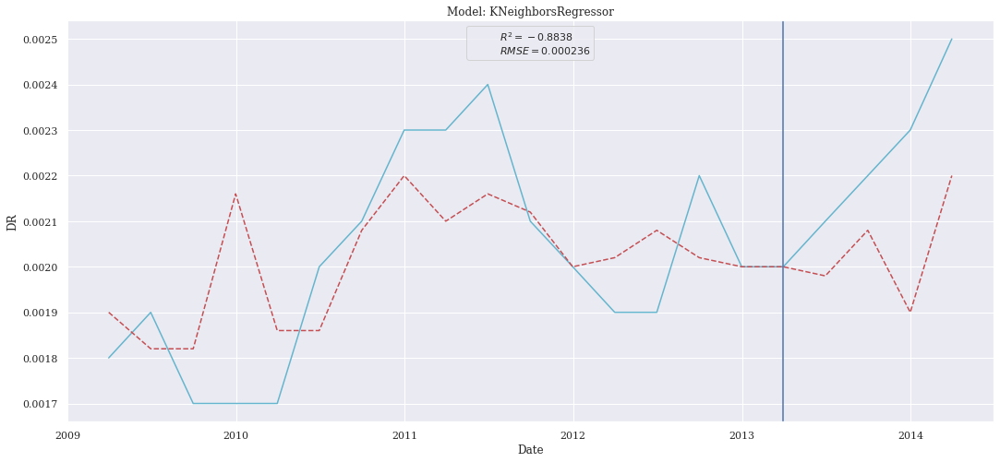

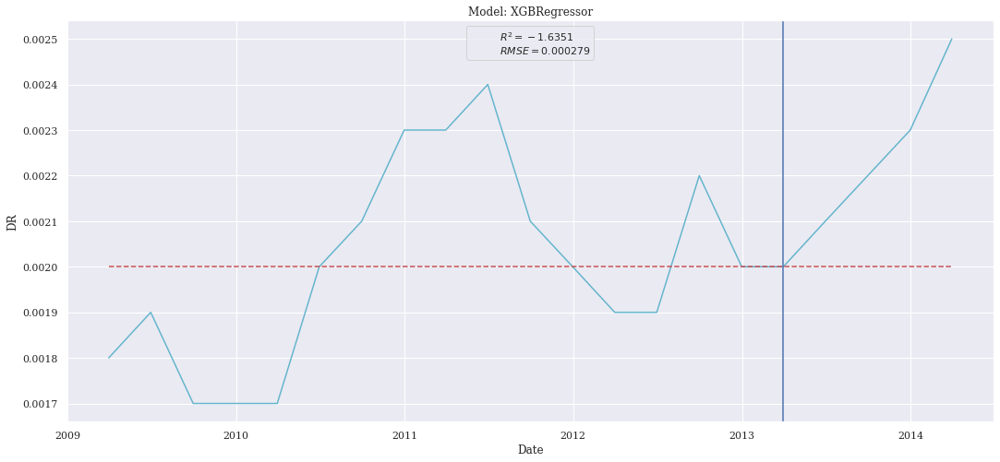

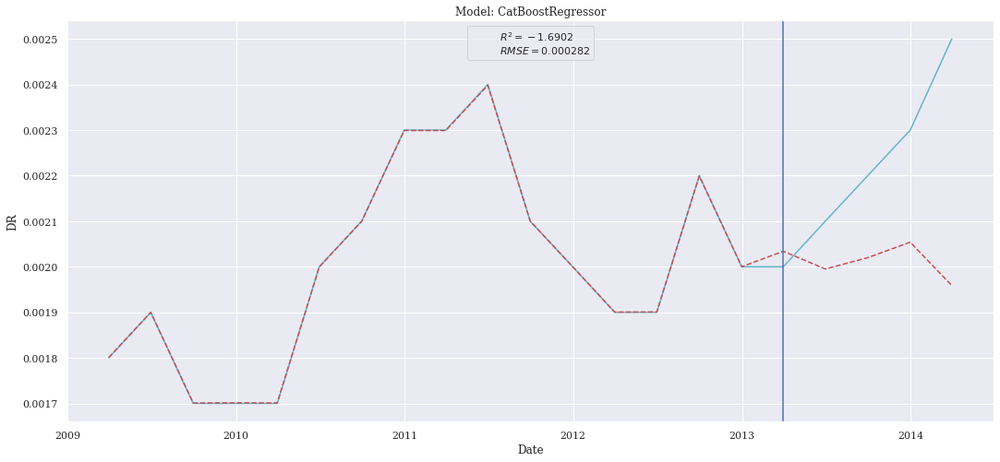

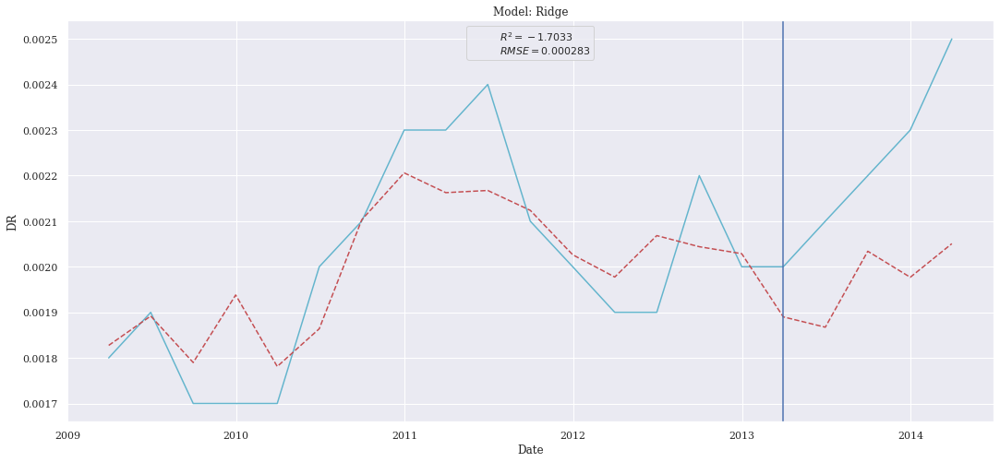

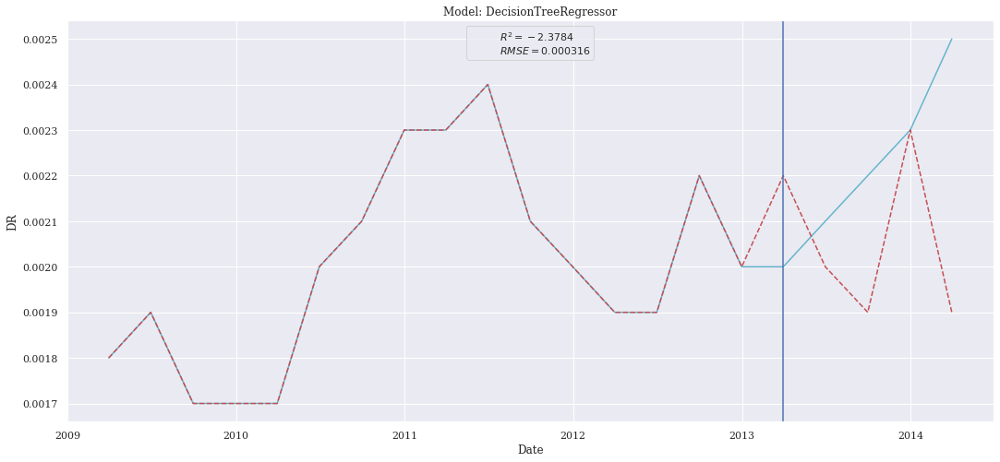

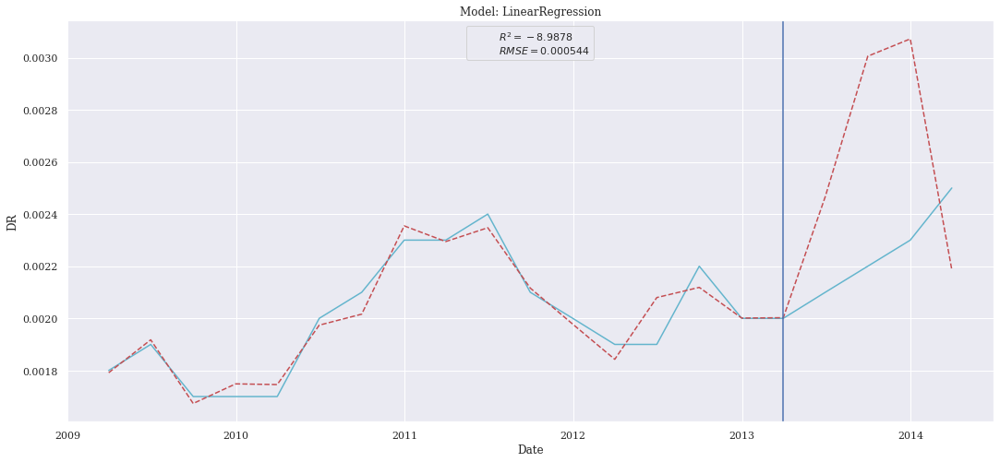

/Users/simonevanno/opt/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
/Users/simonevanno/opt/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


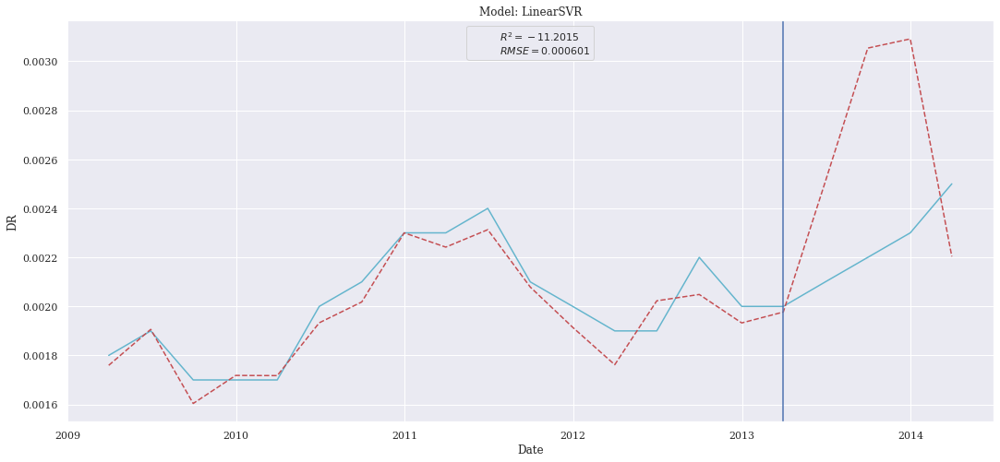

In [18]:
for i in range(summary.shape[0]):
  y_train_pred = y_pred(X_train,y_train,X_train,y_train,model=summary.index[i])
  y_test_pred = y_pred(X_train,y_train,X_test,y_test,model=summary.index[i])
  plot_pred_detail(y_train,y_test,y_train_pred,y_test_pred,index,name_model=summary.index[i],df_score=summary)

### Sequential Backward Features

In [19]:
X_train, X_test, y_train, y_test, X_validation = clean_data(data,start,period=period,chronique=chronique,col_used=cl.col_2_seq_bac,split=split,norm=norm)
summary = summary_ml(X_train,y_train,X_test,y_test)
summary

/Users/simonevanno/opt/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


,rmse,mse,mae,r2
Index,,,,
Ridge,0.000212,4.493369e-08,0.000183,-0.518030
KNeighborsRegressor,0.000223,4.976000e-08,0.000176,-0.681081
CatBoostRegressor,0.000263,6.927450e-08,0.000207,-1.340355
XGBRegressor,0.000279,7.799986e-08,0.000220,-1.635130
DecisionTreeRegressor,0.000286,8.200000e-08,0.000180,-1.770270
LinearSVR,0.000565,3.195458e-07,0.000429,-9.795465
LinearRegression,0.000567,3.213381e-07,0.000386,-9.856017


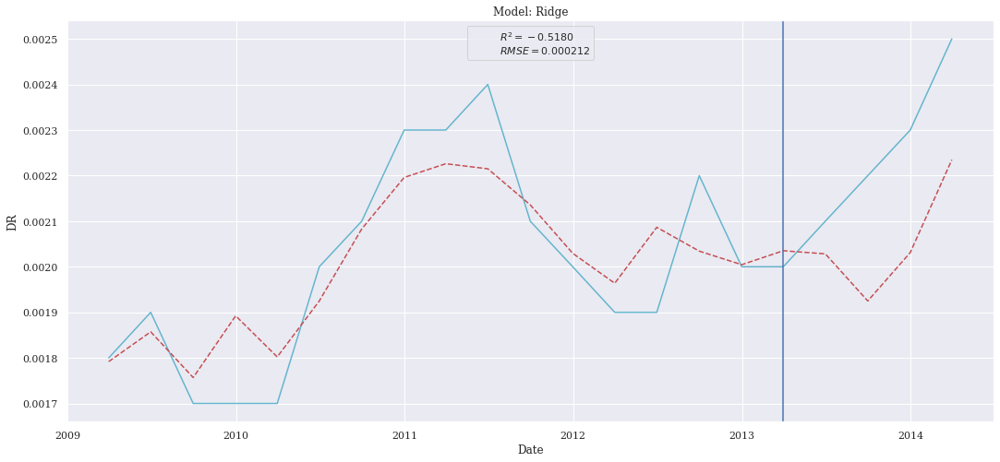

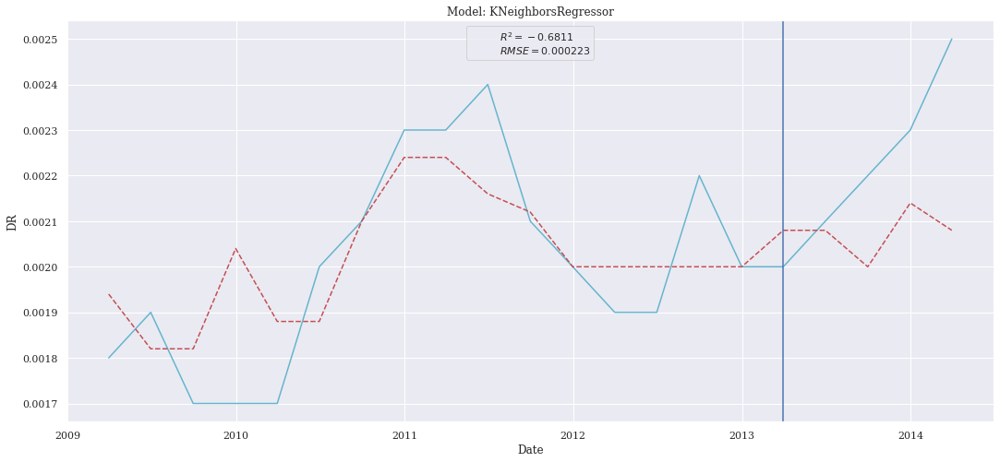

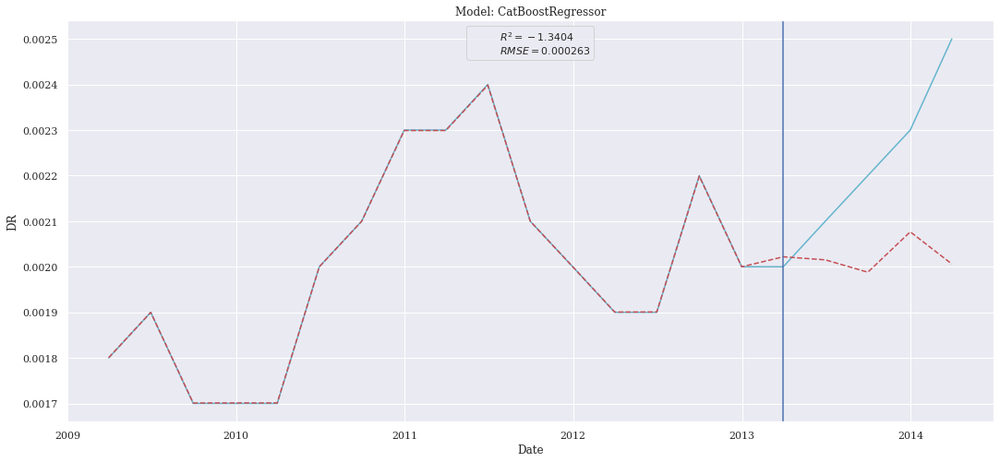

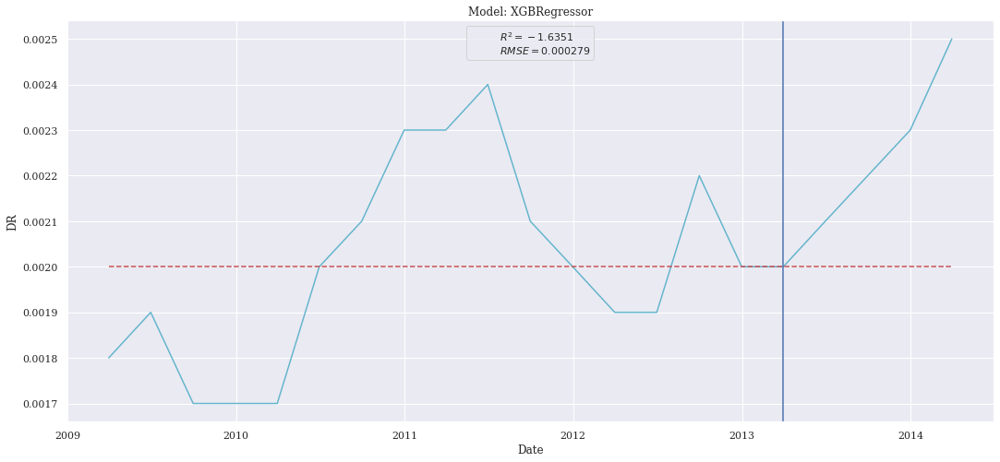

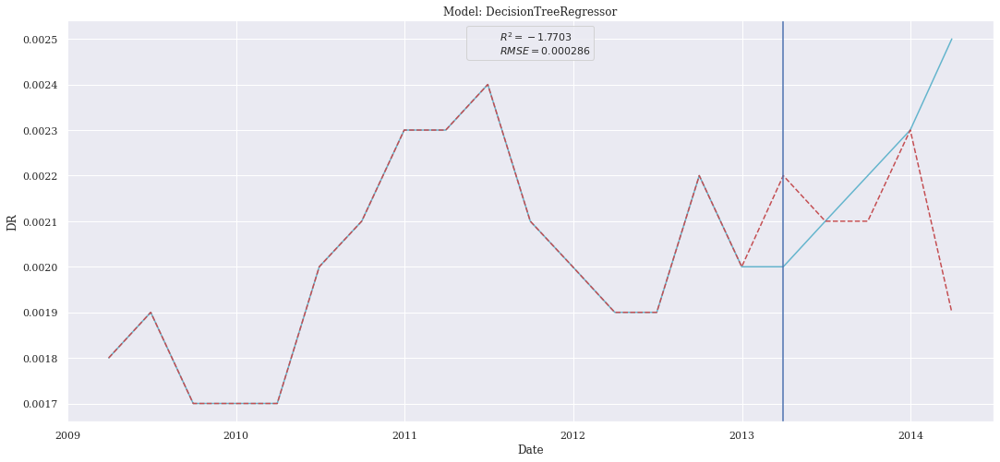

/Users/simonevanno/opt/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
/Users/simonevanno/opt/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


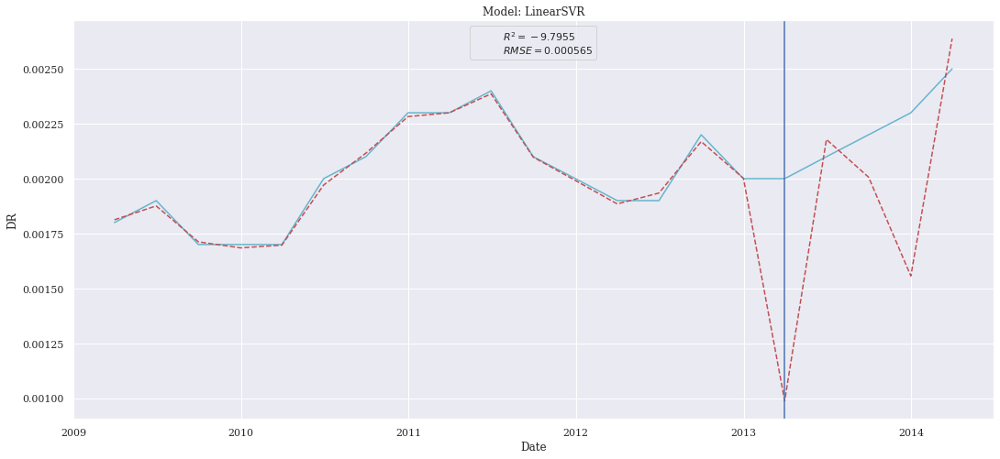

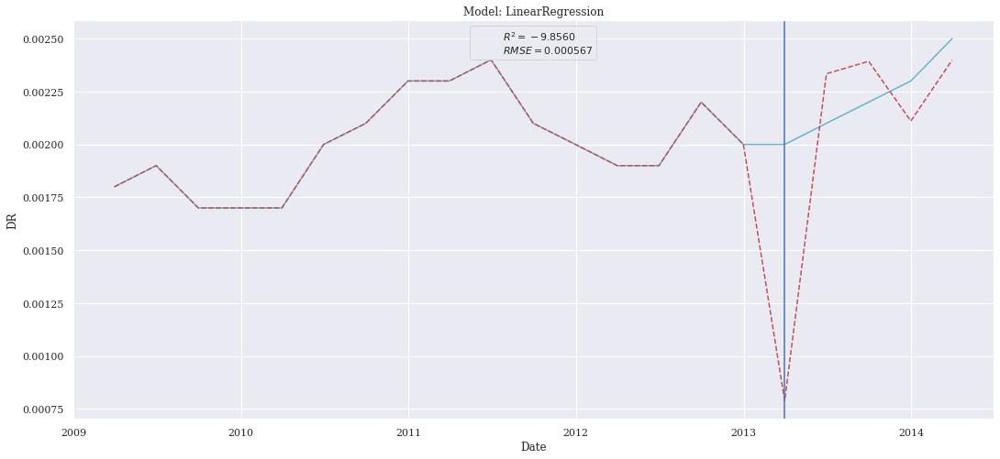

In [20]:
for i in range(summary.shape[0]):
  y_train_pred = y_pred(X_train,y_train,X_train,y_train,model=summary.index[i])
  y_test_pred = y_pred(X_train,y_train,X_test,y_test,model=summary.index[i])
  plot_pred_detail(y_train,y_test,y_train_pred,y_test_pred,index,name_model=summary.index[i],df_score=summary)

## First Conclusion
Given a first point of view we see that the xgboost and catboost are the best models to predict CHR2. We generally have a rmse equals to 0.000184 for the xgboost with a r2 positive but very low (all the r2 are negative, that show that the model doesn't follow the trend of y_test). One exception is observed for the KNeighborsRegressor with recursive features were we have a r2 of 0.73 and a rmse equals to 0.0.000096 (best result). We decided to apply a grid search on xgboost, catboostregressor and kneighborsregressor to find if a better parameter is possible

### GridSearch on KNeighborsRegressor

In [21]:
X_train, X_test, y_train, y_test, X_validation = clean_data(data,start,period=period, chronique=b"CHR2",col_used=cl.col_2_recur,split=split,norm=norm)
params_knr = {"n_neighbors":[5,6,7,8,9,10],"weights":["uniform"],"algorithm":["auto","ball_tree","kd_tree","brute"],"p":[1,2],"leaf_size":[5,10,20,30,40,50]}
params,score = params_grid(X_train,y_train,X_test,y_test,"knn",params_knr)
print(params,score)

Fitting 2 folds for each of 288 candidates, totalling 576 fits


/Users/simonevanno/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:683: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/simonevanno/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 674, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/Users/simonevanno/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_scorer.py", line 199, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true,
  File "/Users/simonevanno/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_scorer.py", line 236, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/Users/simonevanno/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_scorer.py", line 53, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/Users/simonev

{'algorithm': 'auto', 'leaf_size': 5, 'n_neighbors': 5, 'p': 2, 'weights': 'uniform'} 0.0003116408188925193


/Users/simonevanno/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:683: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/simonevanno/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 674, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/Users/simonevanno/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_scorer.py", line 199, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true,
  File "/Users/simonevanno/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_scorer.py", line 236, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/Users/simonevanno/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_scorer.py", line 53, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/Users/simonev

In [22]:
summary = summary_ml(X_train,y_train,X_test,y_test,models=["knn"],parameters={"p_knn":params})
summary

,rmse,mse,mae,r2
Index,,,,
KNeighborsRegressor,0.000312,9.712000e-08,0.00024,-2.281081


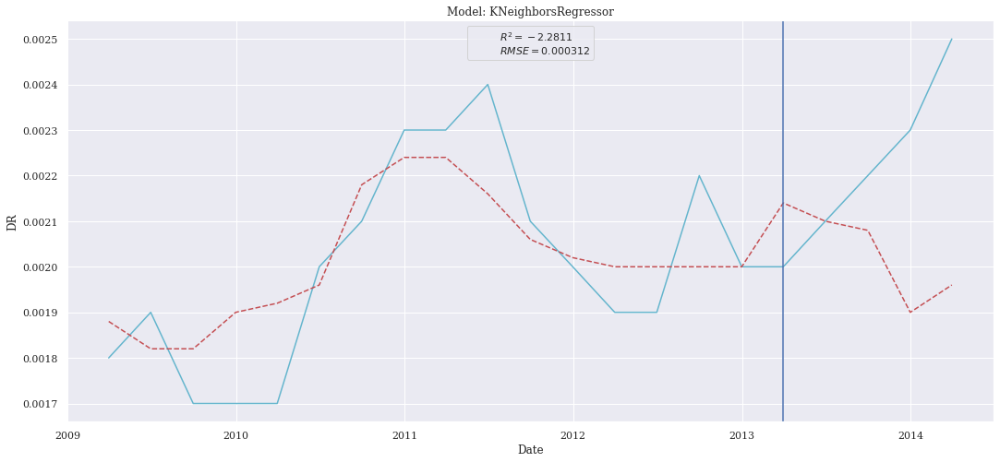

In [23]:
y_train_pred = y_pred(X_train,y_train,X_train,y_train,model=summary.index[0],parameters={"p_knn":params})
y_test_pred = y_pred(X_train,y_train,X_test,y_test,model=summary.index[0],parameters={"p_knn":params})
plot_pred_detail(y_train,y_test,y_train_pred,y_test_pred,index,name_model=summary.index[0],df_score=summary)

### GridSearch on XGBoost

In [24]:
X_train, X_test, y_train, y_test, X_validation = clean_data(data,start,period=period, chronique=b"CHR2",col_used=cl.col_2_kbest,split=split,norm=norm)
params_xgb = {"booster":["gbtree"],"eta":[0.1*i for i in range(1,11)],"gamma":[5*i for i in range(5)],"max_depth":[i for i in range(3,11)],"num_parallel_tree":[1,2,3,4,5],"verbose":[0]}
params,score = params_grid(X_train,y_train,X_test,y_test,"xgb",params_xgb)
print(params,score)

Fitting 2 folds for each of 2000 candidates, totalling 4000 fits
[16:17:29] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-10.9-x86_64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "verbose" } are not used.

[16:17:29] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-10.9-x86_64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "verbose" } are not used.

[16:17:29] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-10.9-x86_64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "verbose" } are not used.

[16:17:29] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-10.9-x86_64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "verbose" } are not used.

[16:17:30] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-10.9-x86_64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "verbose" } are not used.

[16:17:30] WARNING: /Users/run

KeyboardInterrupt: 

In [ ]:
summary = summary_ml(X_train,y_train,X_test,y_test,models=["xgb"],parameters={"p_xgb":params})
summary

In [ ]:
y_train_pred = y_pred(X_train,y_train,X_train,y_train,model=summary.index[0],parameters={"p_xgb":params})
y_test_pred = y_pred(X_train,y_train,X_test,y_test,model=summary.index[0],parameters={"p_xgb":params})
plot_pred_detail(y_train,y_test,y_train_pred,y_test_pred,index,name_model=summary.index[0],df_score=summary)

### GridSearch on CatBoost

In [25]:
X_train, X_test, y_train, y_test, X_validation = clean_data(data,start,period=period, chronique=b"CHR2",col_used=cl.col_2_recur,split=split,norm=norm)
params_cat = {'depth': [i for i in range(1,7)],'learning_rate':[0.01*i for i in range(25,60)],'iterations':[10*i for i in range(15,30)],"verbose":[0]}
params,score = params_grid(X_train,y_train,X_test,y_test,"cat",params_cat)
print(params,score)

Fitting 2 folds for each of 3150 candidates, totalling 6300 fits


In [ ]:
summary = summary_ml(X_train,y_train,X_test,y_test,models=["cat"],parameters={"p_cat":params})
summary

,rmse,mse,mae,r2
Index,,,,
CatBoostRegressor,0.000243,5.901145e-08,0.000214,-0.715449


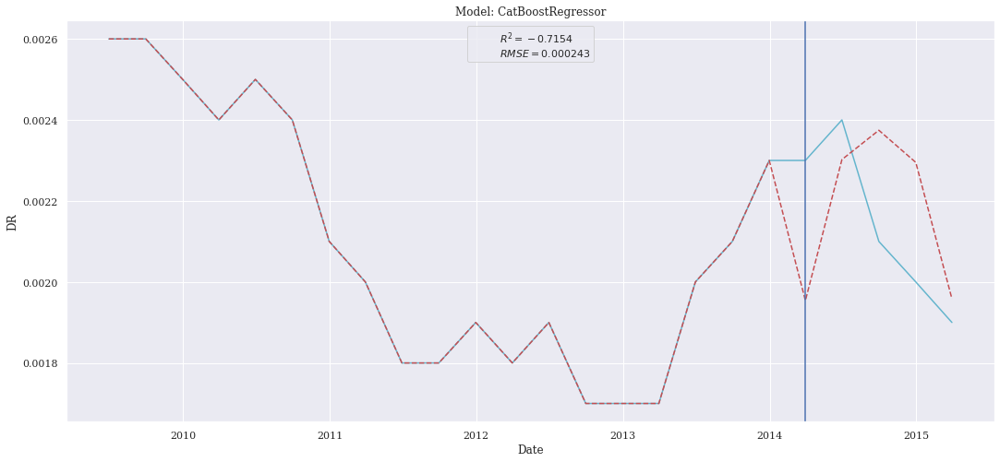

In [ ]:
y_train_pred = y_pred(X_train,y_train,X_train,y_train,model=summary.index[0],parameters={"p_cat":params})
y_test_pred = y_pred(X_train,y_train,X_test,y_test,model=summary.index[0],parameters={"p_cat":params})
plot_pred_detail(y_train,y_test,y_train_pred,y_test_pred,index,name_model=summary.index[0],df_score=summary)

## Final Conclusion
Grid Search is relevant for the KNN model but not for the catboost and xgboost model.
With the knn we have now a r2 equals to 0.855.

# Focus on the Chronique CHR8

## Machine Learning
We will focus on all the different features selection and after we choose the best model, with the best features we will focus on doing a grid search on this model

In [ ]:
chronique=b'CHR8'
start = 1
norm = "MinMax"
split = 0.2

### Correlation Features

In [ ]:
X_train, X_test, y_train, y_test = clean_data(data,start,chronique=chronique,col_used=cl.col_8_corr,split=split,norm=norm)
summary = summary_ml(X_train,y_train,X_test,y_test)
summary

[14:45:50] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/usr/local/lib/python3.7/dist-packages/sklearn/svm/_base.py:1208: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  ConvergenceWarning,


,rmse,mse,mae,r2
Index,,,,
XGBRegressor,0.007580,0.000057,0.006038,-9.659977
CatBoostRegressor,0.008525,0.000073,0.008050,-12.482646
DecisionTreeRegressor,0.008940,0.000080,0.007380,-13.825987
Ridge,0.009173,0.000084,0.007923,-14.610429
KNeighborsRegressor,0.010264,0.000105,0.009748,-18.545696
LinearRegression,0.023194,0.000538,0.020155,-98.797566
LinearSVR,0.023342,0.000545,0.019553,-100.077131


[14:45:50] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[14:45:50] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


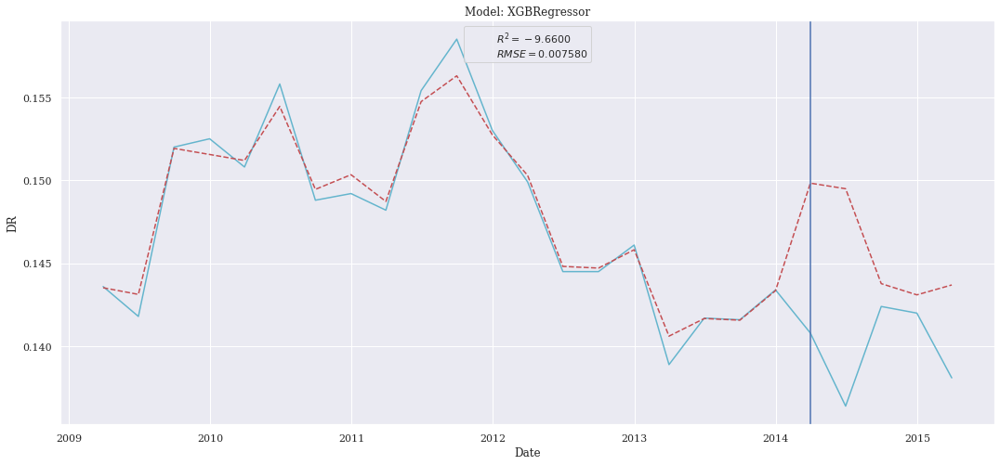

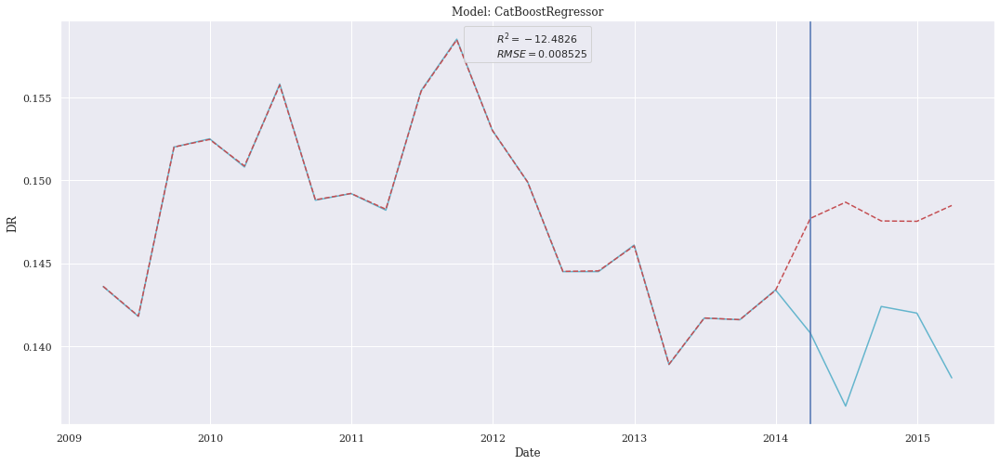

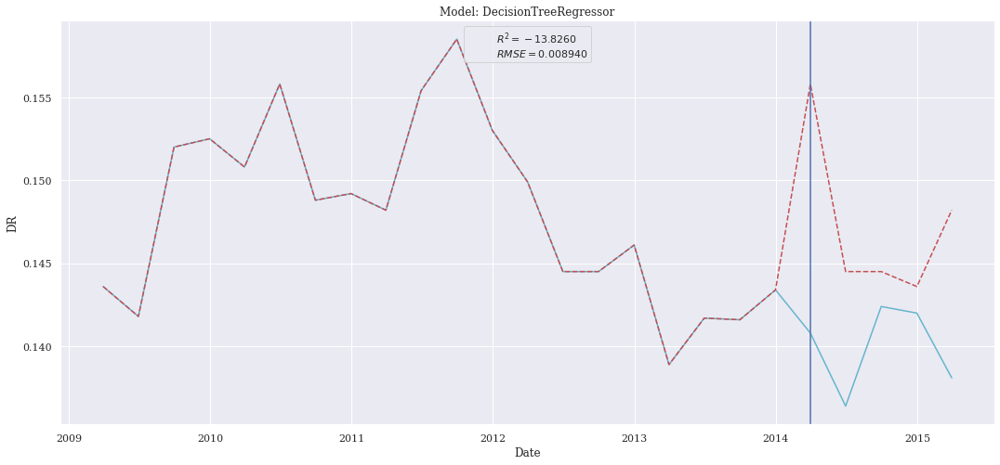

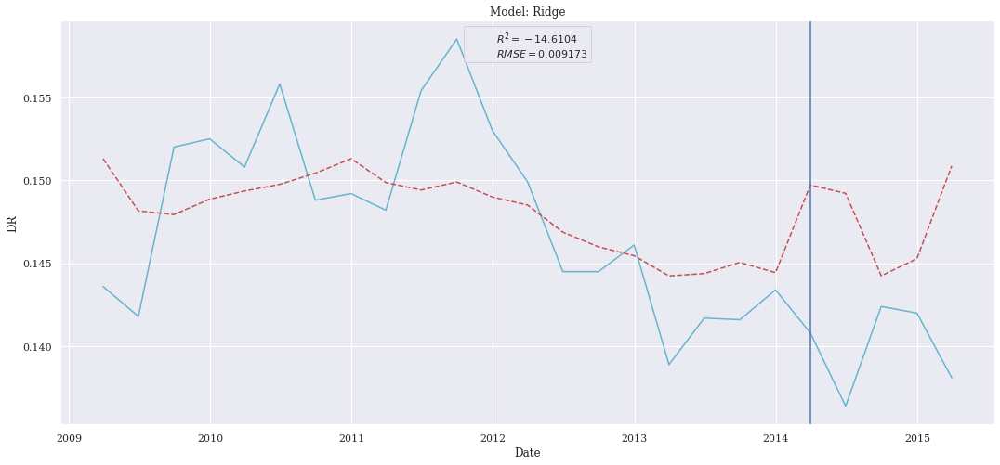

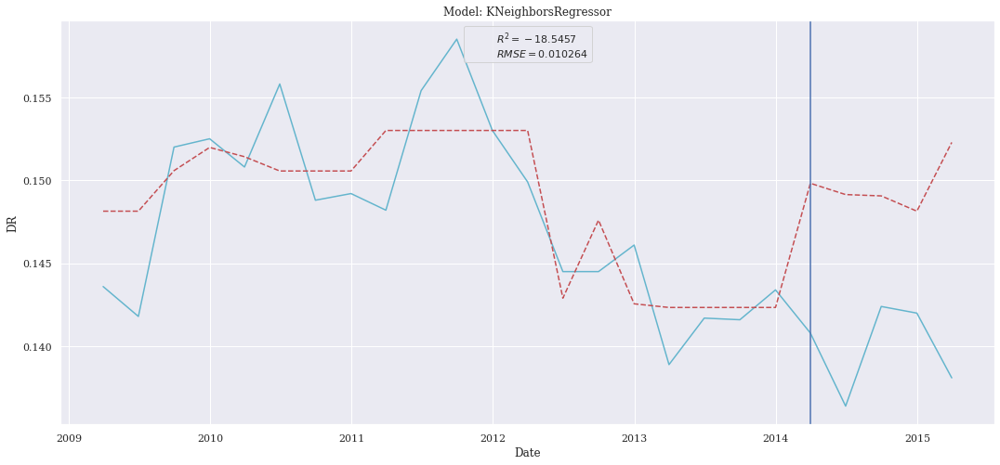

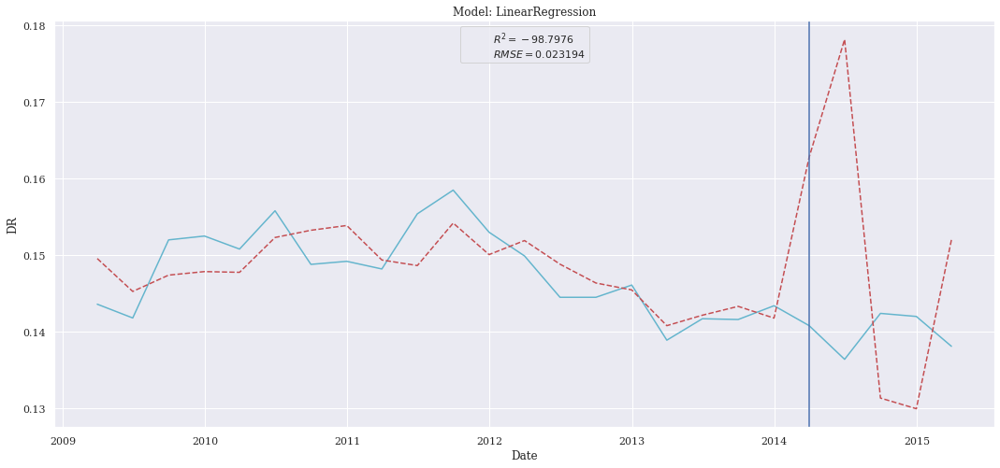

/usr/local/lib/python3.7/dist-packages/sklearn/svm/_base.py:1208: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  ConvergenceWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/svm/_base.py:1208: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  ConvergenceWarning,


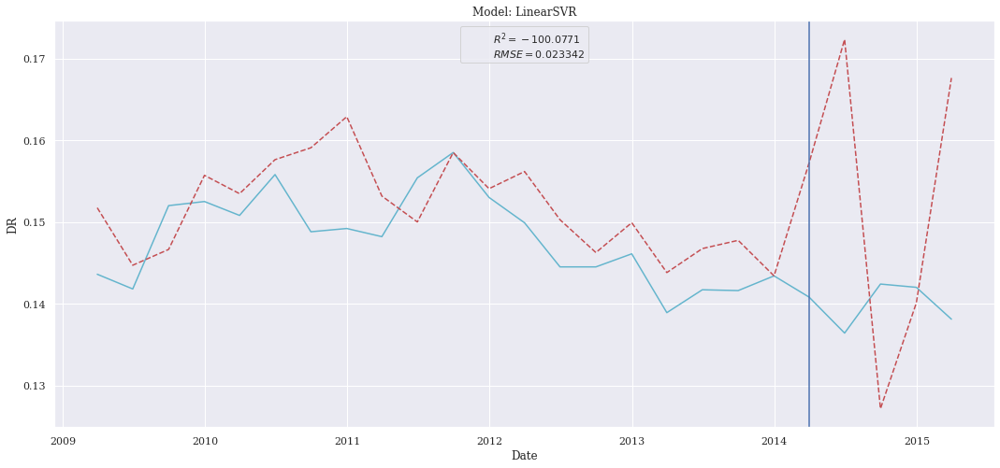

In [ ]:
for i in range(summary.shape[0]): 
  y_train_pred = y_pred(X_train,y_train,X_train,y_train,model=summary.index[i])
  y_test_pred = y_pred(X_train,y_train,X_test,y_test,model=summary.index[i])
  plot_pred_detail(y_train,y_test,y_train_pred,y_test_pred,index[start:],name_model=summary.index[i],df_score=summary)

### Low Variance Features

In [ ]:
X_train, X_test, y_train, y_test = clean_data(data,start,chronique,col_used=cl.col_8_low_var,split=split,norm=norm)
summary = summary_ml(X_train,y_train,X_test,y_test)
summary

[14:45:54] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/usr/local/lib/python3.7/dist-packages/sklearn/svm/_base.py:1208: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  ConvergenceWarning,


,rmse,mse,mae,r2
Index,,,,
CatBoostRegressor,0.007988,0.000064,0.007631,-10.837634
Ridge,0.008867,0.000079,0.008366,-13.586976
KNeighborsRegressor,0.009559,0.000091,0.009212,-15.951781
XGBRegressor,0.009758,0.000095,0.008522,-16.664841
DecisionTreeRegressor,0.012091,0.000146,0.010260,-26.121178
LinearRegression,0.018684,0.000349,0.015760,-63.758622
LinearSVR,0.033114,0.001097,0.030933,-202.420465


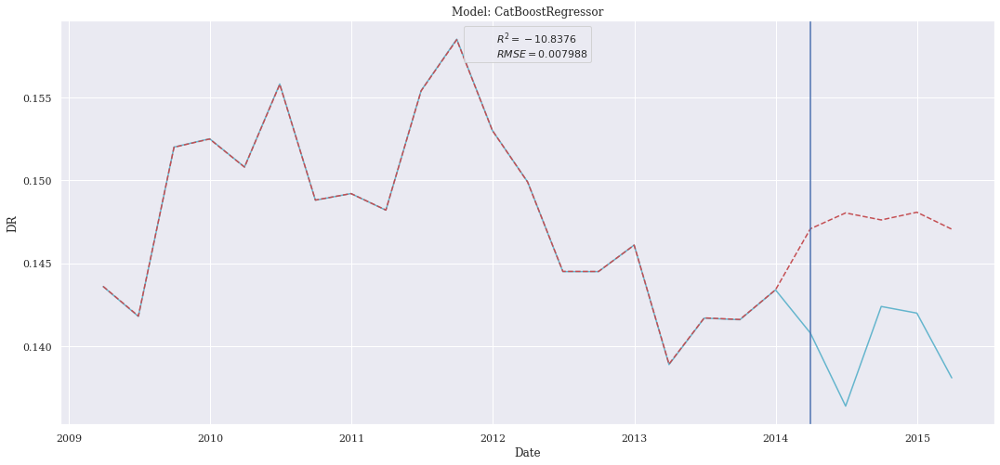

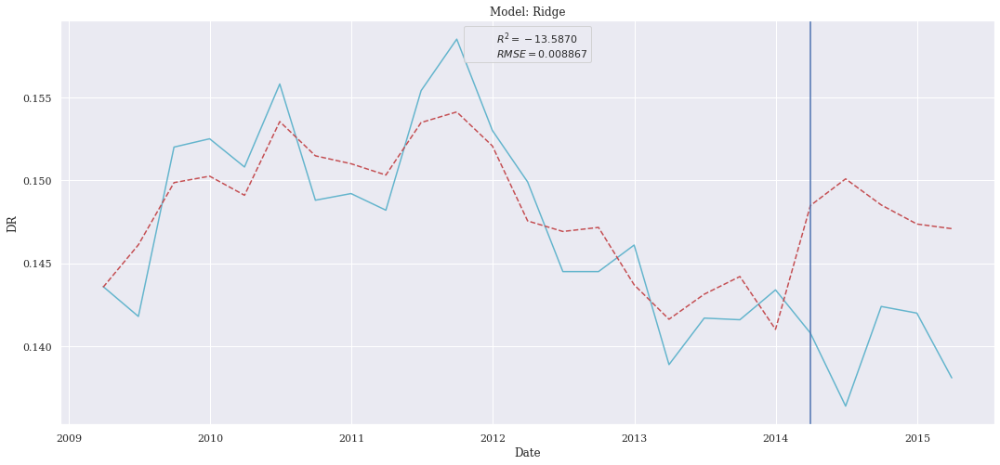

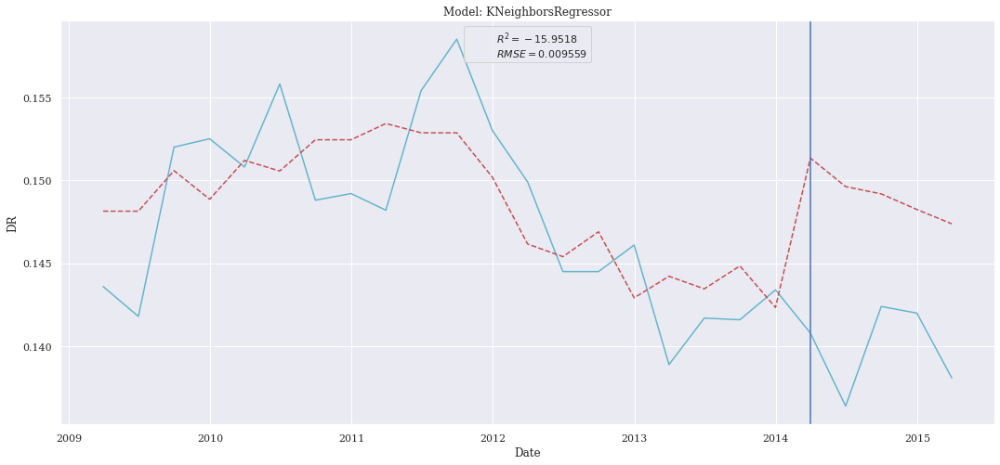

[14:45:58] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[14:45:58] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


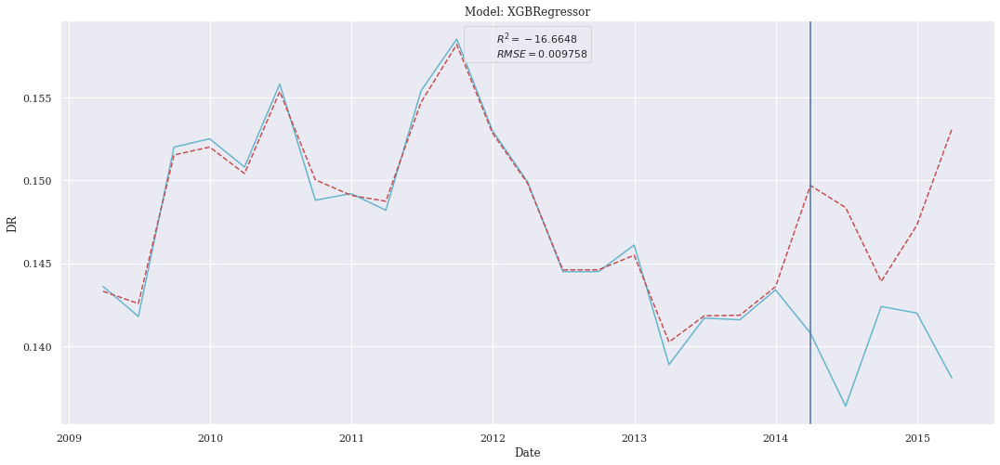

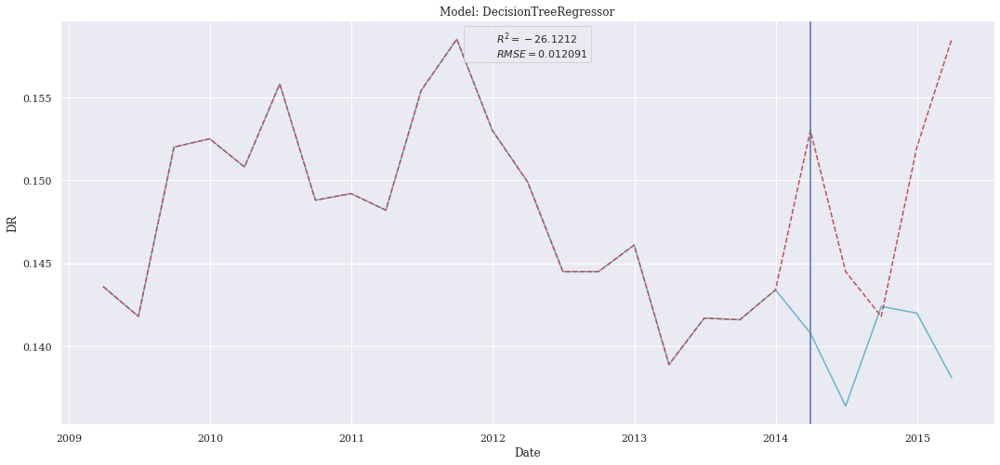

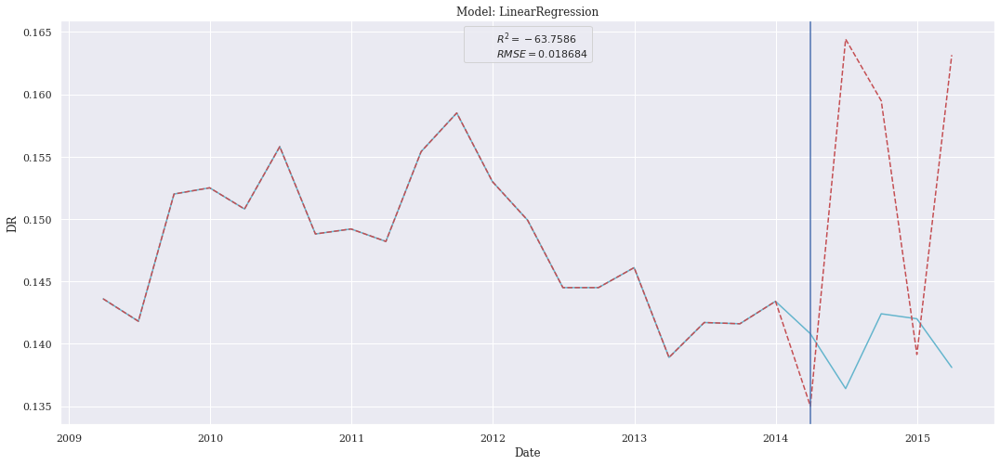

/usr/local/lib/python3.7/dist-packages/sklearn/svm/_base.py:1208: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  ConvergenceWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/svm/_base.py:1208: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  ConvergenceWarning,


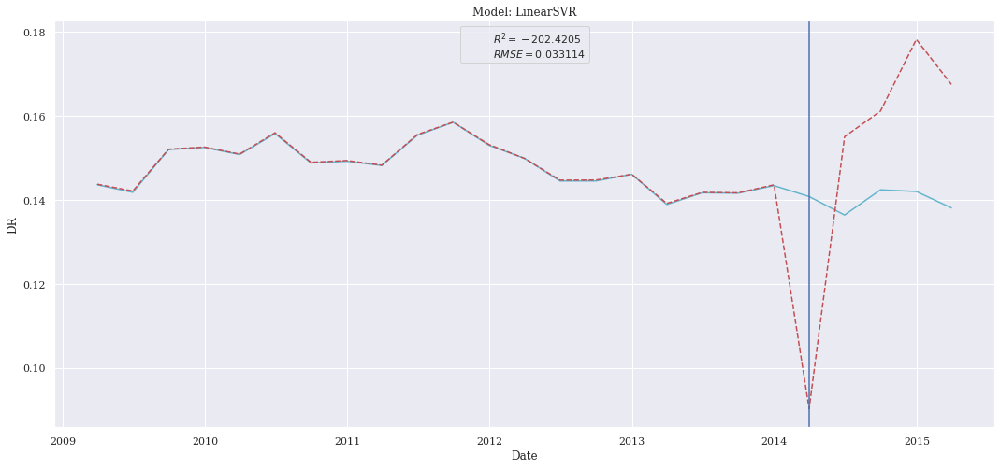

In [ ]:
for i in range(summary.shape[0]): 
  y_train_pred = y_pred(X_train,y_train,X_train,y_train,model=summary.index[i])
  y_test_pred = y_pred(X_train,y_train,X_test,y_test,model=summary.index[i])
  plot_pred_detail(y_train,y_test,y_train_pred,y_test_pred,index[start:],name_model=summary.index[i],df_score=summary)

### KBest Features

In [ ]:
X_train, X_test, y_train, y_test = clean_data(data,start,chronique,col_used=cl.col_8_kbest,split=split,norm=norm)
summary = summary_ml(X_train,y_train,X_test,y_test)
summary

[14:45:59] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/usr/local/lib/python3.7/dist-packages/sklearn/svm/_base.py:1208: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  ConvergenceWarning,


,rmse,mse,mae,r2
Index,,,,
Ridge,0.006600,0.000044,0.005316,-7.081376
CatBoostRegressor,0.008458,0.000072,0.007973,-12.269896
KNeighborsRegressor,0.010069,0.000101,0.008988,-17.808534
XGBRegressor,0.010262,0.000105,0.008829,-18.537421
DecisionTreeRegressor,0.011549,0.000133,0.009560,-23.741763
LinearRegression,0.019535,0.000382,0.017508,-69.793420
LinearSVR,0.030060,0.000904,0.025240,-166.631577


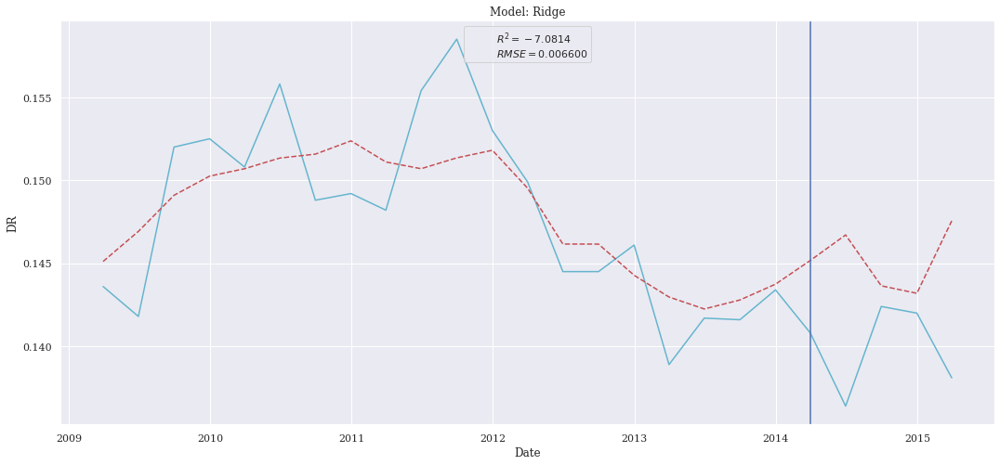

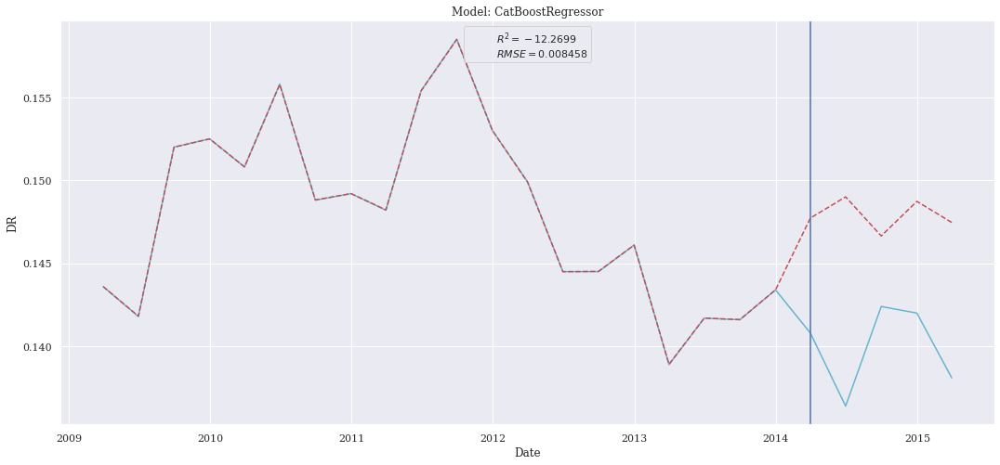

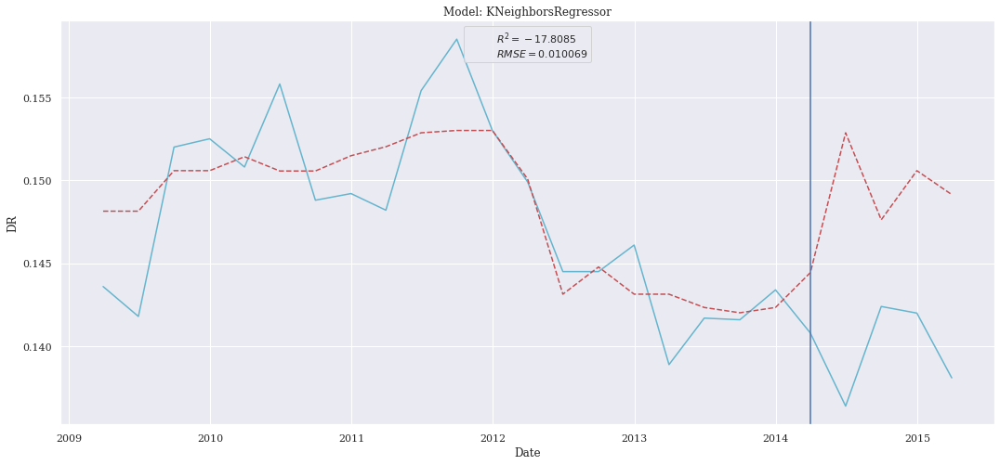

[14:46:03] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[14:46:03] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


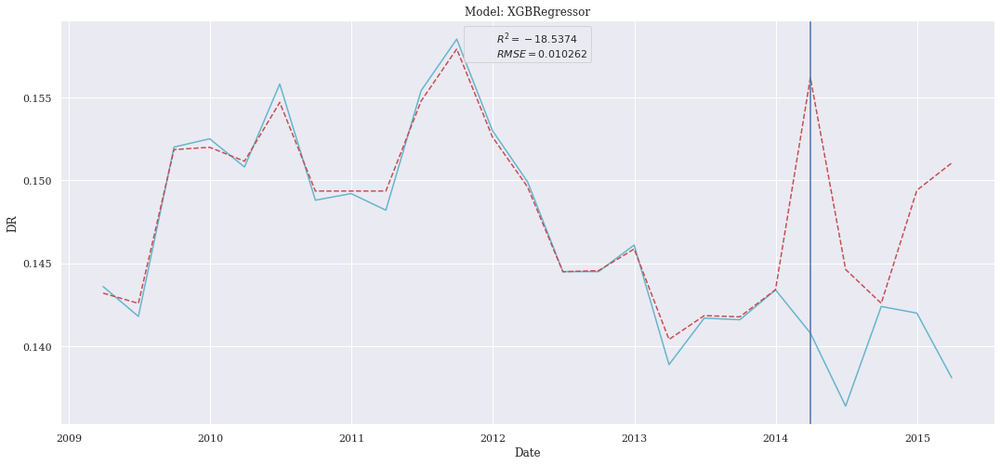

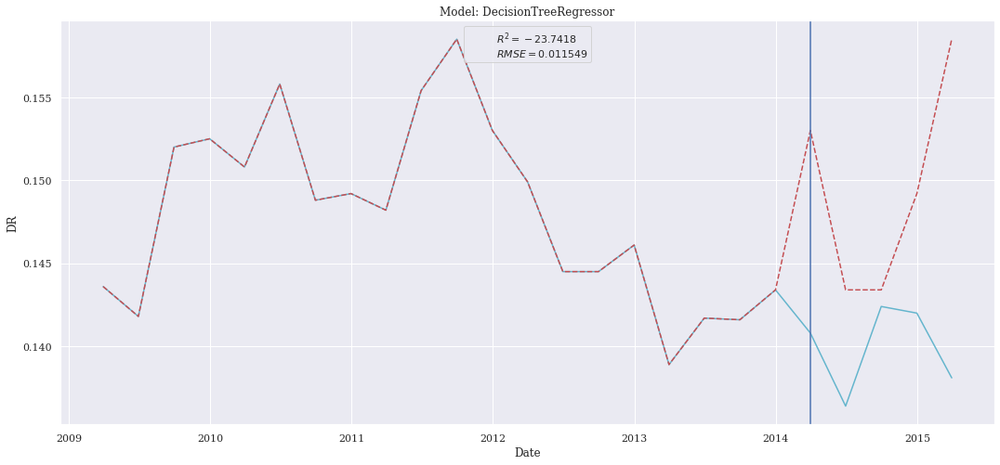

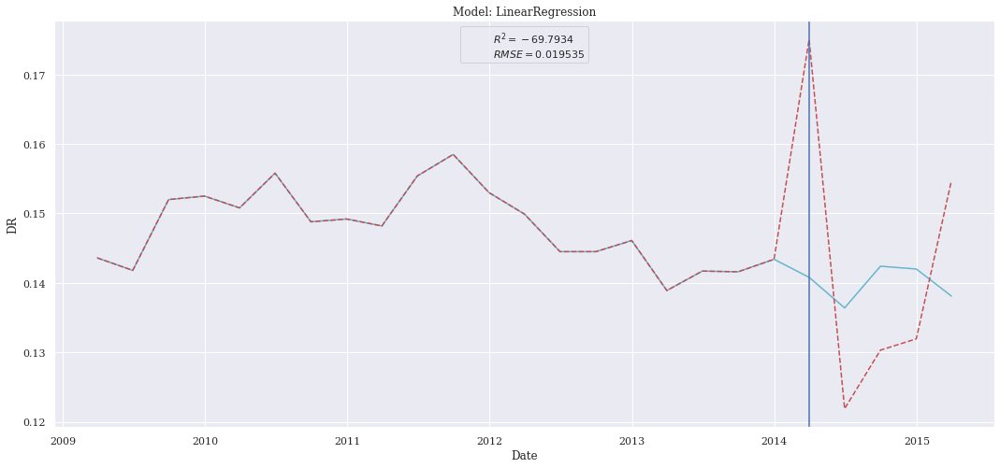

/usr/local/lib/python3.7/dist-packages/sklearn/svm/_base.py:1208: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  ConvergenceWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/svm/_base.py:1208: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  ConvergenceWarning,


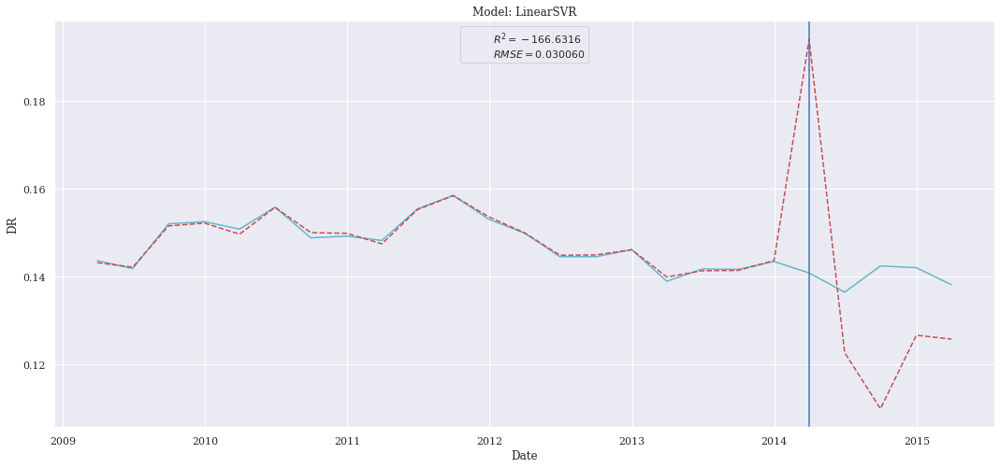

In [ ]:
for i in range(summary.shape[0]): 
  y_train_pred = y_pred(X_train,y_train,X_train,y_train,model=summary.index[i])
  y_test_pred = y_pred(X_train,y_train,X_test,y_test,model=summary.index[i])
  plot_pred_detail(y_train,y_test,y_train_pred,y_test_pred,index[start:],name_model=summary.index[i],df_score=summary)

### Recursive Features

In [ ]:
X_train, X_test, y_train, y_test = clean_data(data,start,chronique,col_used=cl.col_8_recur,split=split,norm=norm)
summary = summary_ml(X_train,y_train,X_test,y_test)
summary

[14:46:05] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/usr/local/lib/python3.7/dist-packages/sklearn/svm/_base.py:1208: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  ConvergenceWarning,


,rmse,mse,mae,r2
Index,,,,
Ridge,0.006940,0.000048,0.006461,-7.934526
LinearSVR,0.007654,0.000059,0.006033,-9.869085
CatBoostRegressor,0.007936,0.000063,0.007715,-10.685136
KNeighborsRegressor,0.009427,0.000089,0.009056,-15.484892
XGBRegressor,0.010048,0.000101,0.008836,-17.731513
DecisionTreeRegressor,0.010576,0.000112,0.008080,-19.750223
LinearRegression,0.079931,0.006389,0.070229,-1184.260937


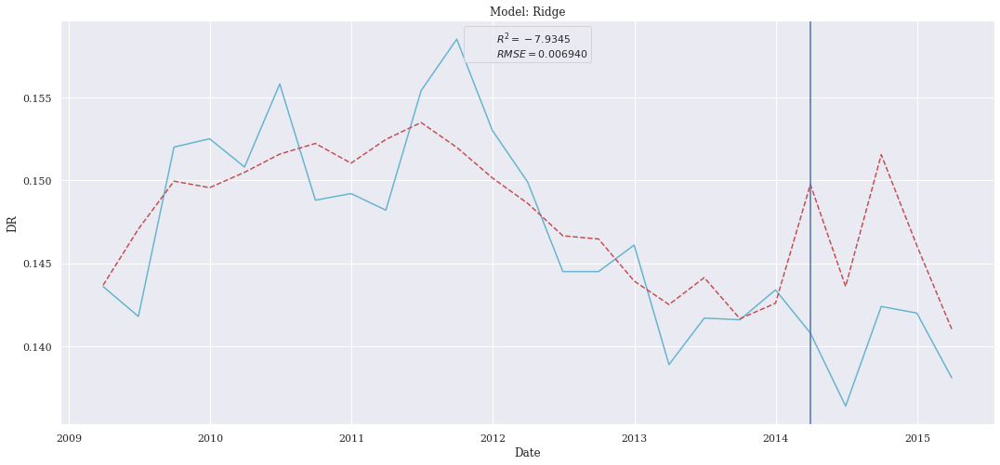

/usr/local/lib/python3.7/dist-packages/sklearn/svm/_base.py:1208: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  ConvergenceWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/svm/_base.py:1208: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  ConvergenceWarning,


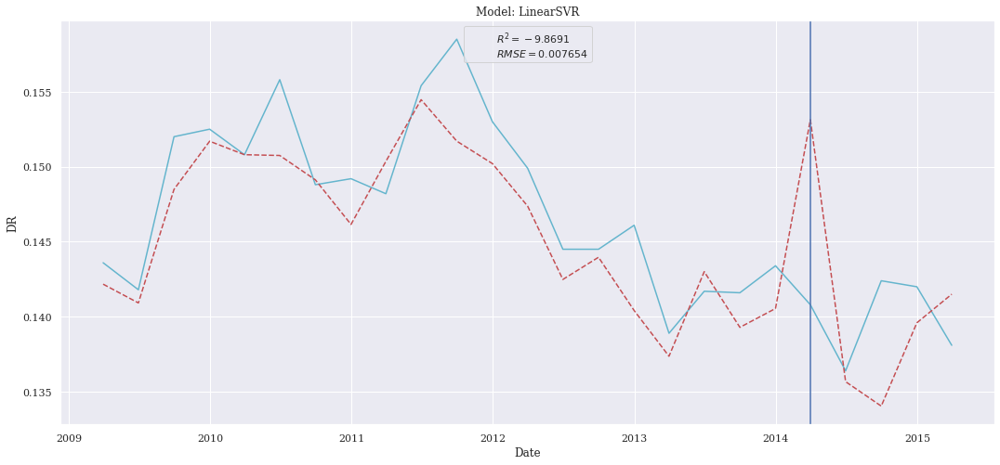

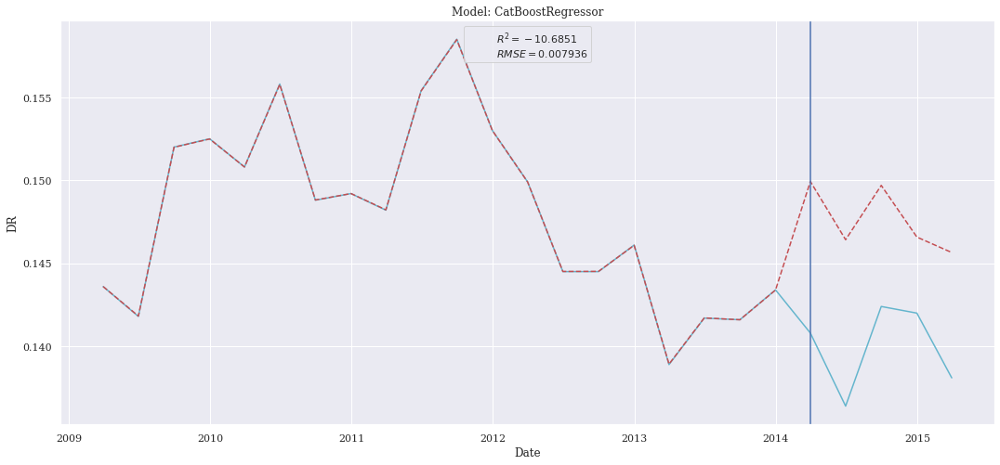

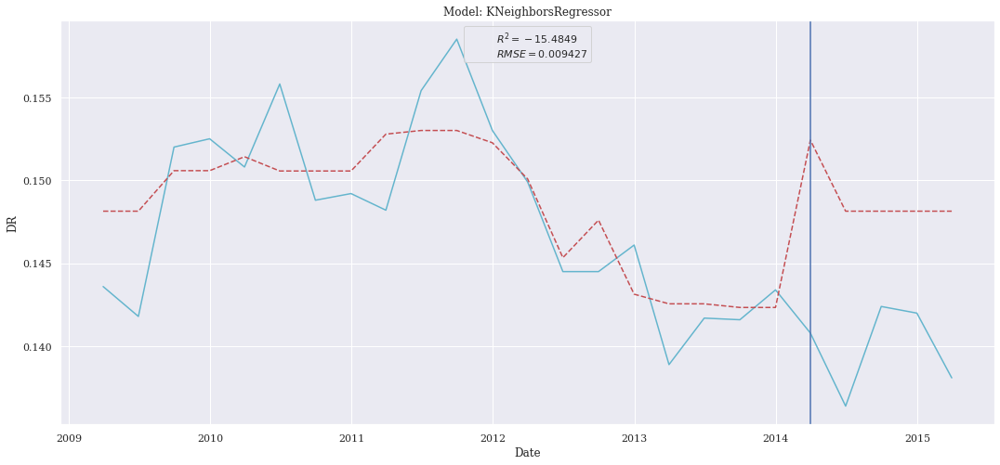

[14:46:08] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[14:46:08] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


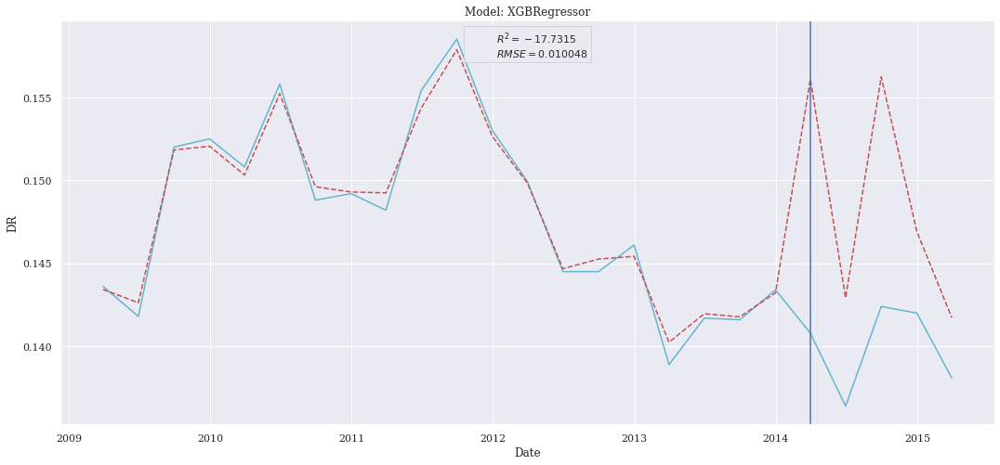

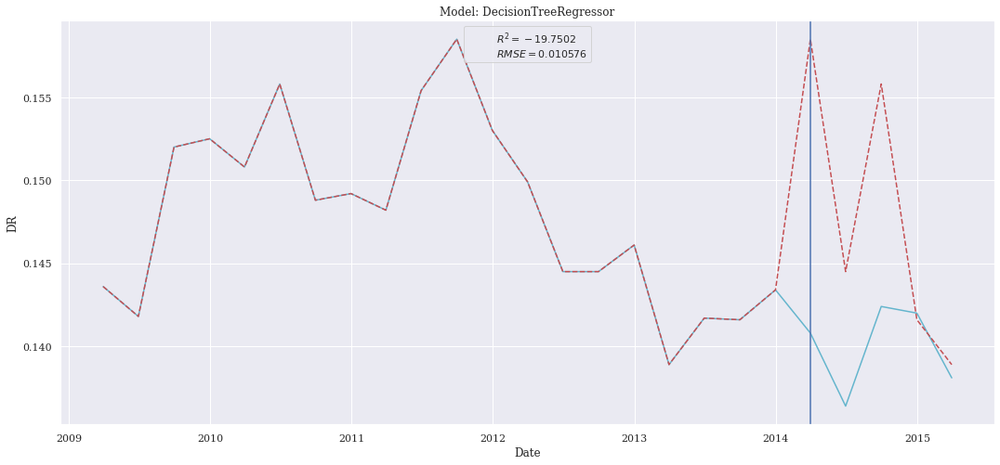

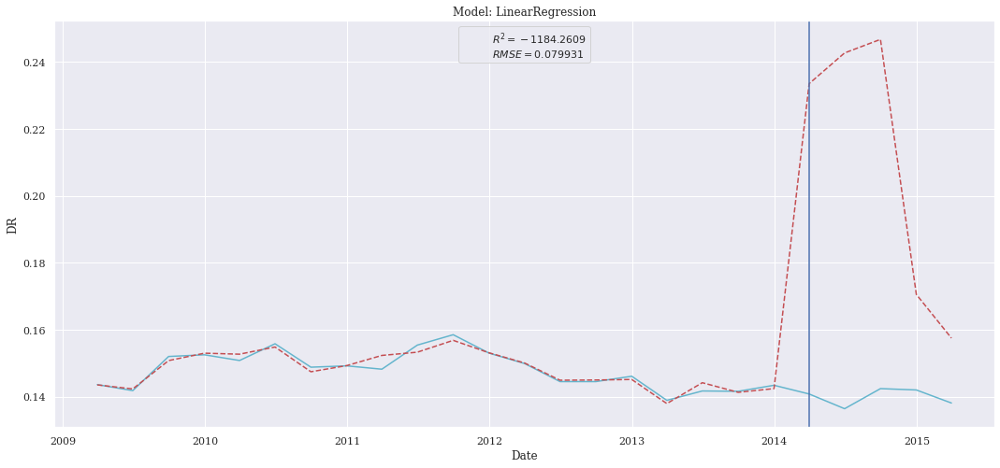

In [ ]:
for i in range(summary.shape[0]): 
  y_train_pred = y_pred(X_train,y_train,X_train,y_train,model=summary.index[i])
  y_test_pred = y_pred(X_train,y_train,X_test,y_test,model=summary.index[i])
  plot_pred_detail(y_train,y_test,y_train_pred,y_test_pred,index[start:],name_model=summary.index[i],df_score=summary)

### SelectFromModel Features

In [ ]:
X_train, X_test, y_train, y_test = clean_data(data,start,chronique,col_used=cl.col_8_sfm,split=split,norm=norm)
summary = summary_ml(X_train,y_train,X_test,y_test)
summary

[14:46:09] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/usr/local/lib/python3.7/dist-packages/sklearn/svm/_base.py:1208: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  ConvergenceWarning,


,rmse,mse,mae,r2
Index,,,,
CatBoostRegressor,0.008496,0.000072,0.007950,-12.390201
KNeighborsRegressor,0.008692,0.000076,0.008016,-13.017038
Ridge,0.010314,0.000106,0.008658,-18.734816
DecisionTreeRegressor,0.011656,0.000136,0.008960,-24.206293
XGBRegressor,0.011965,0.000143,0.010823,-25.556957
LinearSVR,0.016995,0.000289,0.014787,-52.580065
LinearRegression,0.048478,0.002350,0.036035,-434.977857


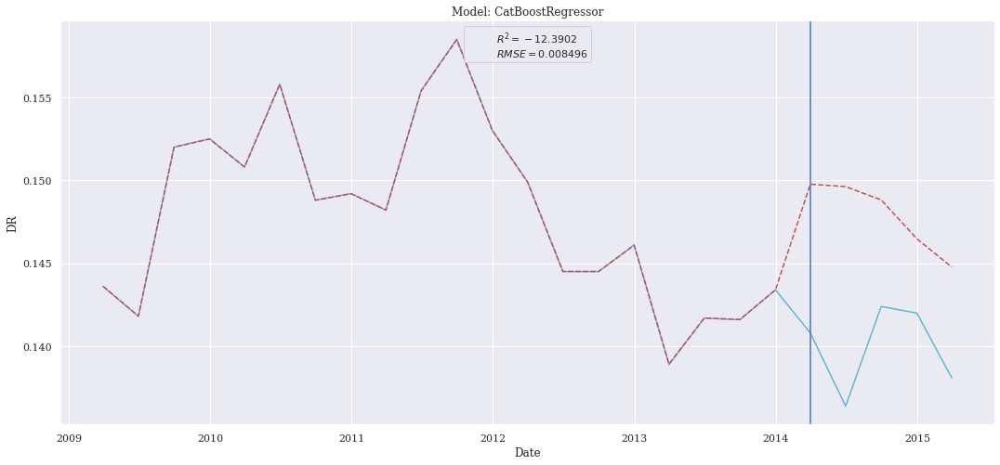

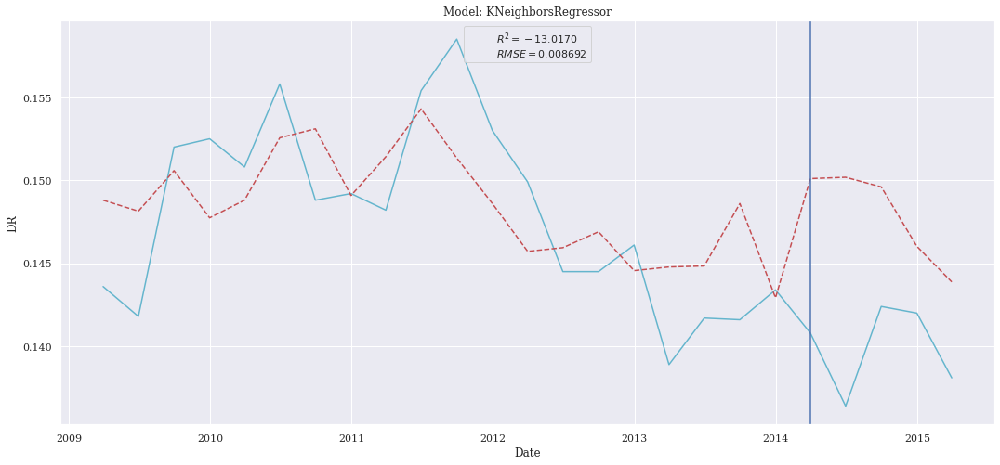

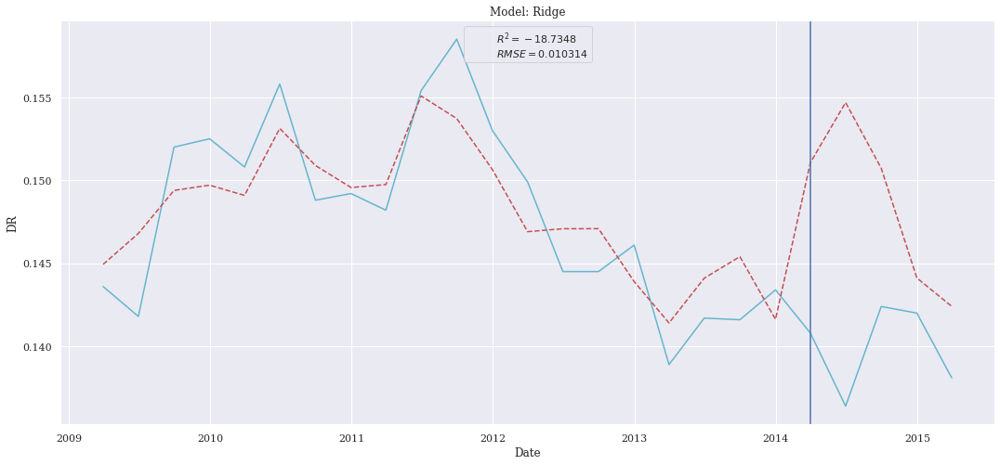

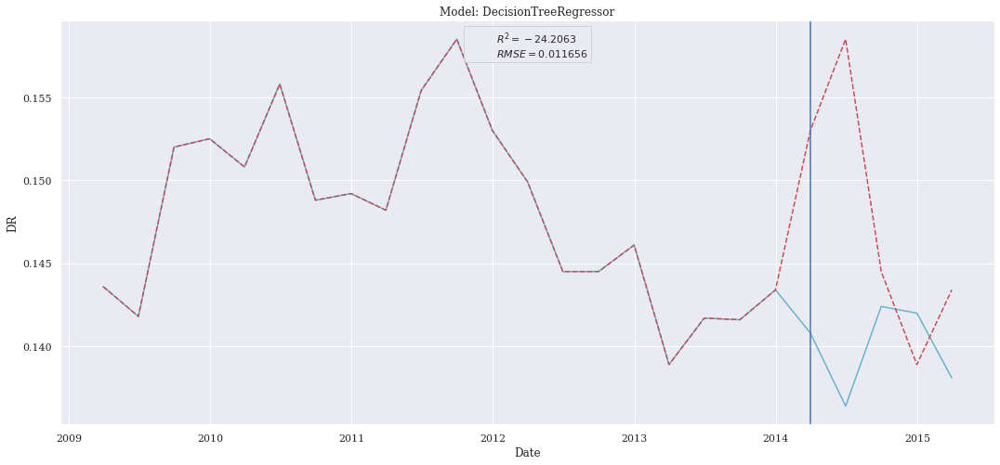

[14:46:13] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[14:46:13] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


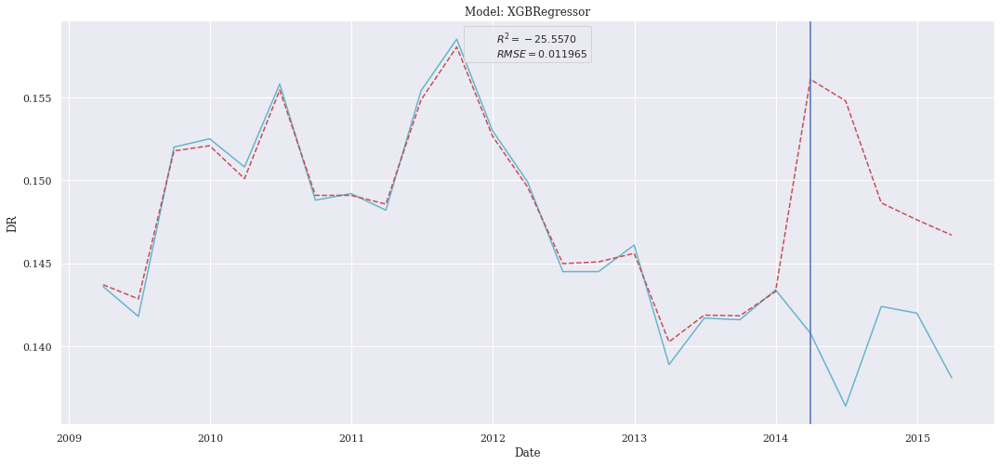

/usr/local/lib/python3.7/dist-packages/sklearn/svm/_base.py:1208: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  ConvergenceWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/svm/_base.py:1208: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  ConvergenceWarning,


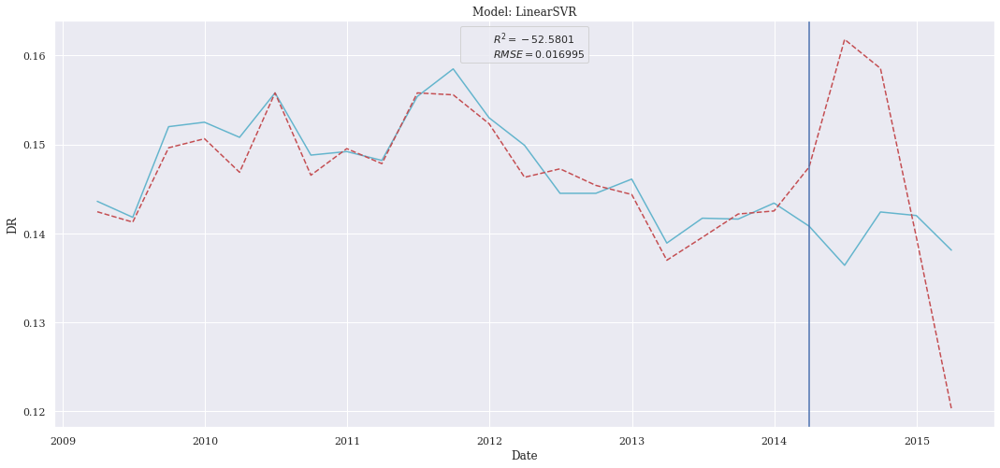

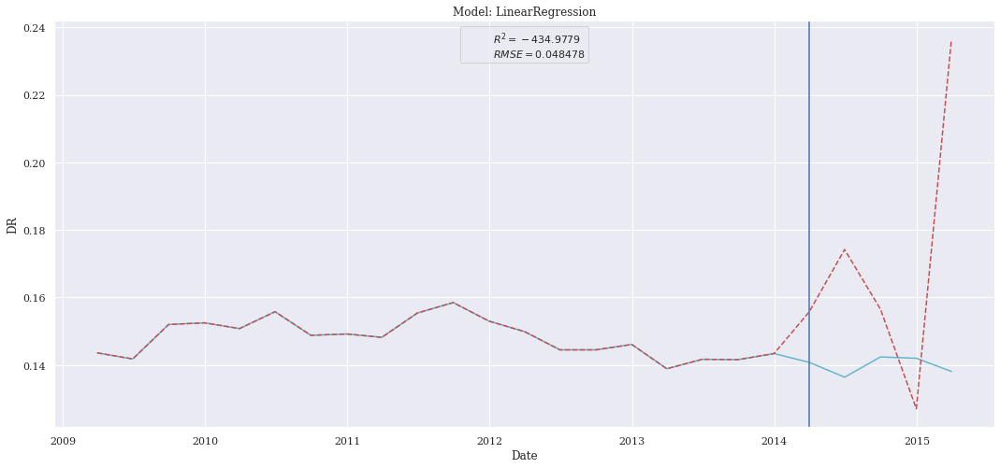

In [ ]:
for i in range(summary.shape[0]): 
  y_train_pred = y_pred(X_train,y_train,X_train,y_train,model=summary.index[i])
  y_test_pred = y_pred(X_train,y_train,X_test,y_test,model=summary.index[i])
  plot_pred_detail(y_train,y_test,y_train_pred,y_test_pred,index[start:],name_model=summary.index[i],df_score=summary)

### Tree-Based Features

In [ ]:
X_train, X_test, y_train, y_test = clean_data(data,start,chronique,col_used=cl.col_8_tree,split=split,norm=norm)
summary = summary_ml(X_train,y_train,X_test,y_test)
summary

[14:46:14] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/usr/local/lib/python3.7/dist-packages/sklearn/svm/_base.py:1208: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  ConvergenceWarning,


,rmse,mse,mae,r2
Index,,,,
XGBRegressor,0.007765,0.000060,0.007222,-10.186138
CatBoostRegressor,0.008099,0.000066,0.007828,-11.167405
Ridge,0.009251,0.000086,0.008162,-14.875917
DecisionTreeRegressor,0.009524,0.000091,0.007840,-15.829178
KNeighborsRegressor,0.009809,0.000096,0.008980,-16.848783
LinearRegression,0.011698,0.000137,0.009041,-24.385542
LinearSVR,0.017303,0.000299,0.015756,-54.542483


[14:46:15] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[14:46:15] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


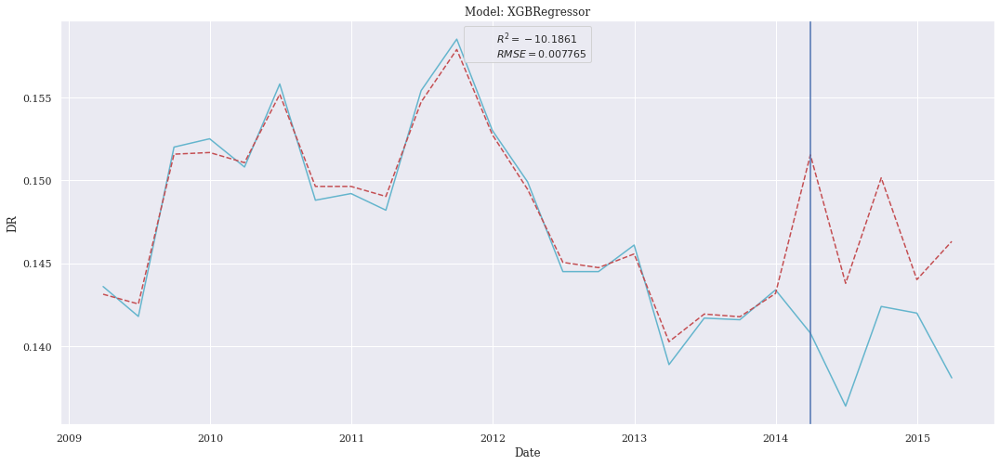

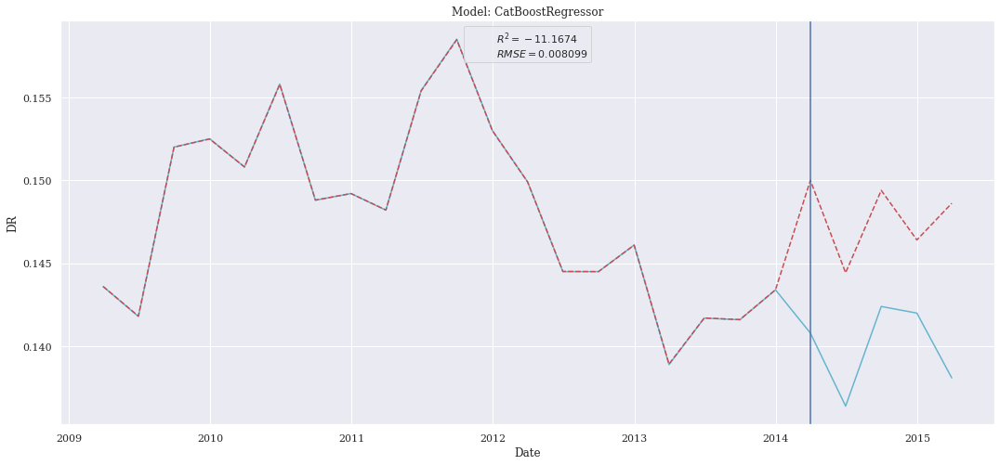

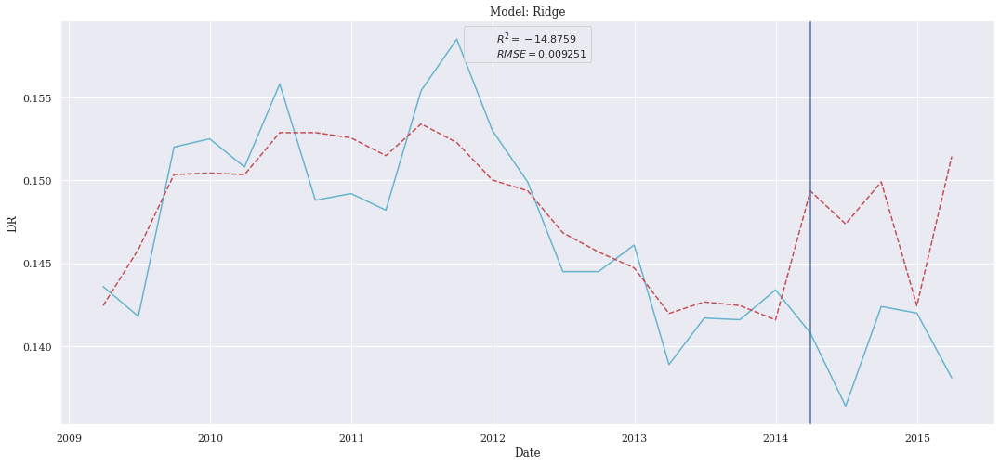

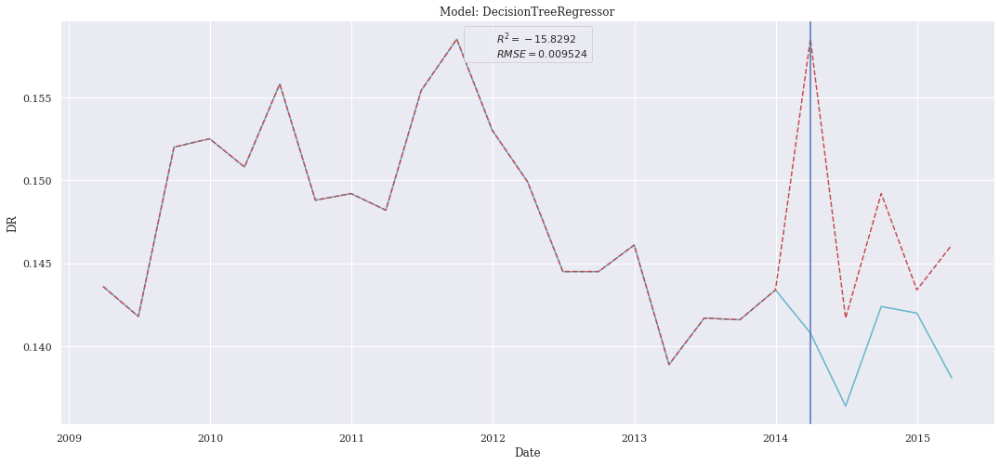

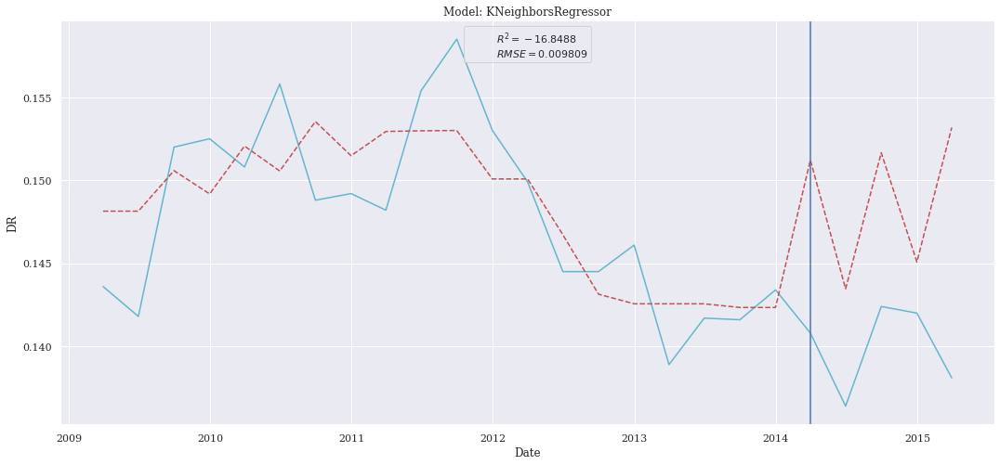

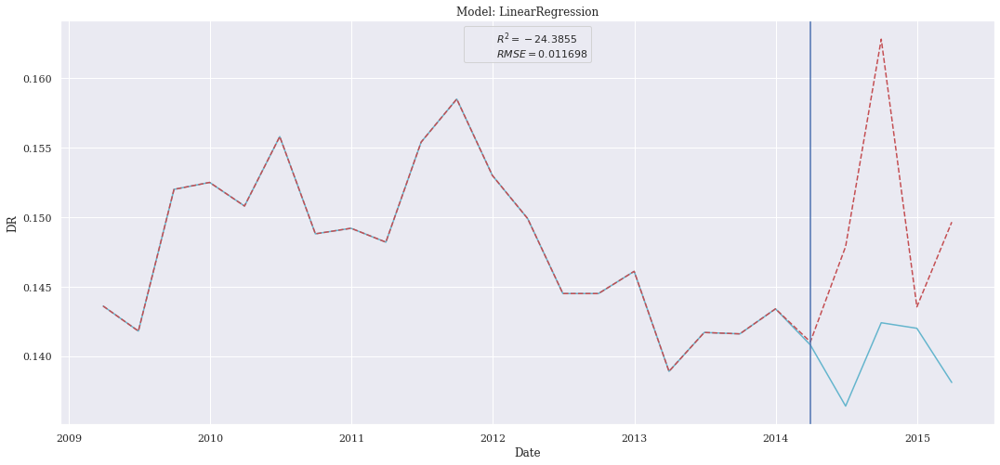

/usr/local/lib/python3.7/dist-packages/sklearn/svm/_base.py:1208: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  ConvergenceWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/svm/_base.py:1208: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  ConvergenceWarning,


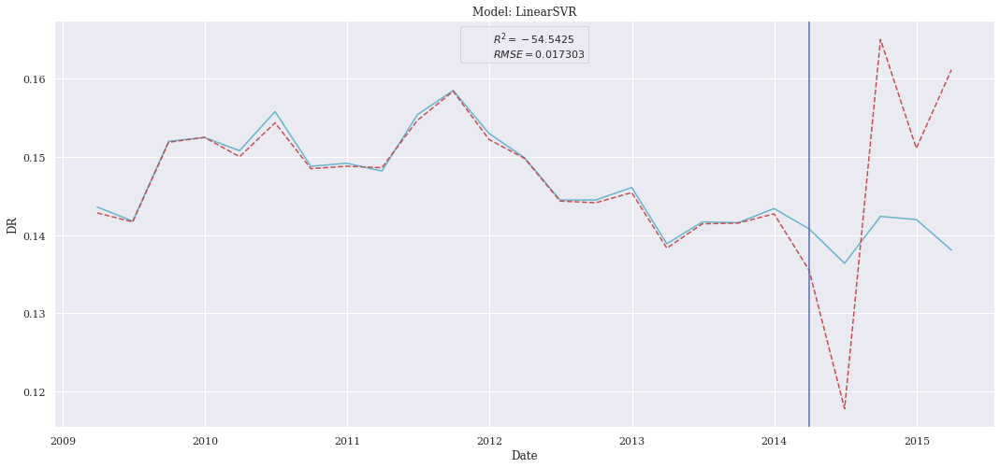

In [ ]:
for i in range(summary.shape[0]): 
  y_train_pred = y_pred(X_train,y_train,X_train,y_train,model=summary.index[i])
  y_test_pred = y_pred(X_train,y_train,X_test,y_test,model=summary.index[i])
  plot_pred_detail(y_train,y_test,y_train_pred,y_test_pred,index[start:],name_model=summary.index[i],df_score=summary)

### Sequential Forward Features

In [ ]:
X_train, X_test, y_train, y_test = clean_data(data,start,chronique,col_used=cl.col_8_seq_for,split=split,norm=norm)
summary = summary_ml(X_train,y_train,X_test,y_test)
summary

[14:46:19] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/usr/local/lib/python3.7/dist-packages/sklearn/svm/_base.py:1208: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  ConvergenceWarning,


,rmse,mse,mae,r2
Index,,,,
DecisionTreeRegressor,0.003982,0.000016,0.003320,-1.942268
CatBoostRegressor,0.008532,0.000073,0.008170,-12.504996
XGBRegressor,0.008858,0.000078,0.007794,-13.557614
Ridge,0.009102,0.000083,0.008476,-14.370198
KNeighborsRegressor,0.010755,0.000116,0.010508,-20.460211
LinearSVR,0.025730,0.000662,0.018987,-121.813439
LinearRegression,0.111407,0.012412,0.063894,-2301.521996


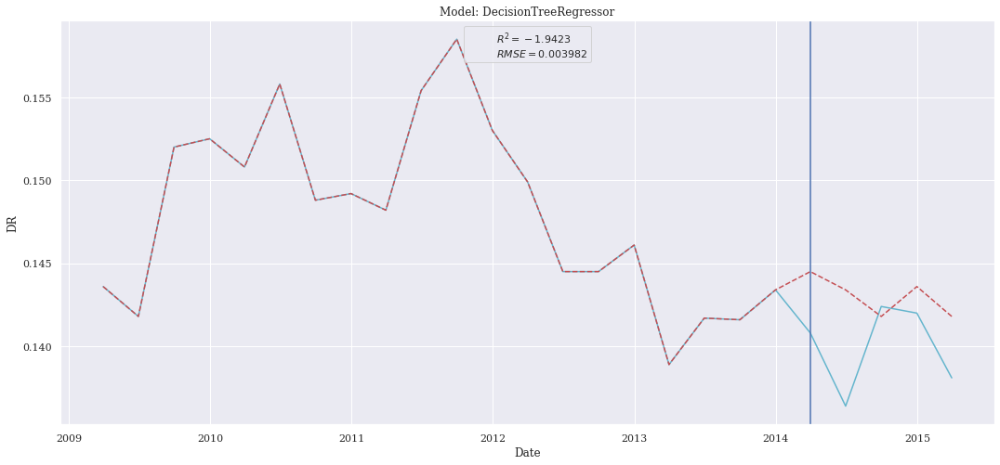

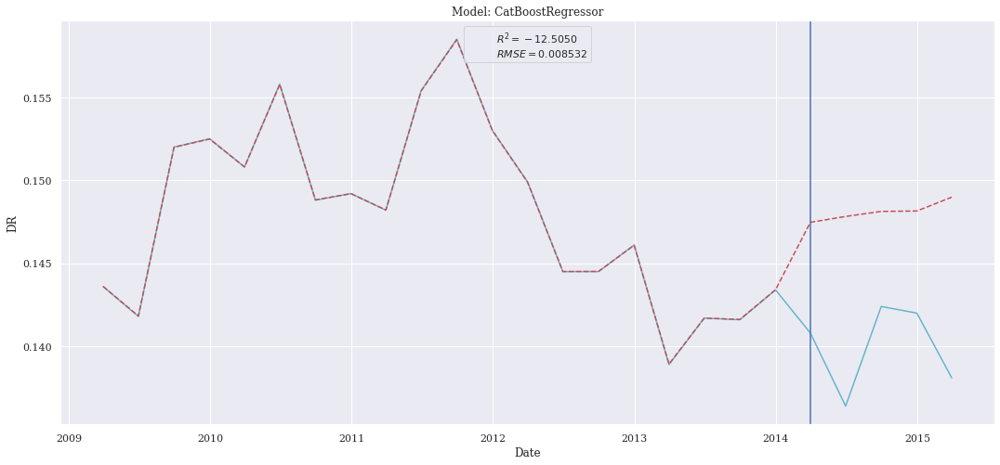

[14:46:22] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[14:46:22] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


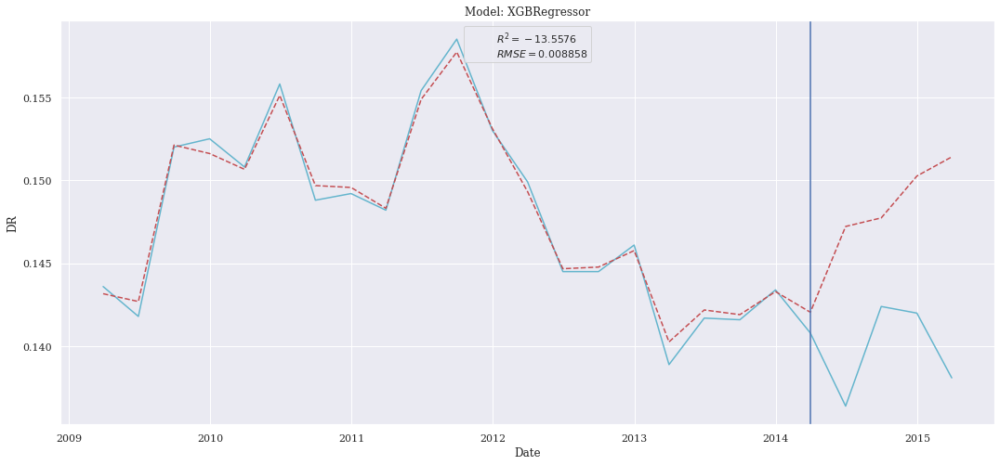

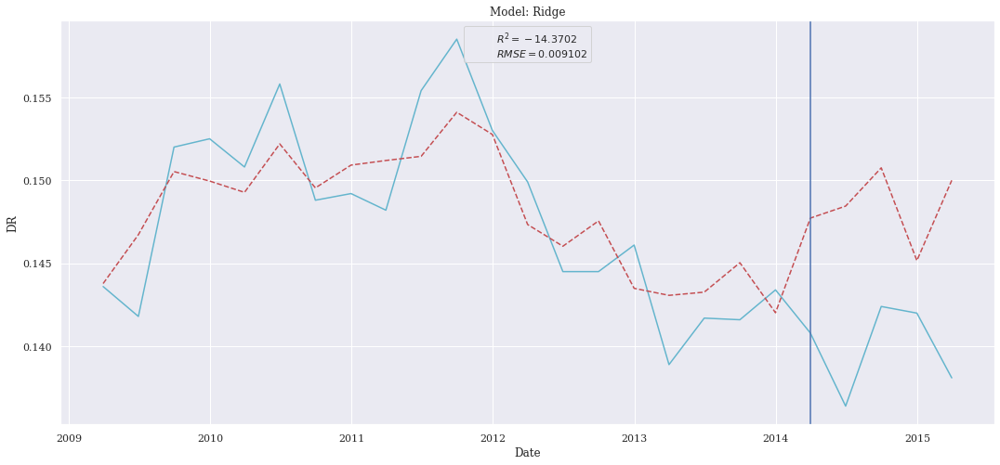

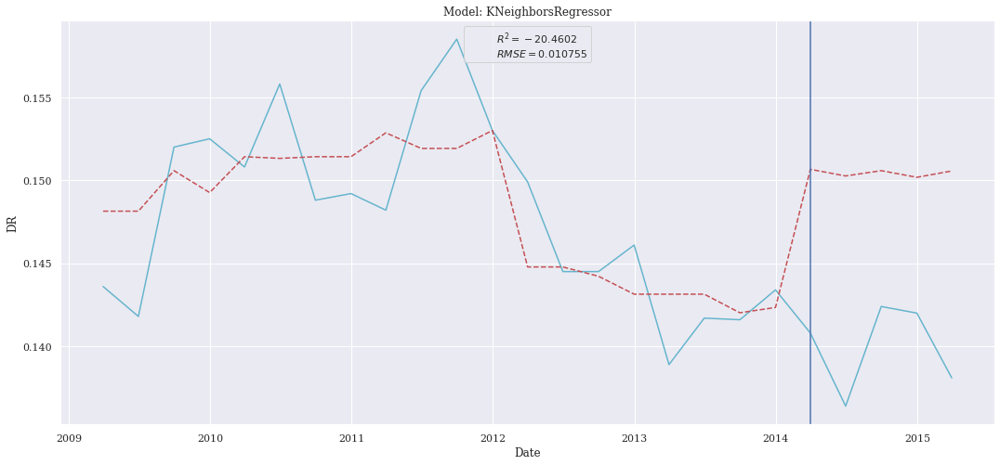

/usr/local/lib/python3.7/dist-packages/sklearn/svm/_base.py:1208: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  ConvergenceWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/svm/_base.py:1208: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  ConvergenceWarning,


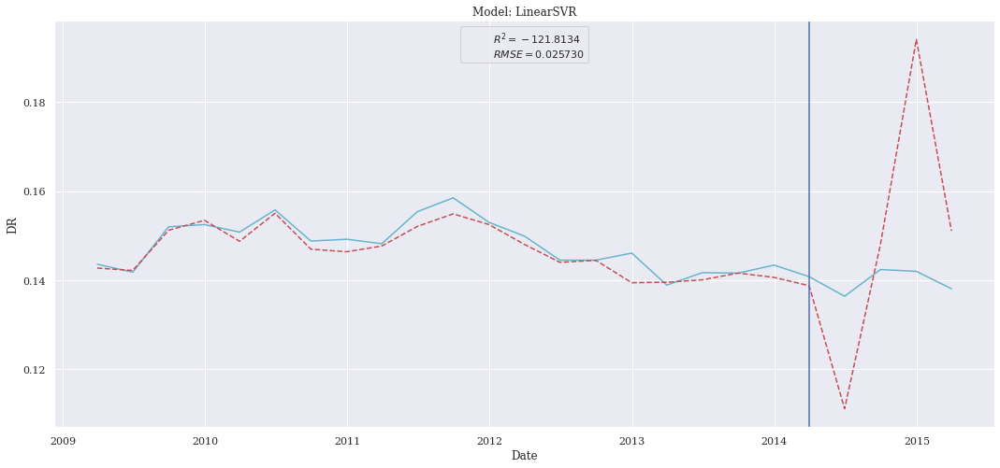

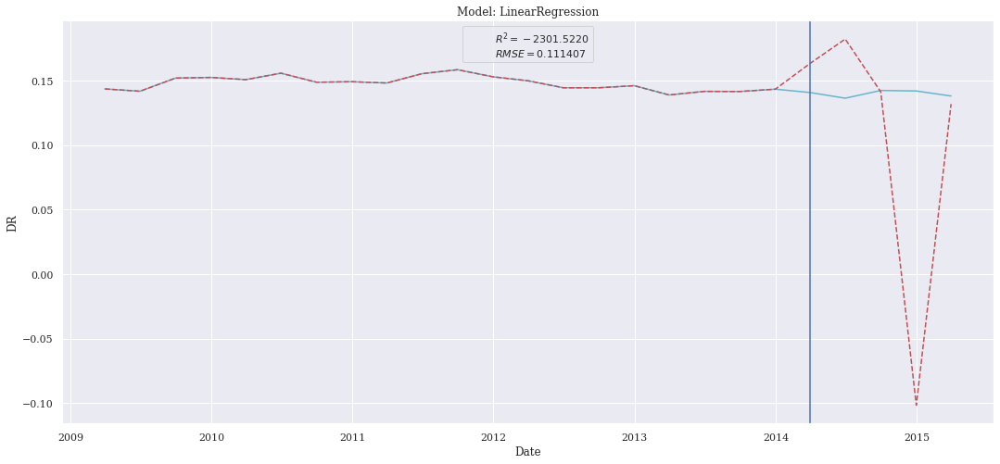

In [ ]:
for i in range(summary.shape[0]):
  y_train_pred = y_pred(X_train,y_train,X_train,y_train,model=summary.index[i])
  y_test_pred = y_pred(X_train,y_train,X_test,y_test,model=summary.index[i])
  plot_pred_detail(y_train,y_test,y_train_pred,y_test_pred,index[start:],name_model=summary.index[i],df_score=summary)

### Sequential Backward Features

In [ ]:
X_train, X_test, y_train, y_test = clean_data(data,start,chronique,col_used=cl.col_8_seq_bac,split=split,norm=norm)
summary = summary_ml(X_train,y_train,X_test,y_test)
summary

[14:46:24] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/usr/local/lib/python3.7/dist-packages/sklearn/svm/_base.py:1208: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  ConvergenceWarning,


,rmse,mse,mae,r2
Index,,,,
CatBoostRegressor,0.007563,0.000057,0.007264,-9.610997
Ridge,0.007698,0.000059,0.006190,-9.994203
KNeighborsRegressor,0.008714,0.000076,0.008172,-13.085827
XGBRegressor,0.009451,0.000089,0.008653,-15.571811
DecisionTreeRegressor,0.009647,0.000093,0.007820,-16.264396
LinearSVR,0.019176,0.000368,0.014698,-67.219965
LinearRegression,0.045146,0.002038,0.044147,-377.113043


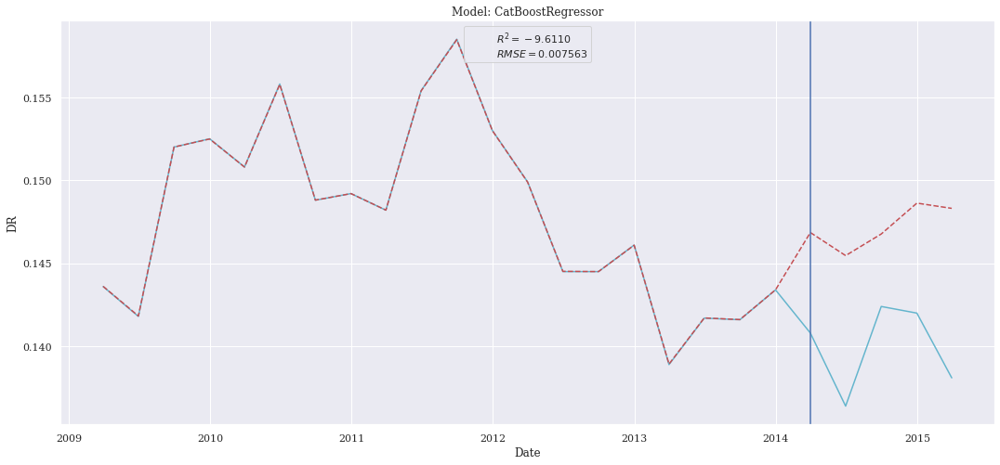

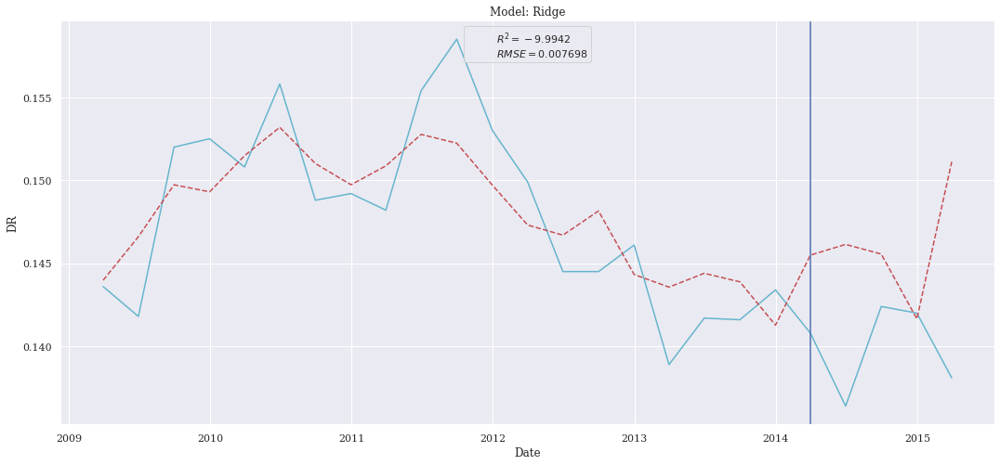

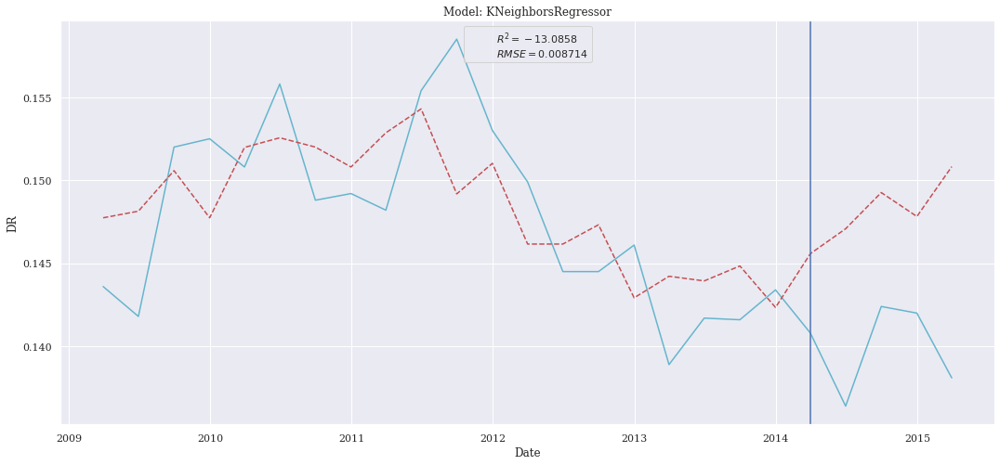

[14:46:27] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[14:46:27] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


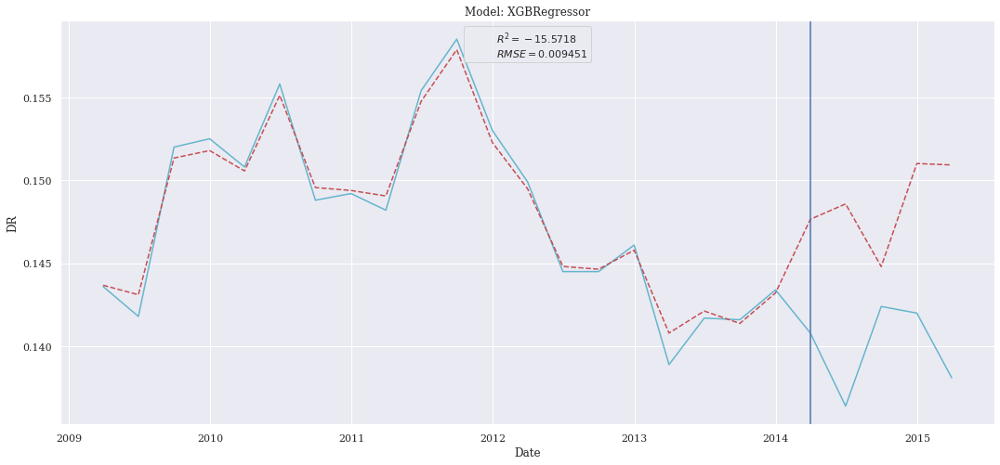

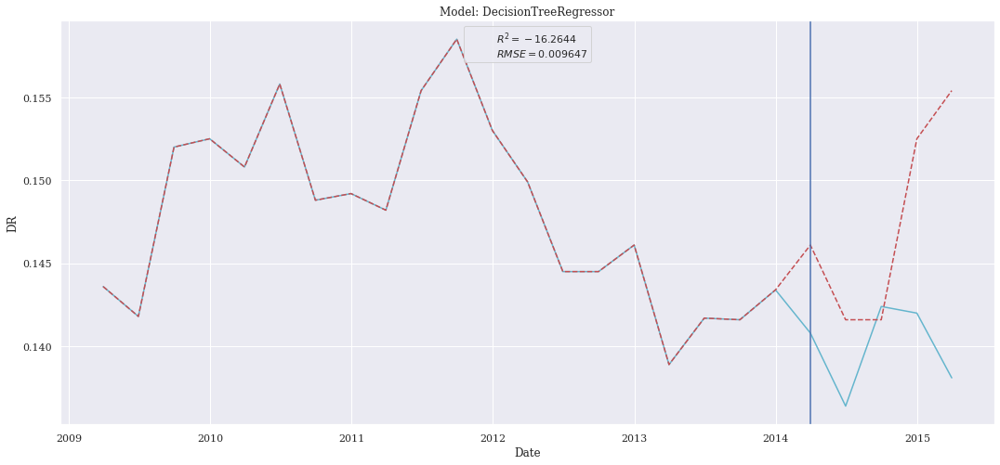

/usr/local/lib/python3.7/dist-packages/sklearn/svm/_base.py:1208: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  ConvergenceWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/svm/_base.py:1208: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  ConvergenceWarning,


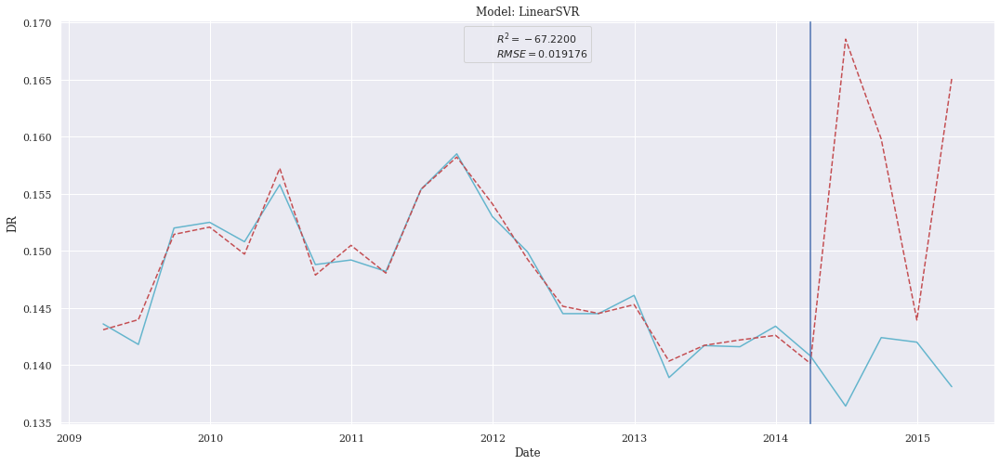

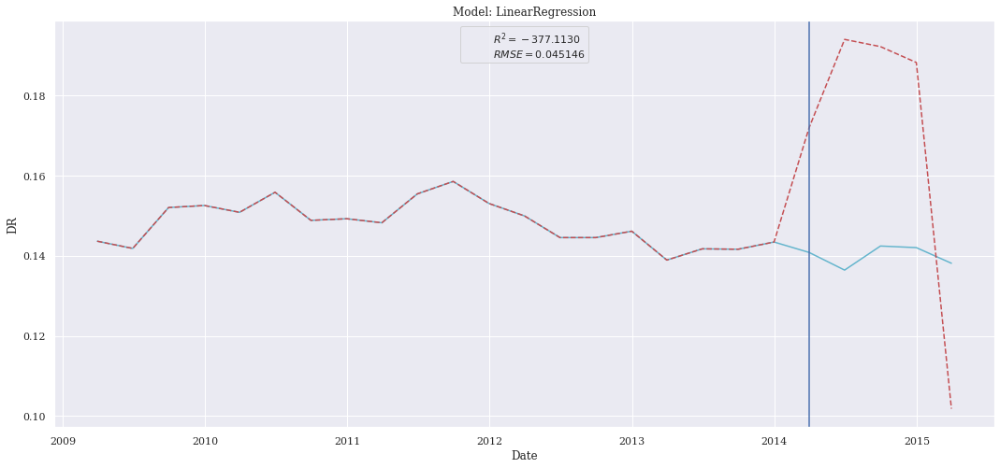

In [ ]:
for i in range(summary.shape[0]):
  y_train_pred = y_pred(X_train,y_train,X_train,y_train,model=summary.index[i])
  y_test_pred = y_pred(X_train,y_train,X_test,y_test,model=summary.index[i])
  plot_pred_detail(y_train,y_test,y_train_pred,y_test_pred,index[start:],name_model=summary.index[i],df_score=summary)

## First Conclusion
Ridge and DecisionTree give the best results for Kbest features and Sequential Forward Features, so we will use these two models for the GridSearch

### GridSearch on DecisionTree

In [ ]:
X_train, X_test, y_train, y_test = clean_data(data,start,b"CHR8",col_used=cl.col_8_seq_for,split=split,norm=norm)
params_tre = {"criterion":["squared_error","friedman_mse","absolute_error","poisson"],"splitter":["best"],"max_features":["auto","sqrt","log2"]}
params,score = params_grid(X_train,y_train,X_test,y_test,"tre",parameters=params_tre,metric='r2')
print(params,score)

NameError: ignored

In [ ]:
summary = summary_ml(X_train,y_train,X_test,y_test,models=["tre"],parameters={"p_tre":params})
summary

In [ ]:
y_train_pred = y_pred(X_train,y_train,X_train,y_train,model=summary.index[0],parameters={"p_tre":params})
y_test_pred = y_pred(X_train,y_train,X_test,y_test,model=summary.index[0],parameters={"p_tre":params})
plot_pred_detail(y_train,y_test,y_train_pred,y_test_pred,index[start:],name_model=summary.index[0],df_score=summary)

### GridSearch on Ridge

In [ ]:
X_train, X_test, y_train, y_test = clean_data(data,start,b"CHR8",col_used=cl.col_8_kbest,split=split,norm=norm)
params_rid = {"alpha":[1],"fit_intercept":[True,False],"solver":["auto","svd","cholesky","lsqr","sparse_cg","sag","saga"]}
params,score = params_grid(X_train,y_train,X_test,y_test,"rid",parameters=params_rid)
print(params,score)

In [ ]:
summary = summary_ml(X_train,y_train,X_test,y_test,models=["rid"],parameters={"p_rid":params})
summary

In [ ]:
y_train_pred = y_pred(X_train,y_train,X_train,y_train,model=summary.index[0],parameters={"p_tre":params})
y_test_pred = y_pred(X_train,y_train,X_test,y_test,model=summary.index[0],parameters={"p_tre":params})
plot_pred_detail(y_train,y_test,y_train_pred,y_test_pred,index[start:],name_model=summary.index[0],df_score=summary)

## Final Conclusion
Grid Search is relevant for the DecisionTree model but not for the Ridge. With the Grid we obtain a r2 equals to -1.007 against -1.95 before GridSearch. Concerning the rmse is now 0.003289 against 0.003982.

In [ ]:
X_train, X_test, y_train, y_test = clean_data(data,start,chronique,col_used=cl.col_8_seq_bac,split=split,norm=norm)
summary = summary_ml(X_train,y_train,X_test,y_test)
summary

[14:46:30] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/usr/local/lib/python3.7/dist-packages/sklearn/svm/_base.py:1208: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  ConvergenceWarning,


,rmse,mse,mae,r2
Index,,,,
CatBoostRegressor,0.007563,0.000057,0.007264,-9.610997
Ridge,0.007698,0.000059,0.006190,-9.994203
KNeighborsRegressor,0.008714,0.000076,0.008172,-13.085827
XGBRegressor,0.009451,0.000089,0.008653,-15.571811
DecisionTreeRegressor,0.009647,0.000093,0.007820,-16.264396
LinearSVR,0.020272,0.000411,0.015724,-75.236838
LinearRegression,0.045146,0.002038,0.044147,-377.113043


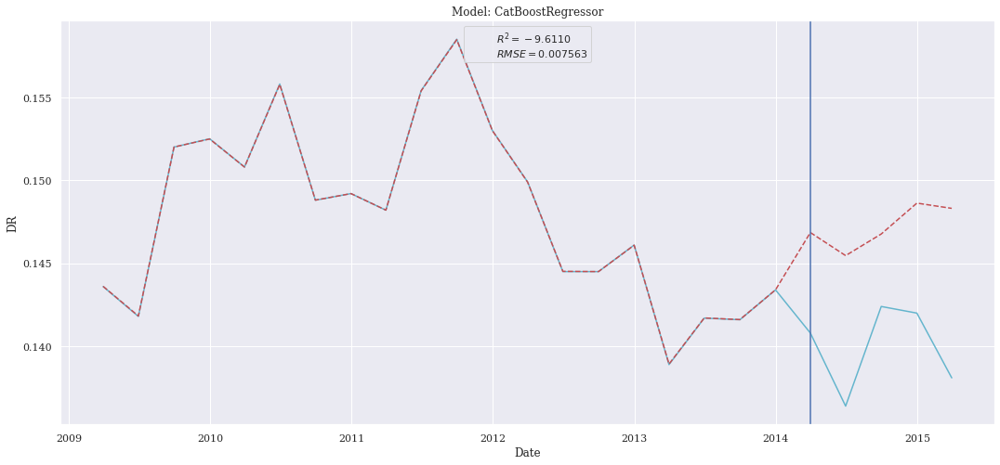

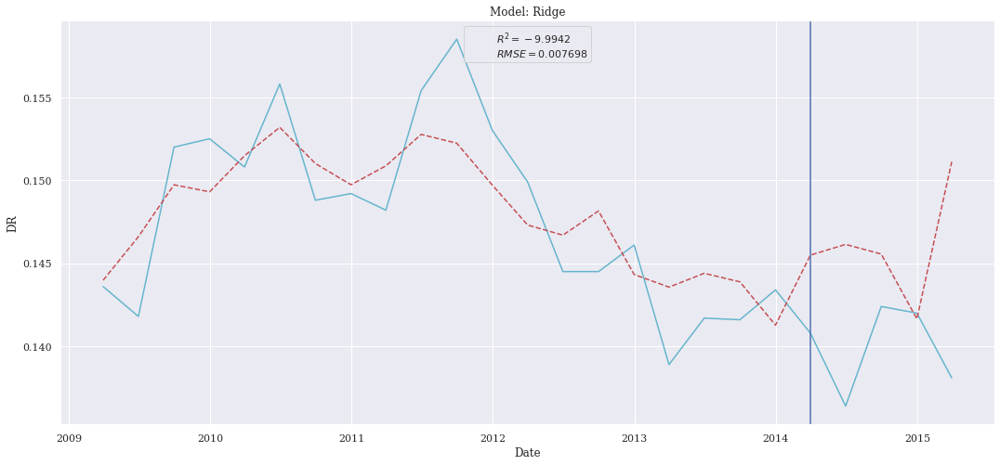

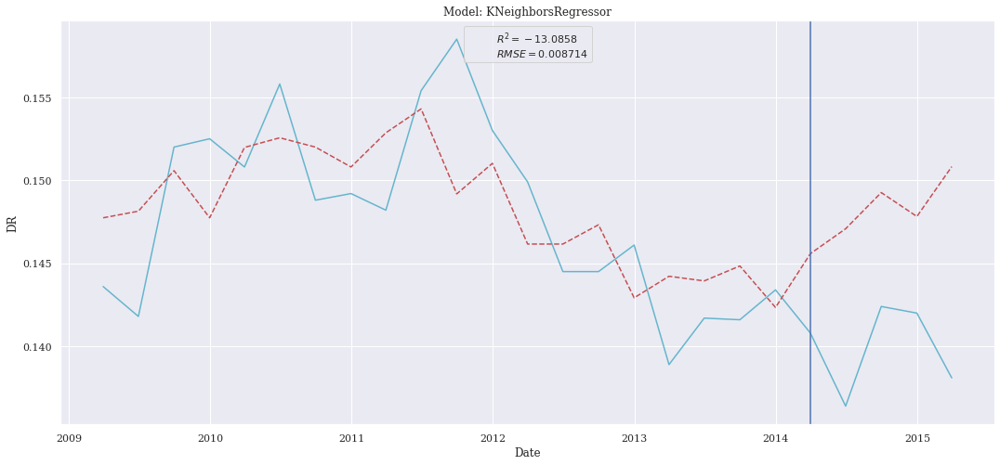

[14:46:33] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[14:46:33] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


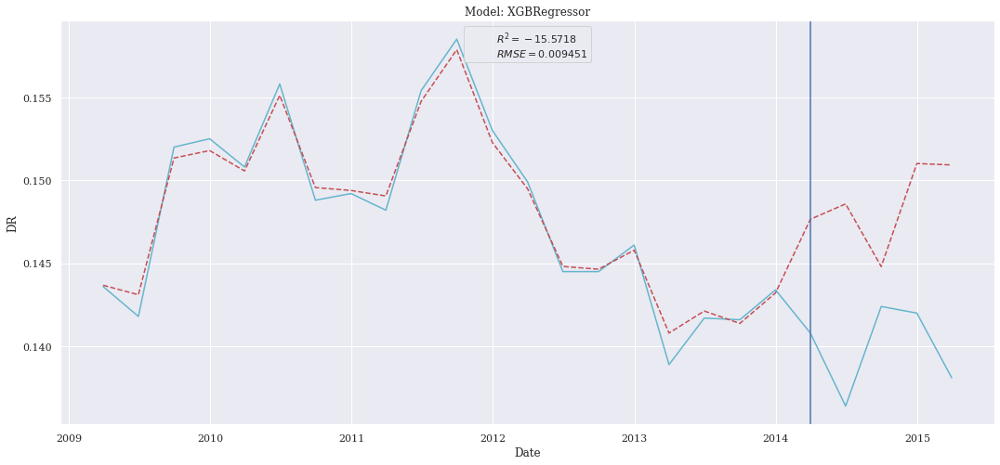

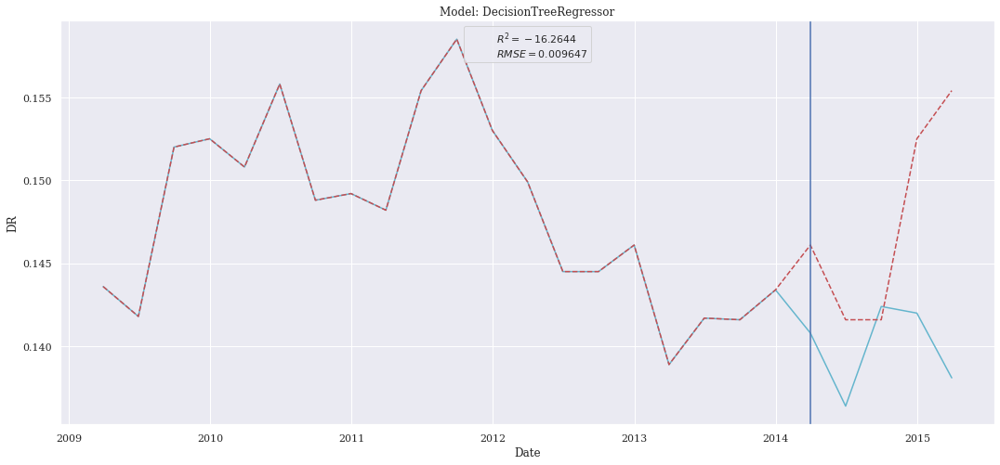

/usr/local/lib/python3.7/dist-packages/sklearn/svm/_base.py:1208: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  ConvergenceWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/svm/_base.py:1208: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  ConvergenceWarning,


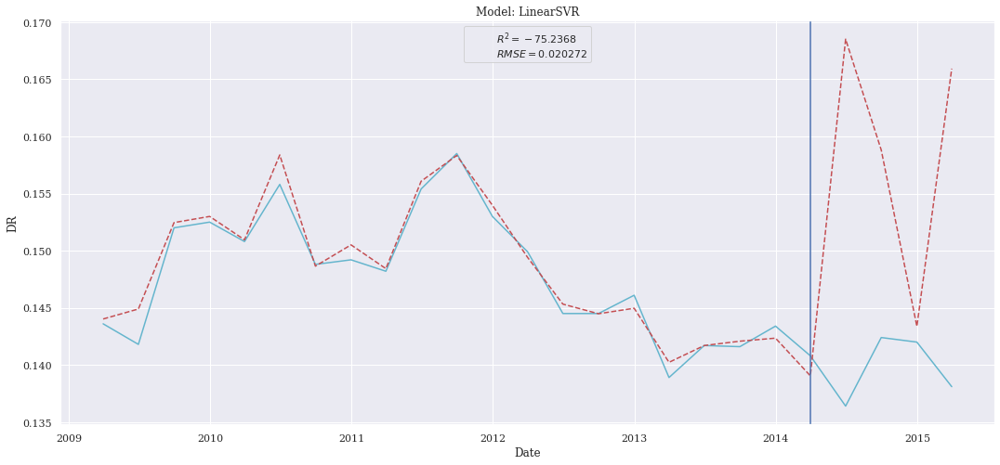

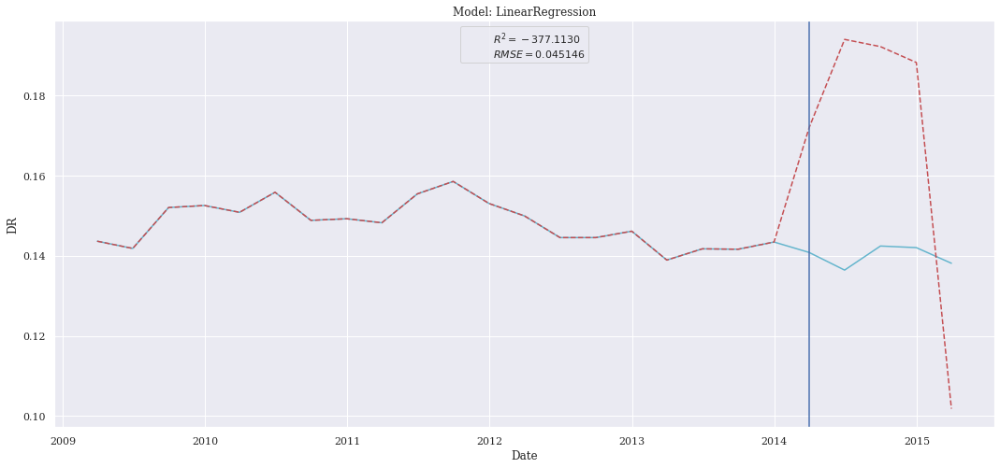

In [ ]:
for i in range(summary.shape[0]):
  y_train_pred = y_pred(X_train,y_train,X_train,y_train,model=summary.index[i])
  y_test_pred = y_pred(X_train,y_train,X_test,y_test,model=summary.index[i])
  plot_pred_detail(y_train,y_test,y_train_pred,y_test_pred,index[start:],name_model=summary.index[i],df_score=summary)

# Focus on Chronique Totale

## Machine Learning
We will focus on all the different features selection and after we choose the best model, with the best features we will focus on doing a grid search on this model

In [ ]:
chronique=b'Totale'
start = 1
norm = "MinMax"
split = 0.2

### Correlation Features

In [ ]:
X_train, X_test, y_train, y_test = clean_data(data,start,chronique=chronique,col_used=cl.col_totale_corr,split=split,norm=norm)
summary = summary_ml(X_train,y_train,X_test,y_test)
summary

[14:46:35] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/usr/local/lib/python3.7/dist-packages/sklearn/svm/_base.py:1208: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  ConvergenceWarning,


,rmse,mse,mae,r2
Index,,,,
XGBRegressor,0.002503,0.000006,0.002373,-35.945611
CatBoostRegressor,0.002631,0.000007,0.002602,-39.803479
KNeighborsRegressor,0.002683,0.000007,0.002620,-41.432547
LinearSVR,0.002719,0.000007,0.002370,-42.593208
Ridge,0.002722,0.000007,0.002699,-42.672427
LinearRegression,0.003066,0.000009,0.002996,-54.417889
DecisionTreeRegressor,0.003705,0.000014,0.003640,-79.943396


[14:46:35] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[14:46:35] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


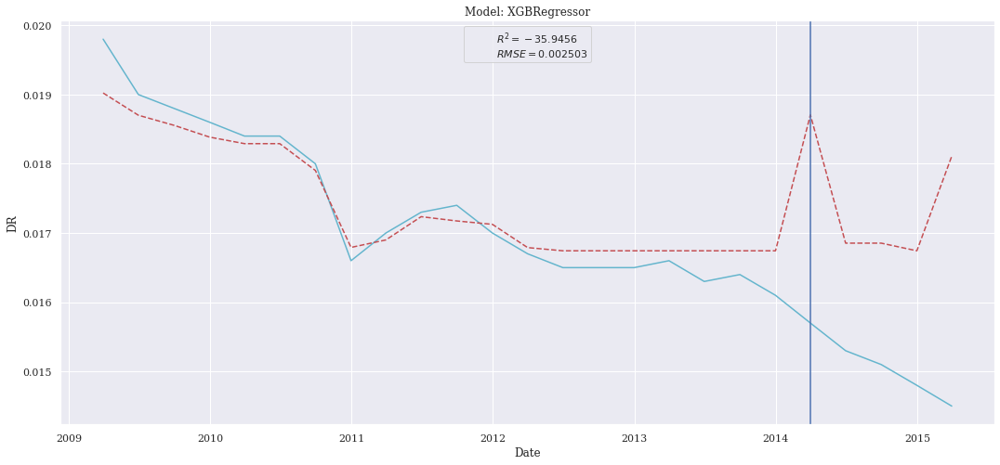

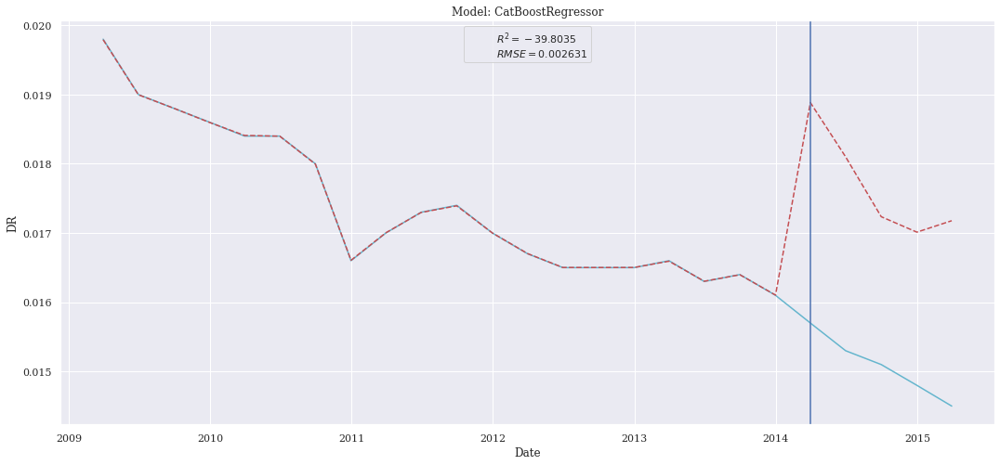

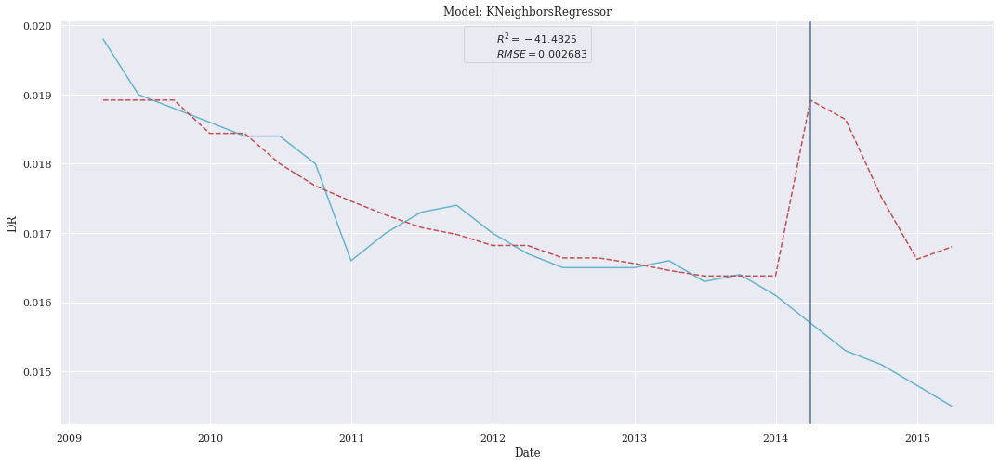

/usr/local/lib/python3.7/dist-packages/sklearn/svm/_base.py:1208: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  ConvergenceWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/svm/_base.py:1208: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  ConvergenceWarning,


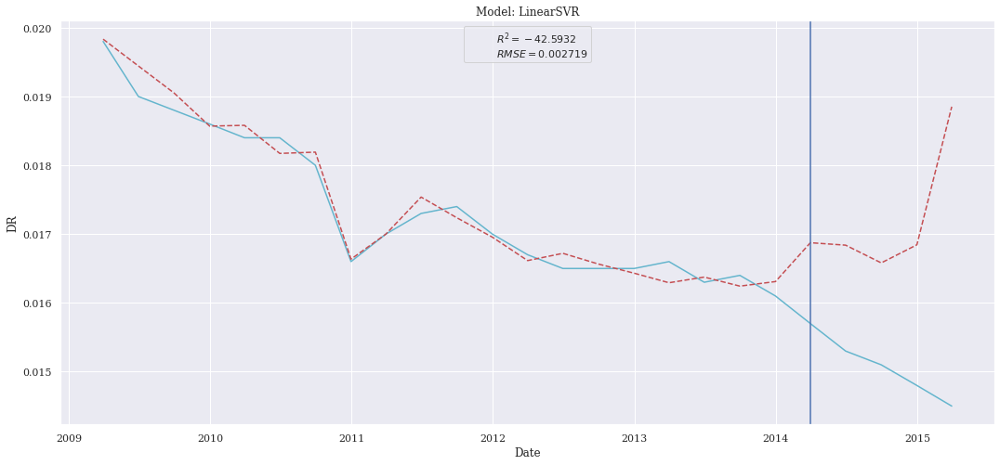

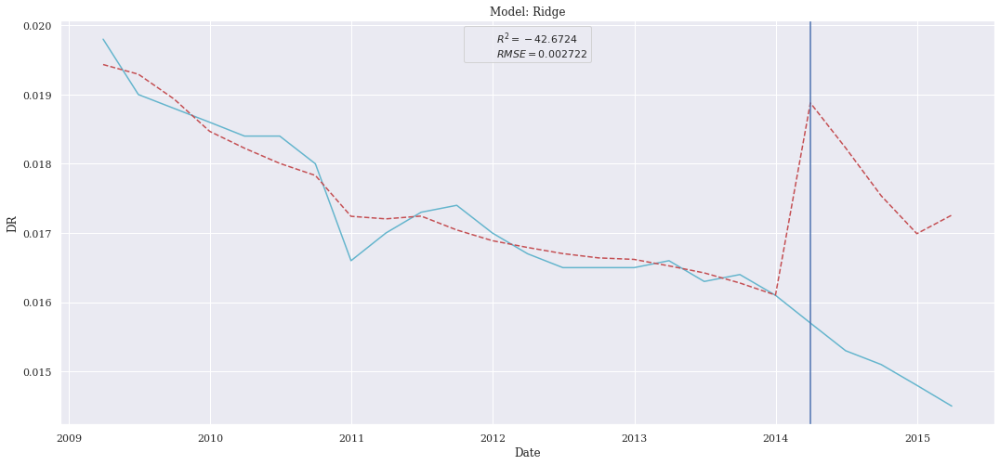

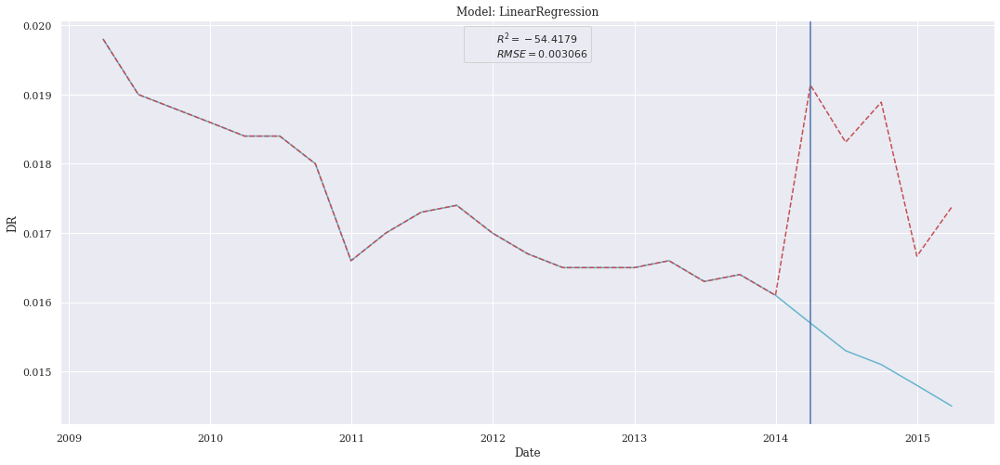

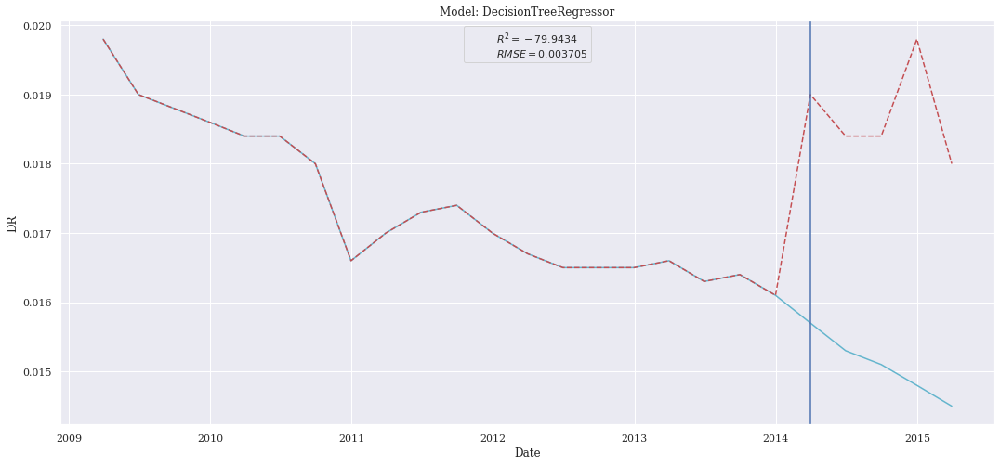

In [ ]:
for i in range(summary.shape[0]): 
  y_train_pred = y_pred(X_train,y_train,X_train,y_train,model=summary.index[i])
  y_test_pred = y_pred(X_train,y_train,X_test,y_test,model=summary.index[i])
  plot_pred_detail(y_train,y_test,y_train_pred,y_test_pred,index[start:],name_model=summary.index[i],df_score=summary)

### Low Variance Features

In [ ]:
X_train, X_test, y_train, y_test = clean_data(data,start,chronique,col_used=cl.col_totale_low_var,split=split,norm=norm)
summary = summary_ml(X_train,y_train,X_test,y_test)
summary

[14:46:40] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/usr/local/lib/python3.7/dist-packages/sklearn/svm/_base.py:1208: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  ConvergenceWarning,


,rmse,mse,mae,r2
Index,,,,
KNeighborsRegressor,0.002399,0.000006,0.002336,-32.929245
CatBoostRegressor,0.002451,0.000006,0.002434,-34.432484
XGBRegressor,0.002573,0.000007,0.002499,-38.026278
Ridge,0.002681,0.000007,0.002568,-41.369749
LinearRegression,0.002687,0.000007,0.002607,-41.561915
DecisionTreeRegressor,0.002860,0.000008,0.002660,-47.242925
LinearSVR,0.003563,0.000013,0.002987,-73.860755


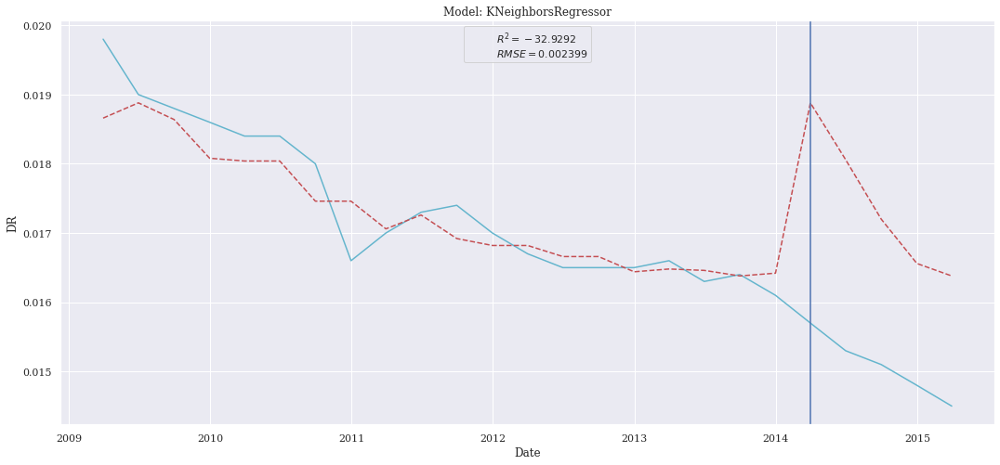

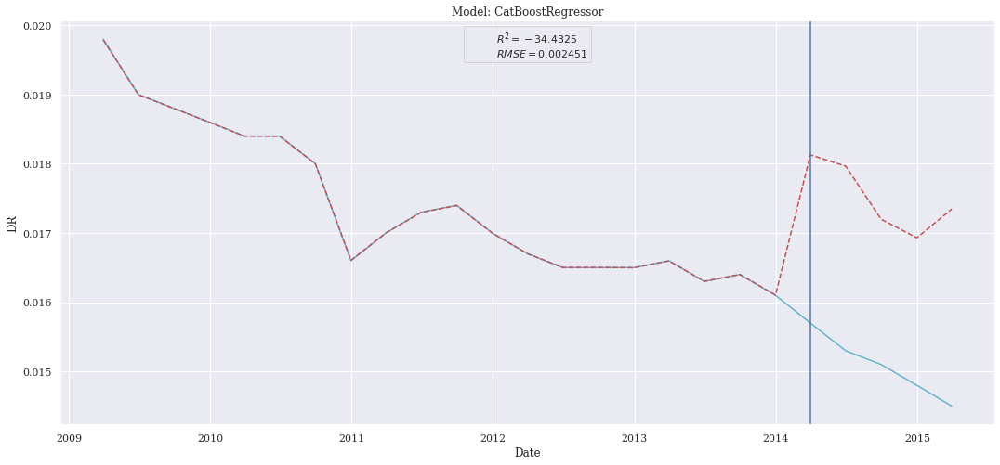

[14:46:43] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[14:46:43] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


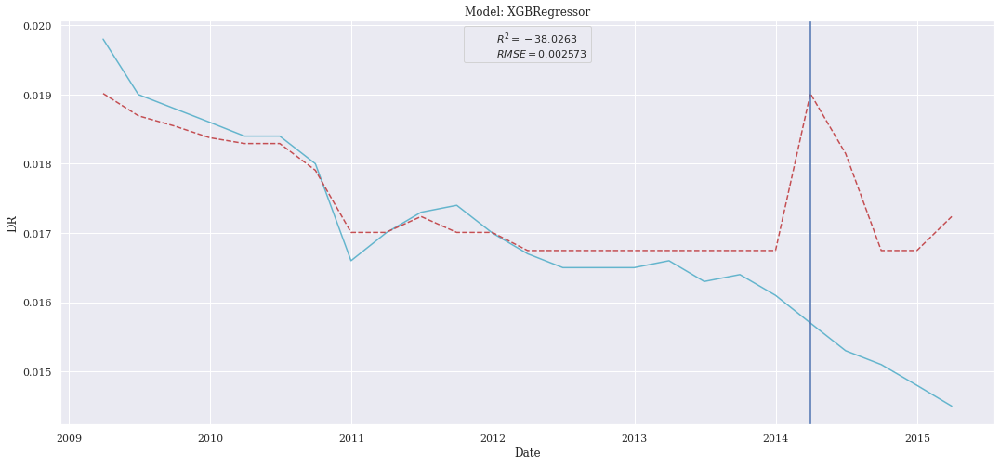

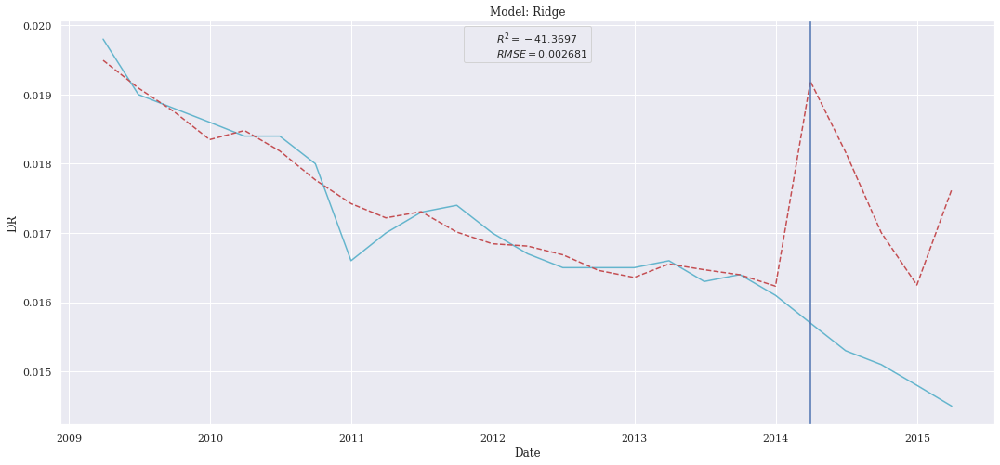

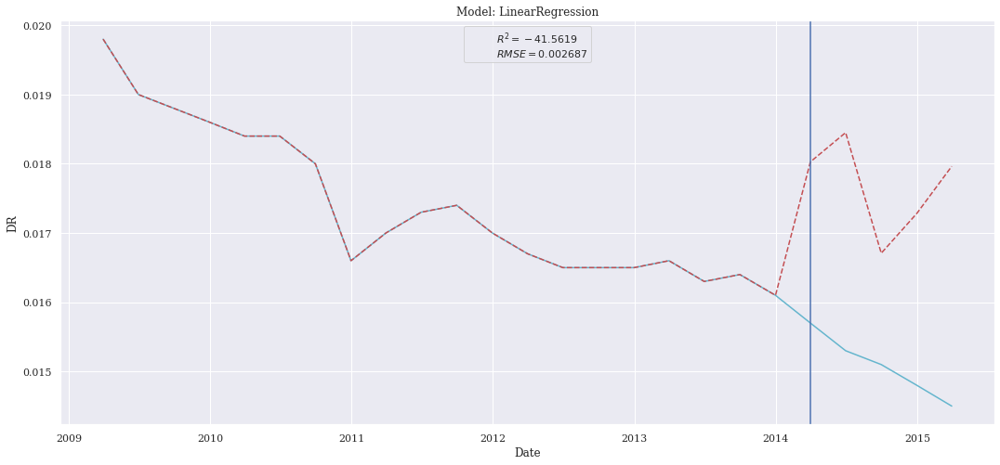

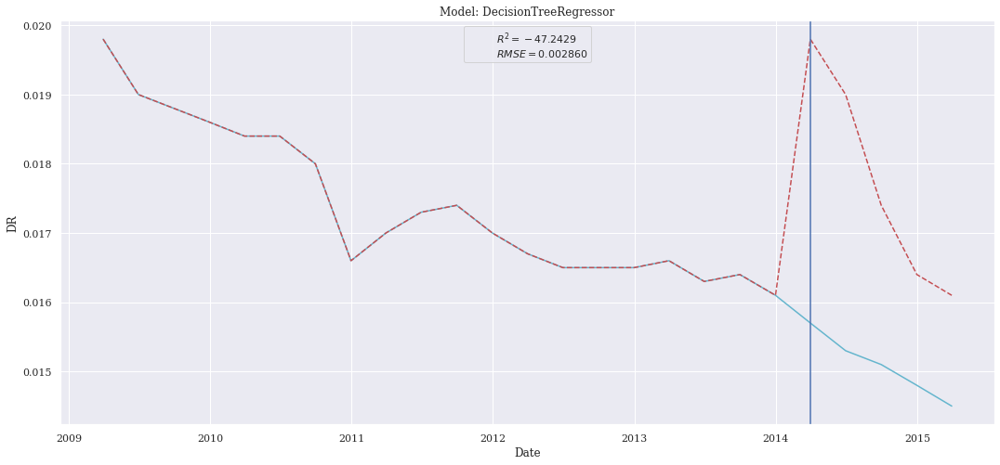

/usr/local/lib/python3.7/dist-packages/sklearn/svm/_base.py:1208: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  ConvergenceWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/svm/_base.py:1208: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  ConvergenceWarning,


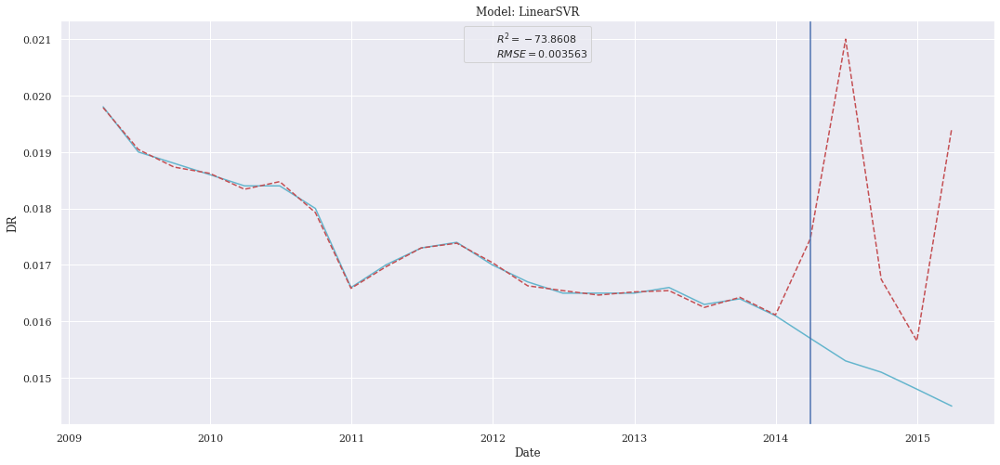

In [ ]:
for i in range(summary.shape[0]): 
  y_train_pred = y_pred(X_train,y_train,X_train,y_train,model=summary.index[i])
  y_test_pred = y_pred(X_train,y_train,X_test,y_test,model=summary.index[i])
  plot_pred_detail(y_train,y_test,y_train_pred,y_test_pred,index[start:],name_model=summary.index[i],df_score=summary)

### KBest Features

In [ ]:
X_train, X_test, y_train, y_test = clean_data(data,start,chronique,col_used=cl.col_totale_kbest,split=split,norm=norm)
summary = summary_ml(X_train,y_train,X_test,y_test)
summary

[14:46:45] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/usr/local/lib/python3.7/dist-packages/sklearn/svm/_base.py:1208: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  ConvergenceWarning,


,rmse,mse,mae,r2
Index,,,,
KNeighborsRegressor,0.002494,0.000006,0.002412,-35.688208
Ridge,0.002534,0.000006,0.002493,-36.853754
CatBoostRegressor,0.002589,0.000007,0.002549,-38.513171
DecisionTreeRegressor,0.002598,0.000007,0.002260,-38.799528
XGBRegressor,0.002736,0.000007,0.002699,-43.123570
LinearSVR,0.003336,0.000011,0.003163,-64.620406
LinearRegression,0.004564,0.000021,0.002804,-121.797795


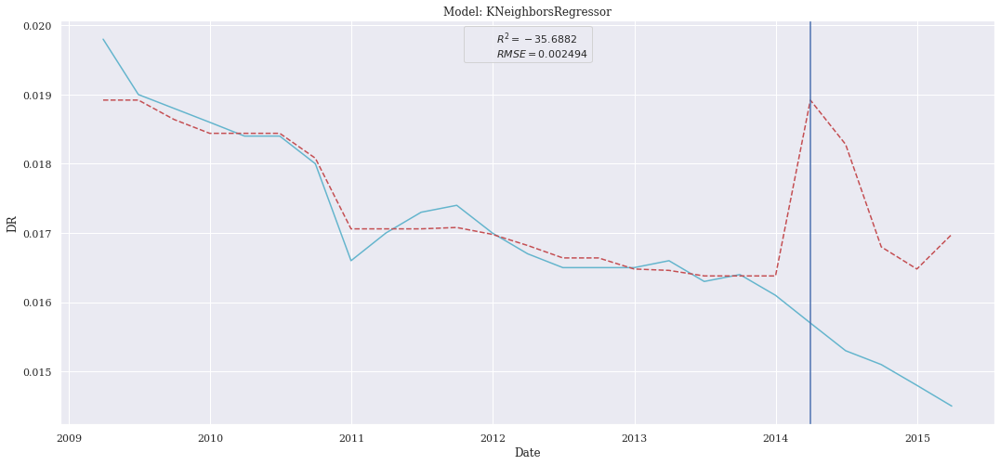

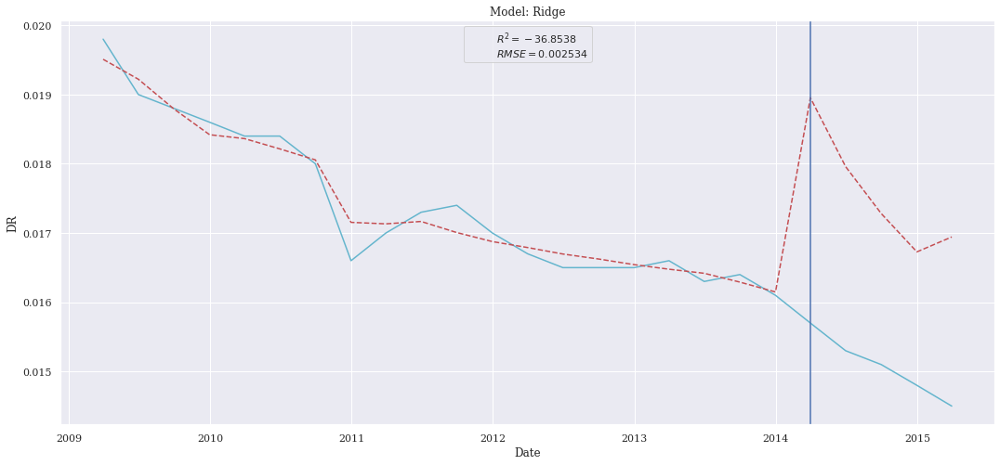

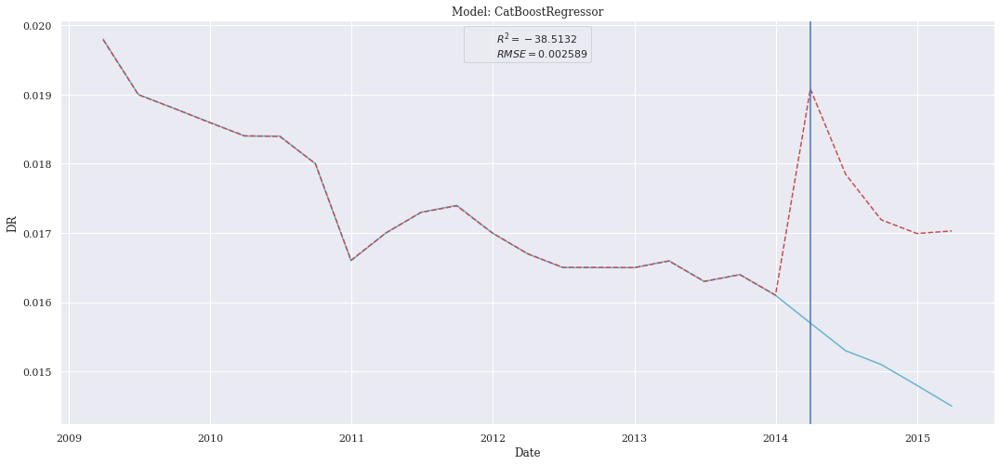

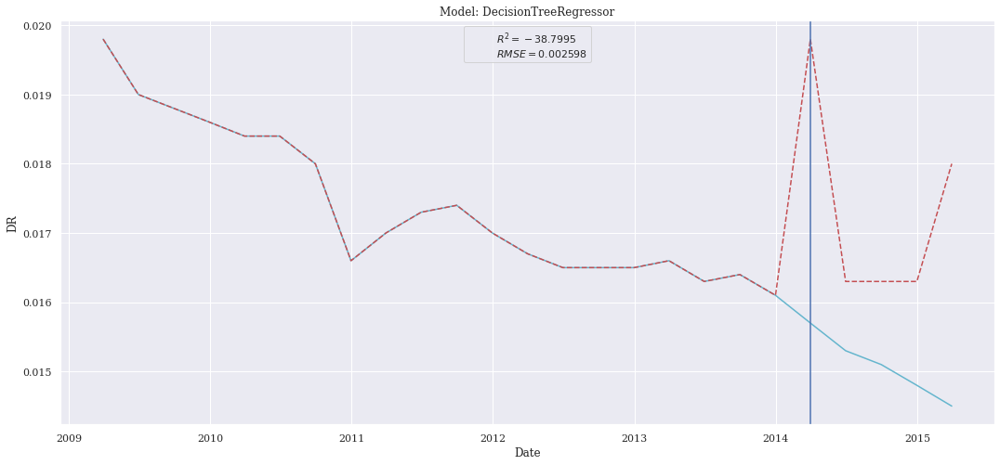

[14:46:49] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[14:46:49] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


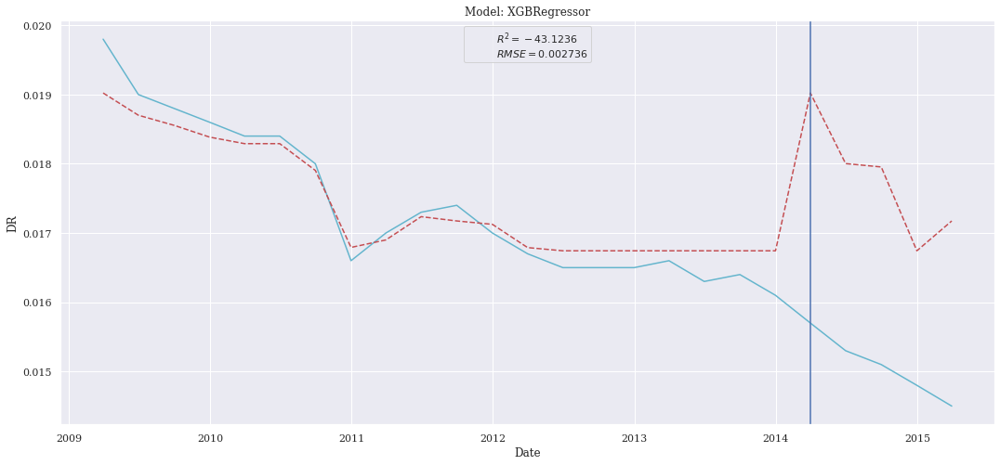

/usr/local/lib/python3.7/dist-packages/sklearn/svm/_base.py:1208: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  ConvergenceWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/svm/_base.py:1208: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  ConvergenceWarning,


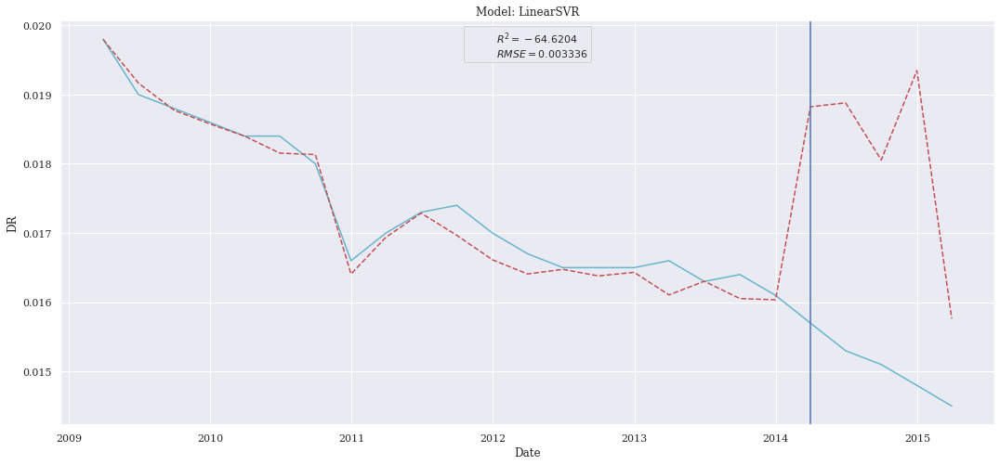

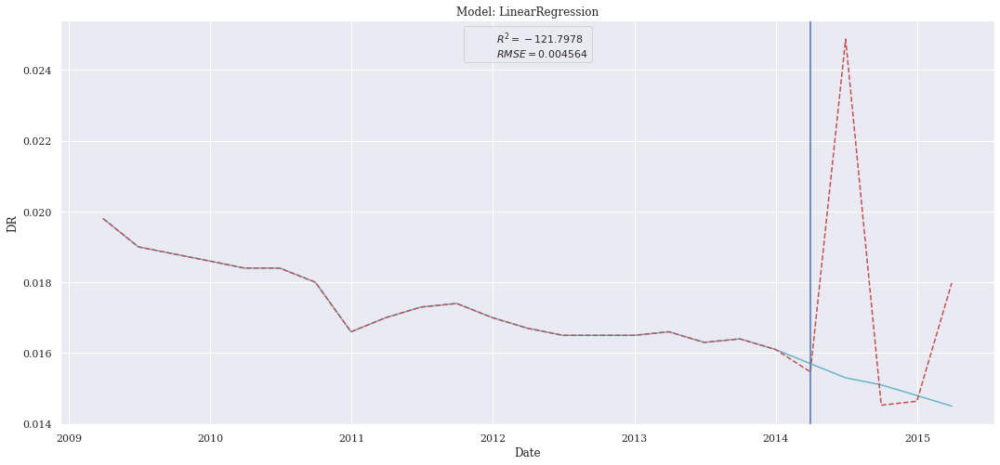

In [ ]:
for i in range(summary.shape[0]): 
  y_train_pred = y_pred(X_train,y_train,X_train,y_train,model=summary.index[i])
  y_test_pred = y_pred(X_train,y_train,X_test,y_test,model=summary.index[i])
  plot_pred_detail(y_train,y_test,y_train_pred,y_test_pred,index[start:],name_model=summary.index[i],df_score=summary)

### Recursive Features

In [ ]:
X_train, X_test, y_train, y_test = clean_data(data,start,chronique,col_used=cl.col_totale_recur,split=split,norm=norm)
summary = summary_ml(X_train,y_train,X_test,y_test)
summary

[14:46:50] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/usr/local/lib/python3.7/dist-packages/sklearn/svm/_base.py:1208: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  ConvergenceWarning,


,rmse,mse,mae,r2
Index,,,,
DecisionTreeRegressor,0.001667,0.000003,0.001580,-15.379717
XGBRegressor,0.002692,0.000007,0.002663,-41.740864
CatBoostRegressor,0.002702,0.000007,0.002696,-42.061608
Ridge,0.002719,0.000007,0.002713,-42.604206
KNeighborsRegressor,0.003221,0.000010,0.003212,-60.158019
LinearRegression,0.004710,0.000022,0.003822,-129.795601
LinearSVR,0.004991,0.000025,0.004644,-145.888433


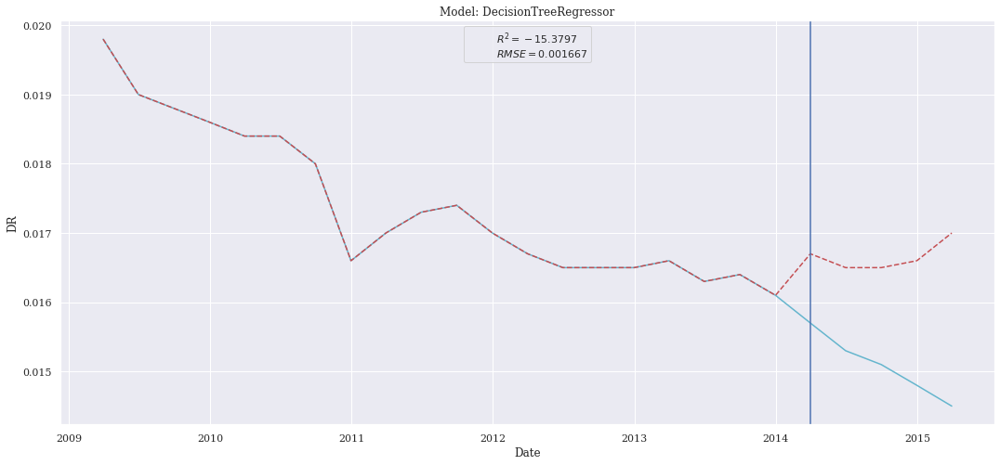

[14:46:52] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[14:46:52] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


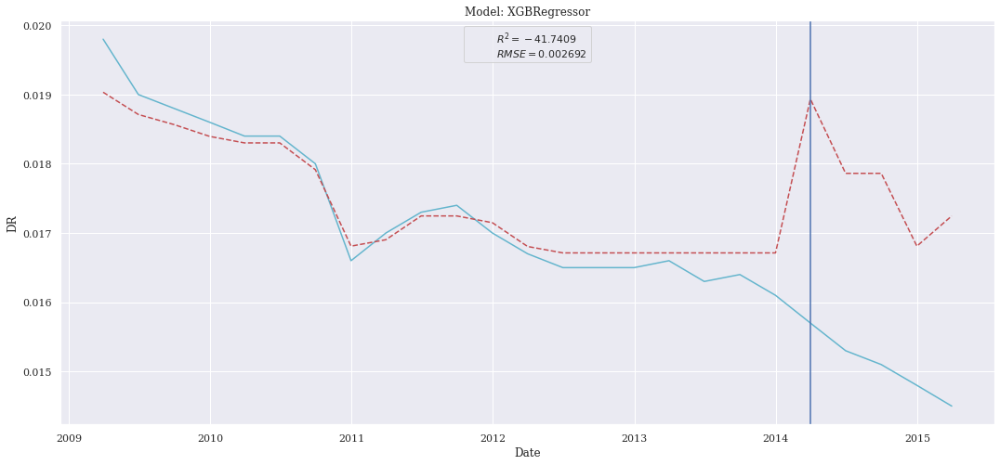

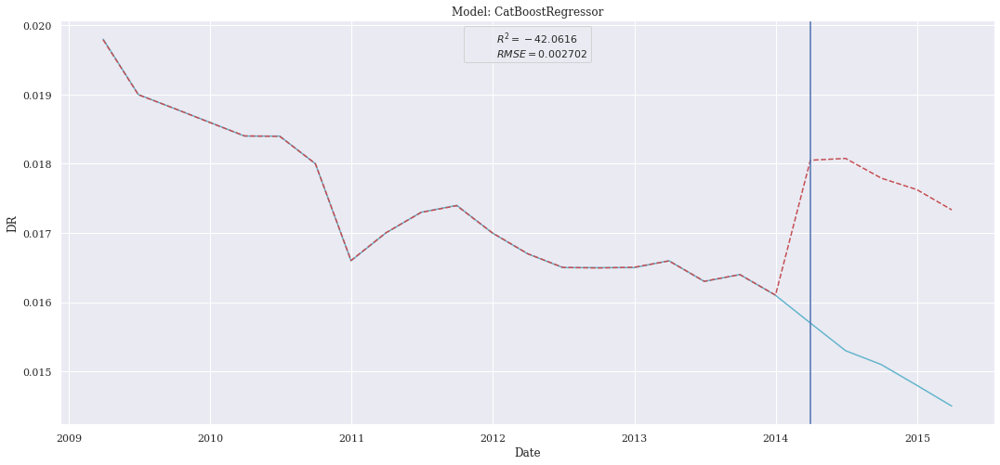

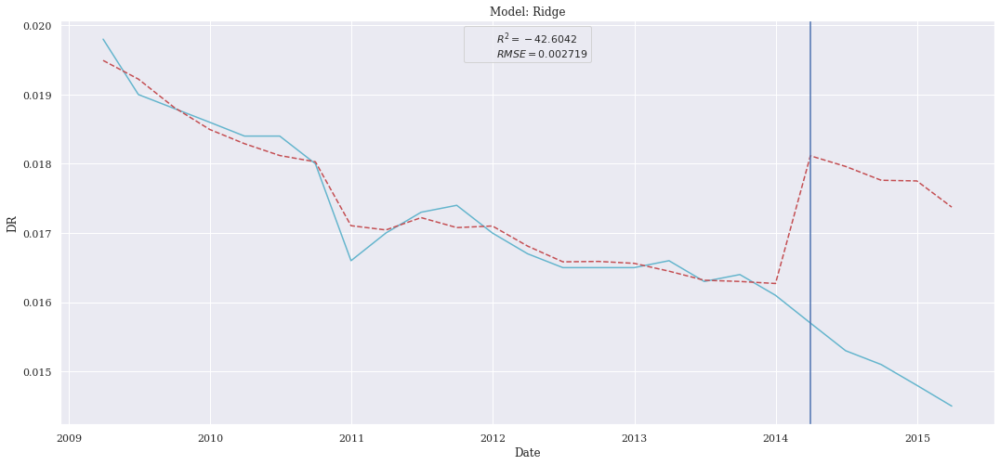

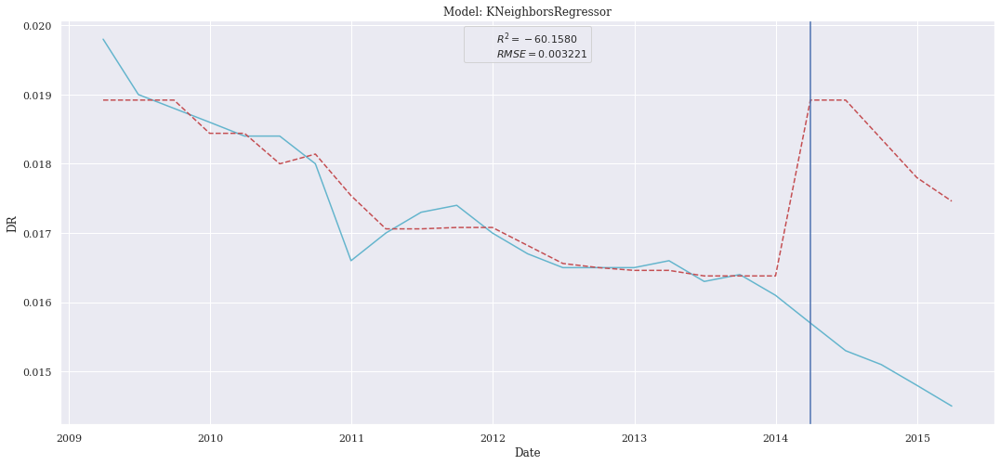

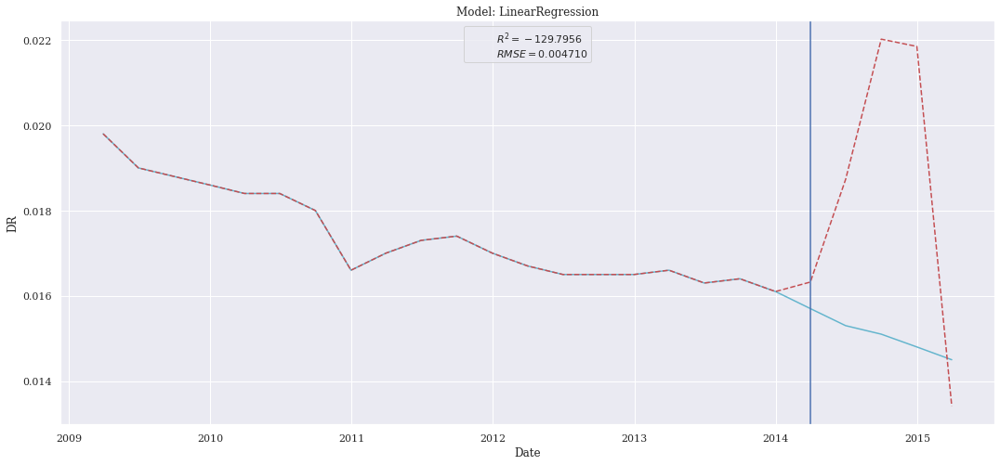

/usr/local/lib/python3.7/dist-packages/sklearn/svm/_base.py:1208: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  ConvergenceWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/svm/_base.py:1208: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  ConvergenceWarning,


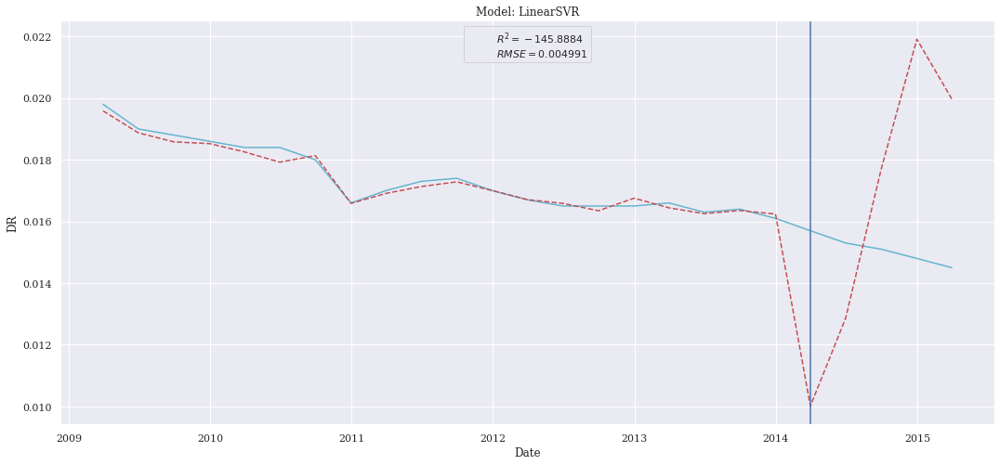

In [ ]:
for i in range(summary.shape[0]): 
  y_train_pred = y_pred(X_train,y_train,X_train,y_train,model=summary.index[i])
  y_test_pred = y_pred(X_train,y_train,X_test,y_test,model=summary.index[i])
  tl.plot_pred_detail(y_train,y_test,y_train_pred,y_test_pred,index[start:],name_model=summary.index[i],df_score=summary)

### SelectFromModel Features

In [ ]:
X_train, X_test, y_train, y_test = clean_data(data,start,chronique,col_used=cl.col_totale_sfm,split=split,norm=norm)
summary = summary_ml(X_train,y_train,X_test,y_test)
summary

[14:46:56] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/usr/local/lib/python3.7/dist-packages/sklearn/svm/_base.py:1208: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  ConvergenceWarning,


,rmse,mse,mae,r2
Index,,,,
LinearSVR,0.001774,0.000003,0.001555,-17.550539
KNeighborsRegressor,0.001999,0.000004,0.001988,-22.572170
Ridge,0.002136,0.000005,0.002075,-25.890414
CatBoostRegressor,0.002191,0.000005,0.002175,-27.302359
LinearRegression,0.002302,0.000005,0.001939,-30.248124
DecisionTreeRegressor,0.002628,0.000007,0.002500,-39.719340
XGBRegressor,0.002660,0.000007,0.002576,-40.703862


/usr/local/lib/python3.7/dist-packages/sklearn/svm/_base.py:1208: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  ConvergenceWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/svm/_base.py:1208: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  ConvergenceWarning,


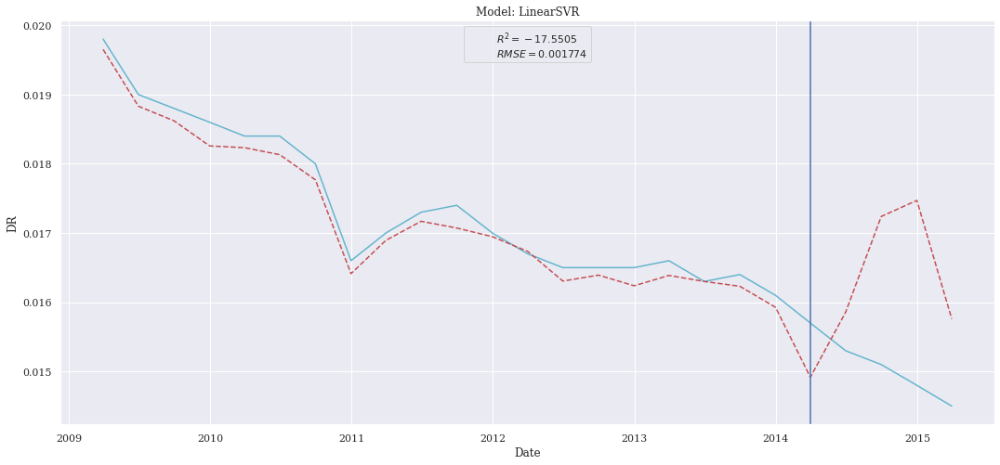

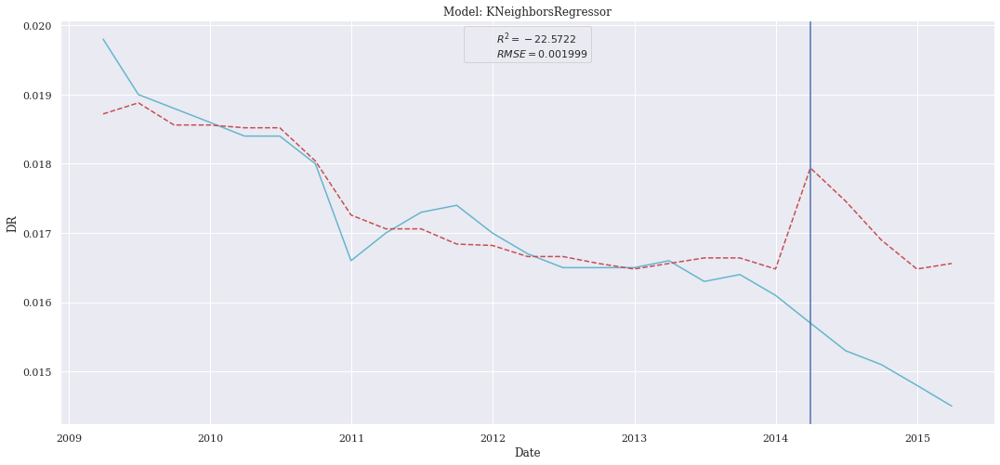

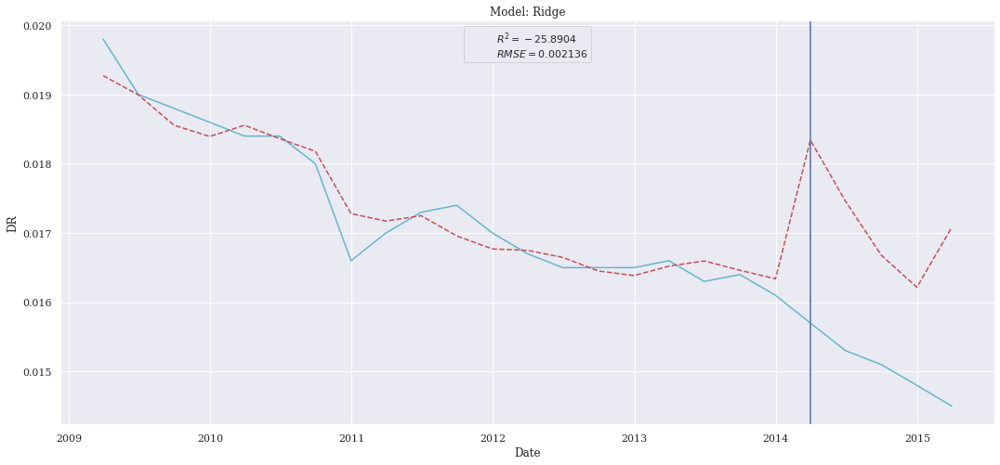

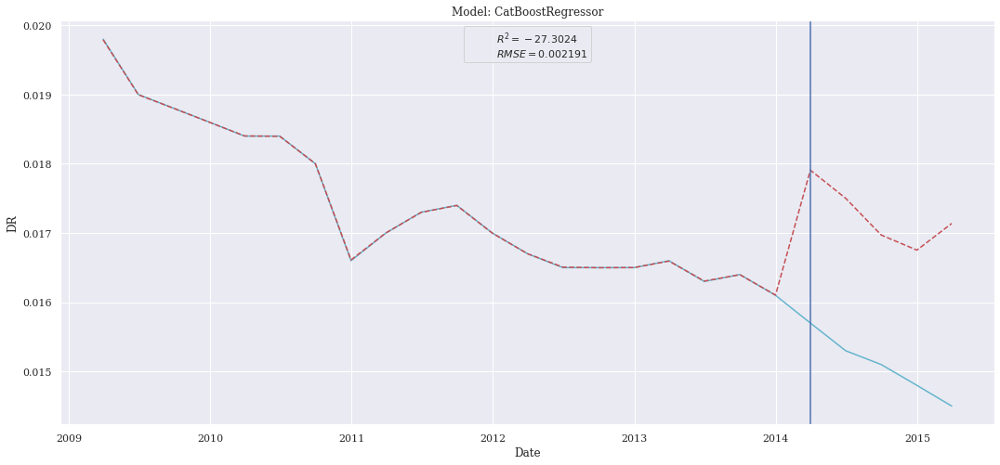

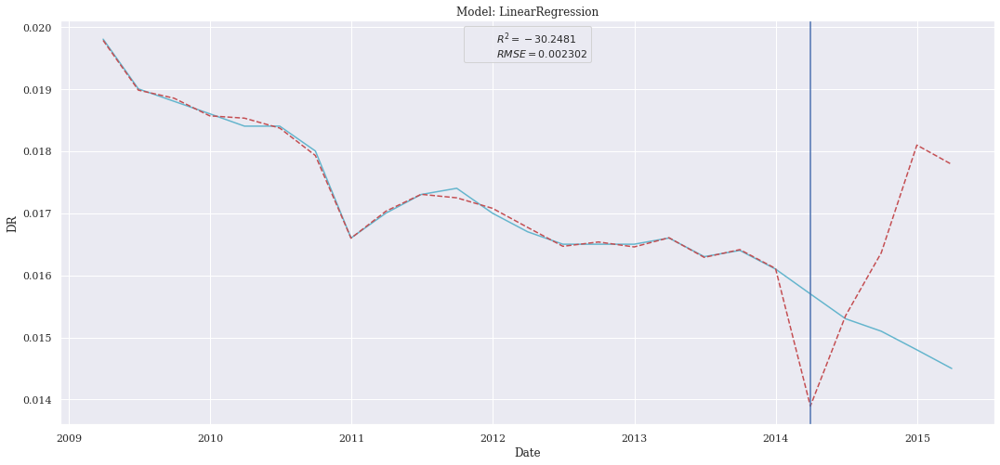

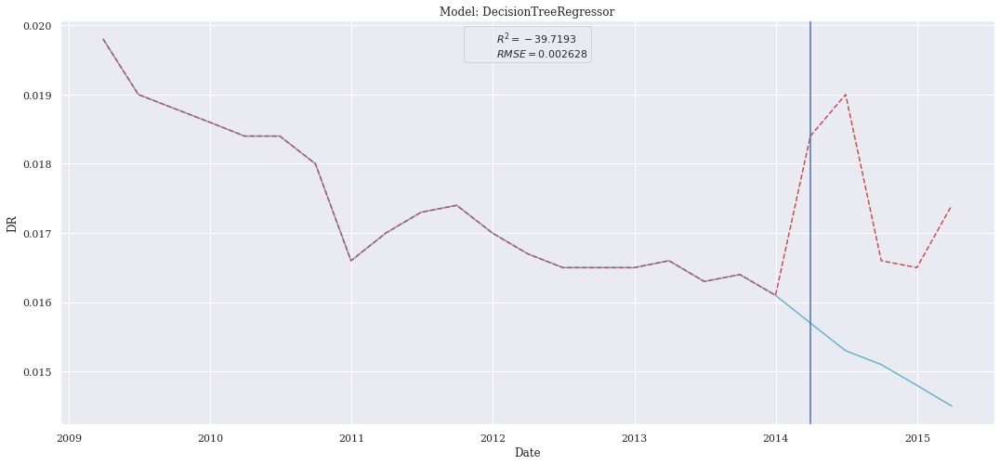

[14:47:00] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[14:47:00] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


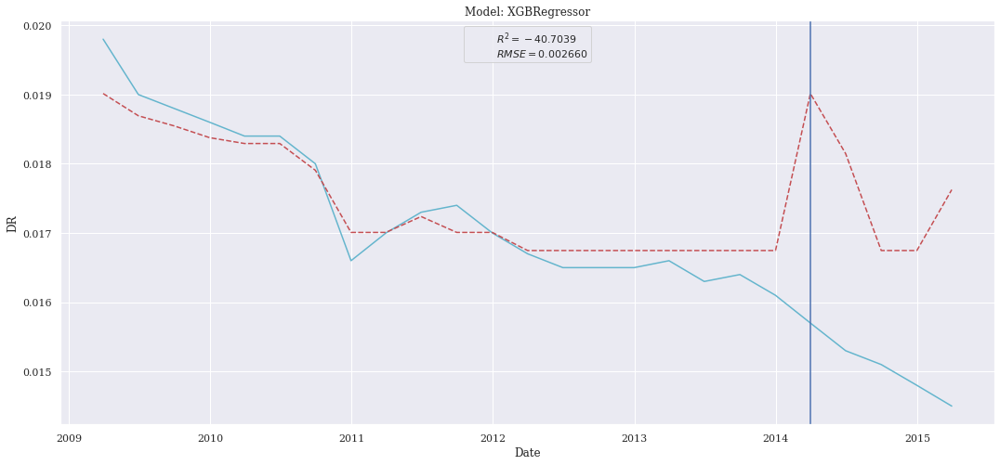

In [ ]:
for i in range(summary.shape[0]): 
  y_train_pred = y_pred(X_train,y_train,X_train,y_train,model=summary.index[i])
  y_test_pred = y_pred(X_train,y_train,X_test,y_test,model=summary.index[i])
  plot_pred_detail(y_train,y_test,y_train_pred,y_test_pred,index[start:],name_model=summary.index[i],df_score=summary)

### Tree-Based Features

In [ ]:
X_train, X_test, y_train, y_test = clean_data(data,start,chronique,col_used=cl.col_totale_tree,split=split,norm=norm)
summary = summary_ml(X_train,y_train,X_test,y_test)
summary

[14:47:01] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/usr/local/lib/python3.7/dist-packages/sklearn/svm/_base.py:1208: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  ConvergenceWarning,


,rmse,mse,mae,r2
Index,,,,
KNeighborsRegressor,0.002479,0.000006,0.002428,-35.227830
CatBoostRegressor,0.002480,0.000006,0.002479,-35.275304
Ridge,0.002503,0.000006,0.002490,-35.926890
XGBRegressor,0.002710,0.000007,0.002674,-42.305116
DecisionTreeRegressor,0.003090,0.000010,0.002900,-55.308962
LinearRegression,0.003758,0.000014,0.003704,-82.276351
LinearSVR,0.003901,0.000015,0.003391,-88.719347


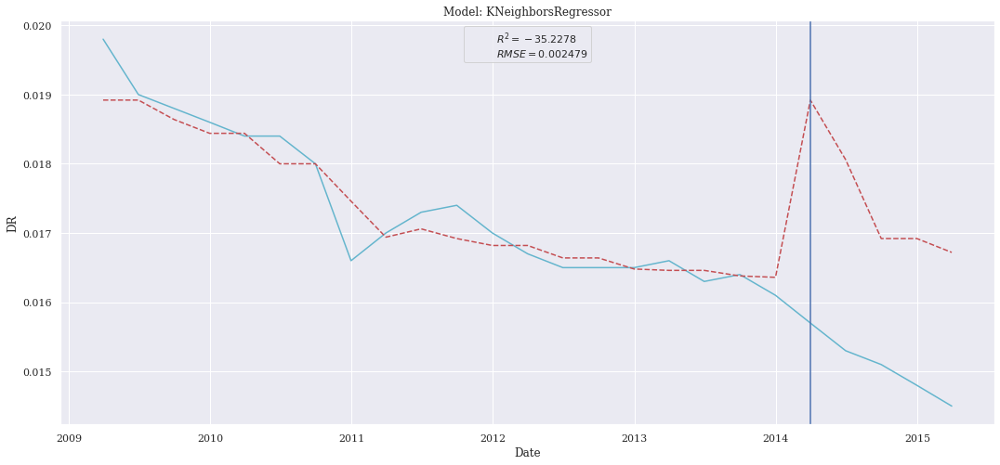

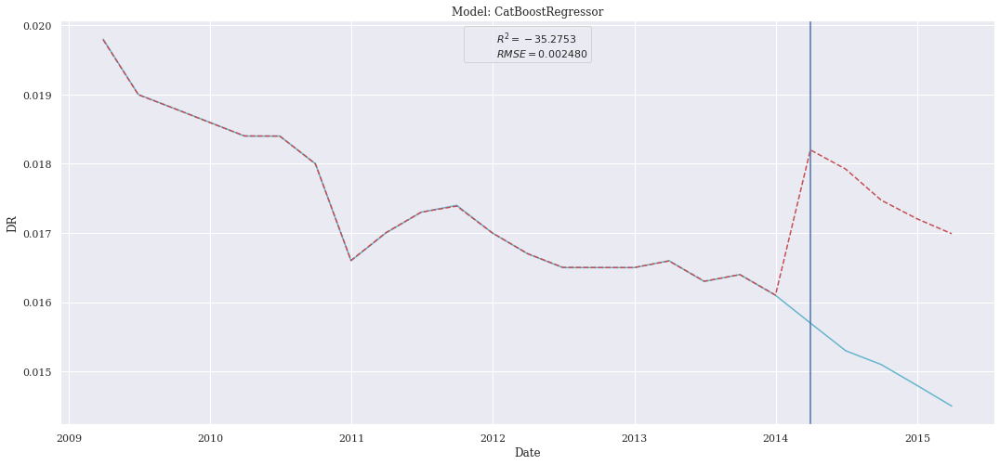

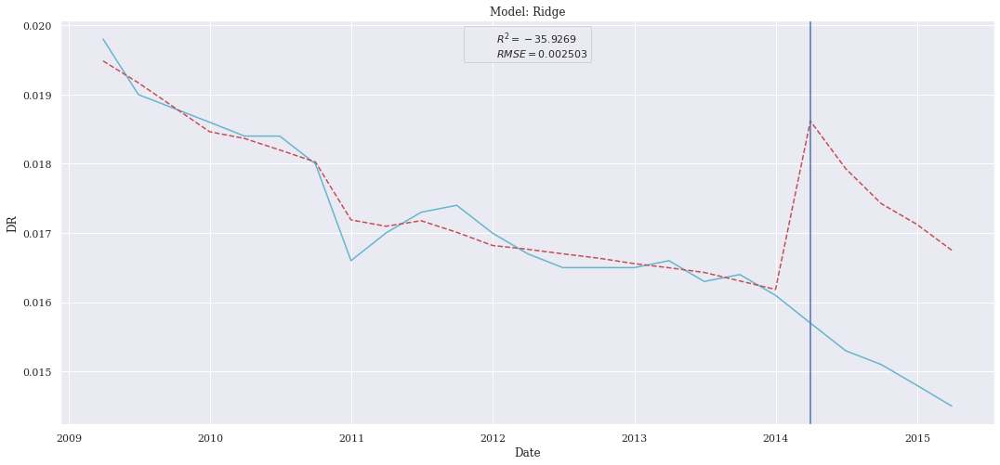

[14:47:04] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[14:47:04] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


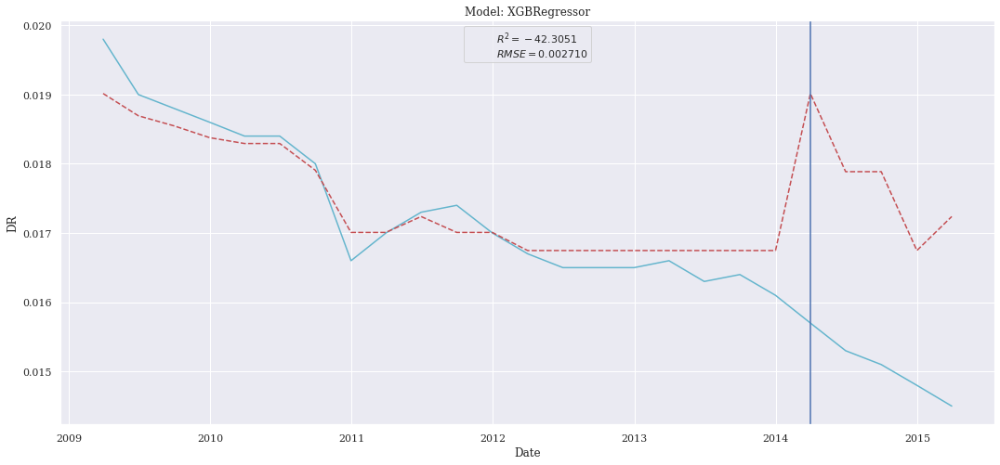

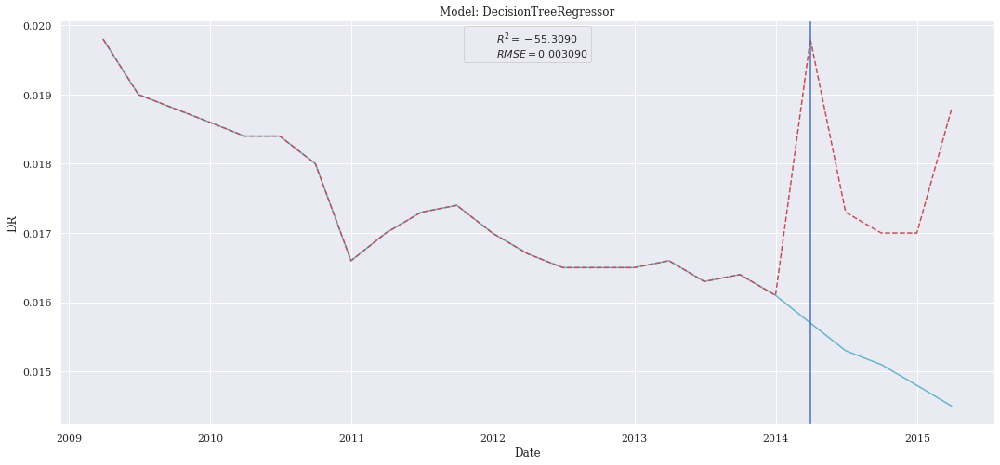

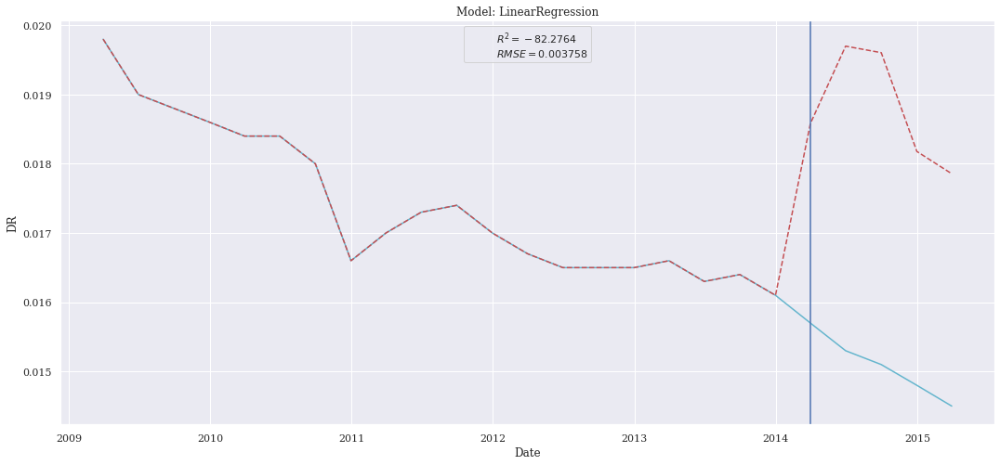

/usr/local/lib/python3.7/dist-packages/sklearn/svm/_base.py:1208: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  ConvergenceWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/svm/_base.py:1208: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  ConvergenceWarning,


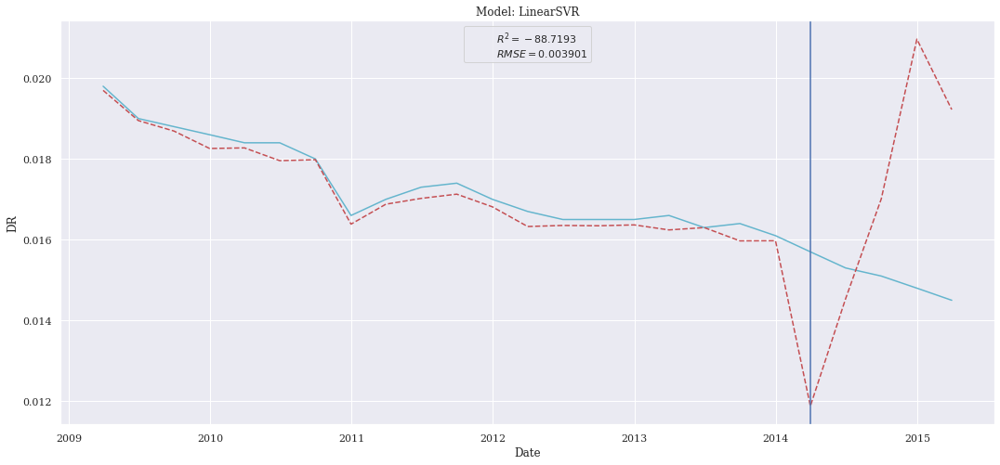

In [ ]:
for i in range(summary.shape[0]): 
  y_train_pred = y_pred(X_train,y_train,X_train,y_train,model=summary.index[i])
  y_test_pred = y_pred(X_train,y_train,X_test,y_test,model=summary.index[i])
  plot_pred_detail(y_train,y_test,y_train_pred,y_test_pred,index[start:],name_model=summary.index[i],df_score=summary)

### Sequential Forward Features

In [ ]:
X_train, X_test, y_train, y_test = clean_data(data,start,chronique,col_used=cl.col_totale_seq_for,split=split,norm=norm)
summary = summary_ml(X_train,y_train,X_test,y_test)
summary

[14:47:06] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/usr/local/lib/python3.7/dist-packages/sklearn/svm/_base.py:1208: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  ConvergenceWarning,


,rmse,mse,mae,r2
Index,,,,
LinearSVR,0.001922,0.000004,0.001611,-20.790246
KNeighborsRegressor,0.002354,0.000006,0.002332,-31.674057
CatBoostRegressor,0.002598,0.000007,0.002582,-38.785177
XGBRegressor,0.002629,0.000007,0.002568,-39.756236
Ridge,0.002818,0.000008,0.002792,-45.833657
DecisionTreeRegressor,0.002896,0.000008,0.002720,-48.433962
LinearRegression,0.003561,0.000013,0.003494,-73.754251


/usr/local/lib/python3.7/dist-packages/sklearn/svm/_base.py:1208: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  ConvergenceWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/svm/_base.py:1208: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  ConvergenceWarning,


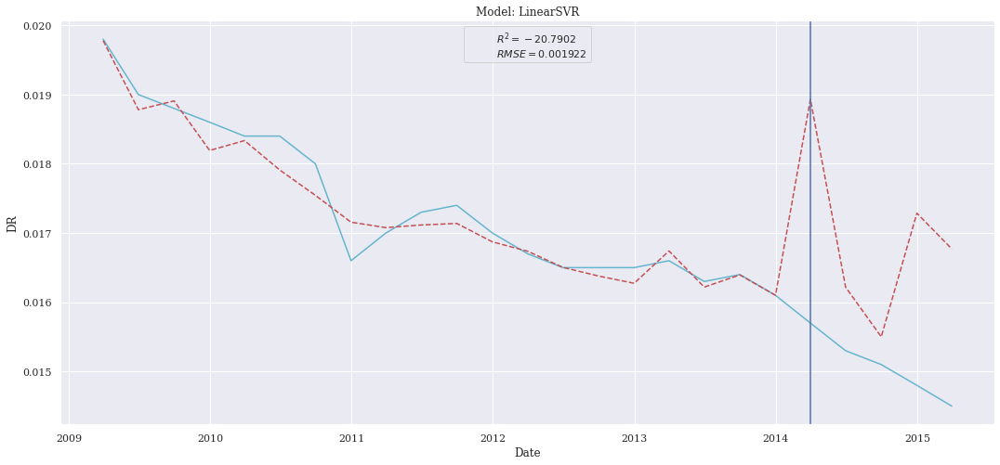

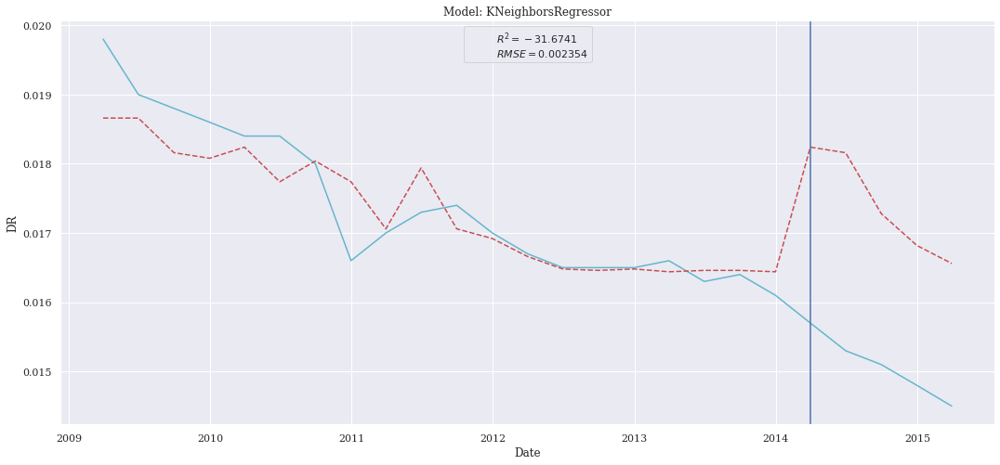

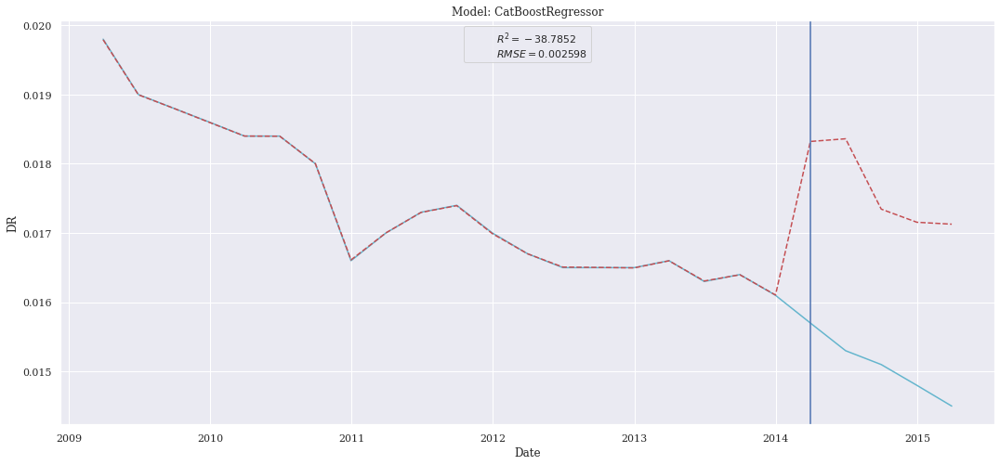

[14:47:08] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[14:47:08] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


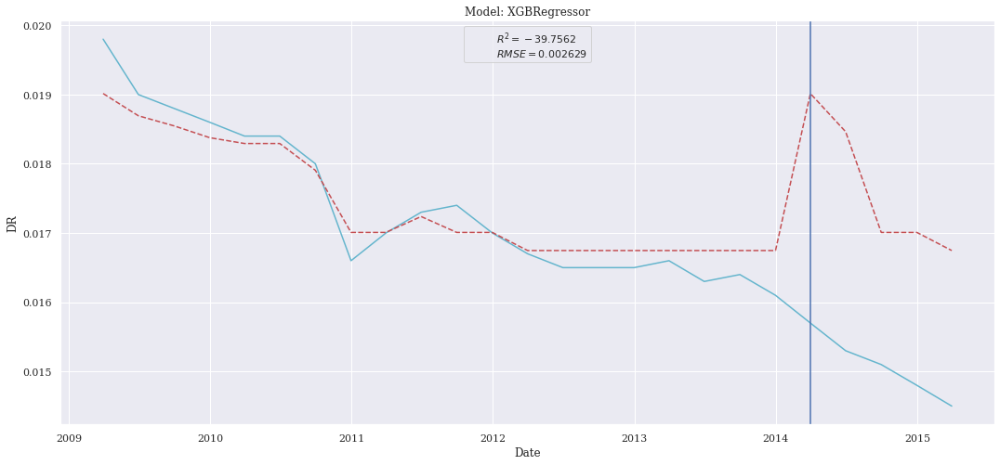

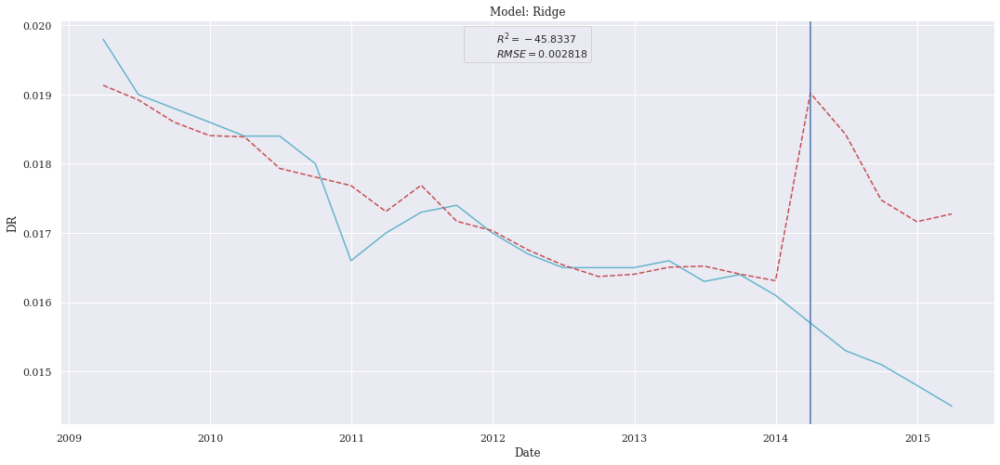

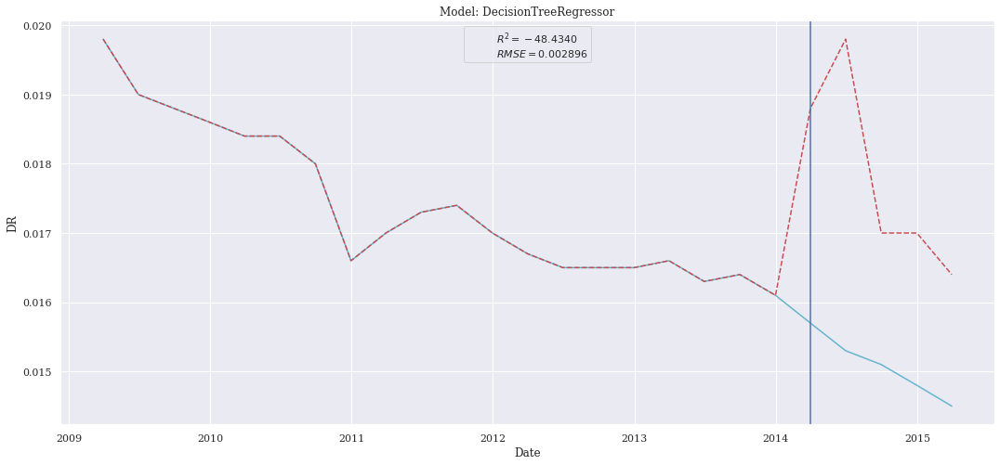

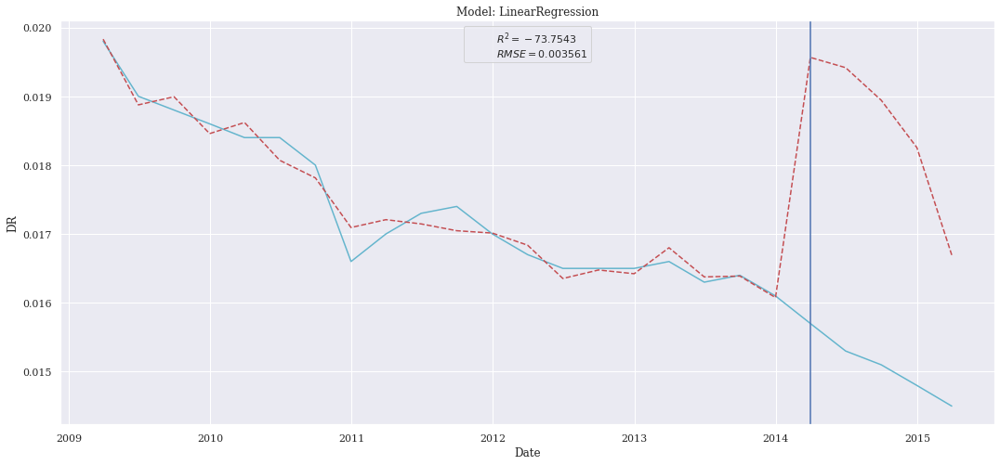

In [ ]:
for i in range(summary.shape[0]):
  y_train_pred = y_pred(X_train,y_train,X_train,y_train,model=summary.index[i])
  y_test_pred = y_pred(X_train,y_train,X_test,y_test,model=summary.index[i])
  plot_pred_detail(y_train,y_test,y_train_pred,y_test_pred,index[start:],name_model=summary.index[i],df_score=summary)

### Sequential Backward Features

In [ ]:
X_train, X_test, y_train, y_test = clean_data(data,start,chronique,col_used=cl.col_totale_seq_bac,split=split,norm=norm)
summary = summary_ml(X_train,y_train,X_test,y_test)
summary

[14:47:10] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/usr/local/lib/python3.7/dist-packages/sklearn/svm/_base.py:1208: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  ConvergenceWarning,


,rmse,mse,mae,r2
Index,,,,
LinearRegression,0.002280,0.000005,0.001650,-29.651166
KNeighborsRegressor,0.002366,0.000006,0.002316,-31.996698
CatBoostRegressor,0.002390,0.000006,0.002369,-32.690870
XGBRegressor,0.002611,0.000007,0.002533,-39.205808
Ridge,0.002654,0.000007,0.002555,-40.533190
DecisionTreeRegressor,0.003023,0.000009,0.002840,-52.867925
LinearSVR,0.003503,0.000012,0.002466,-71.333519


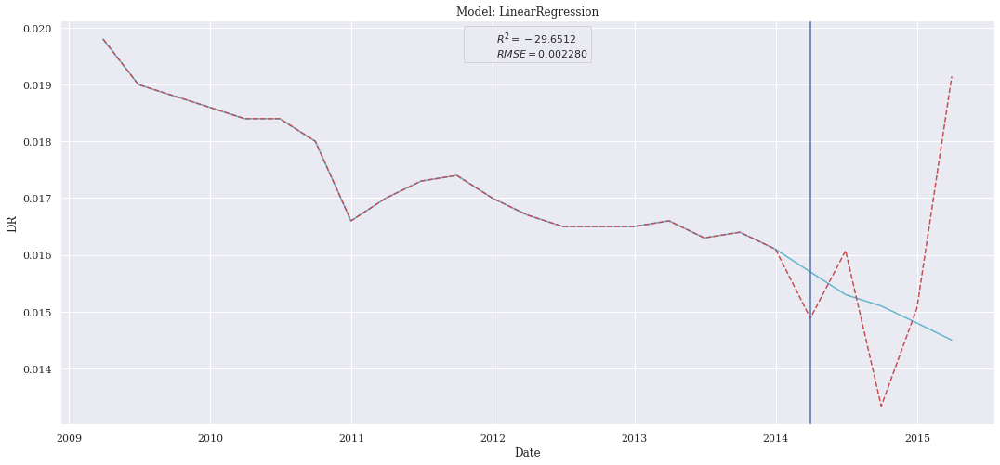

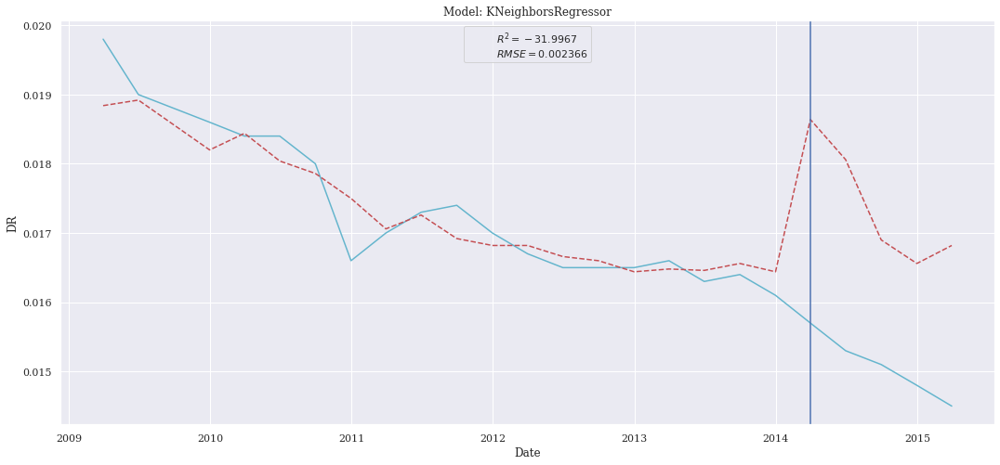

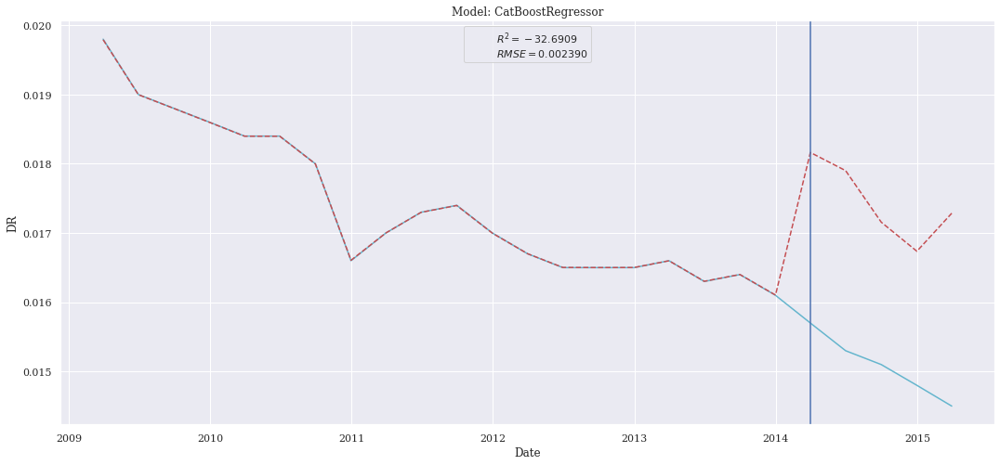

[14:47:14] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[14:47:14] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


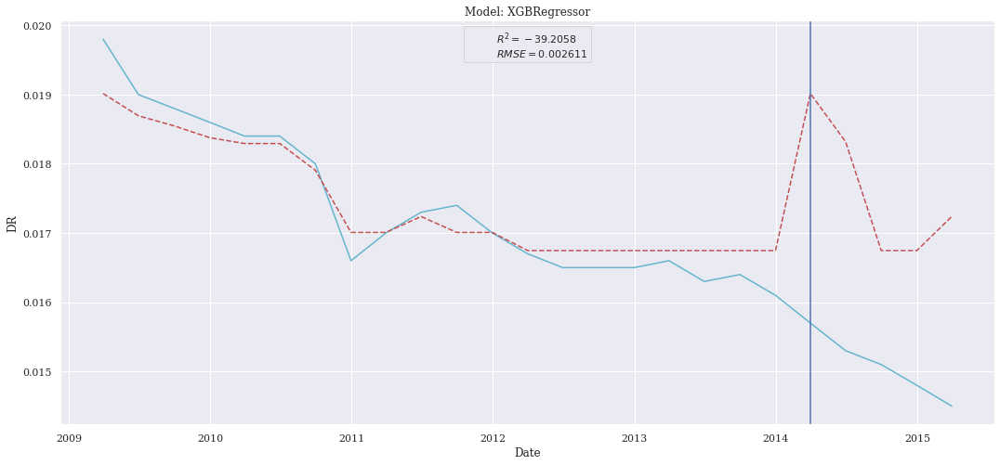

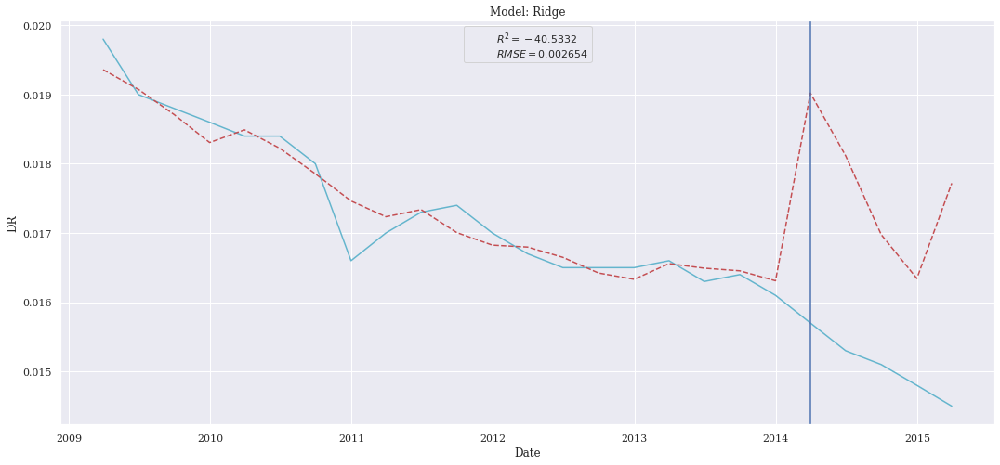

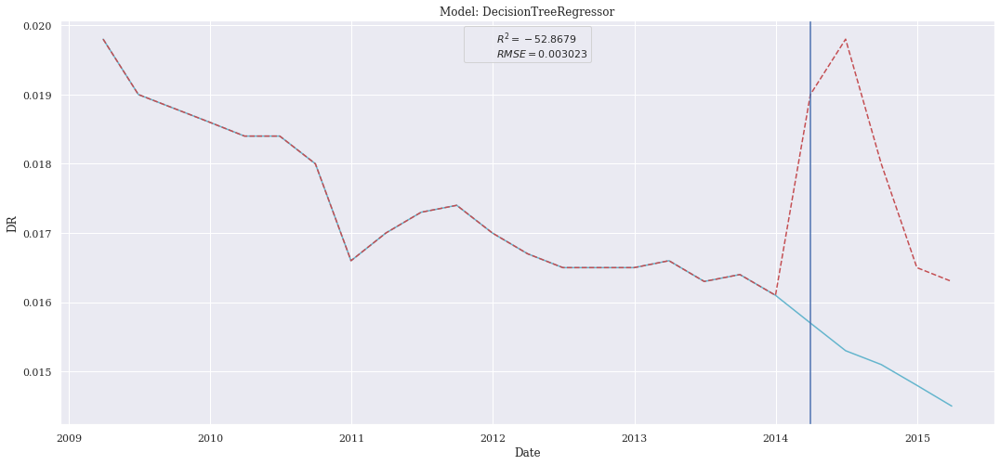

/usr/local/lib/python3.7/dist-packages/sklearn/svm/_base.py:1208: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  ConvergenceWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/svm/_base.py:1208: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  ConvergenceWarning,


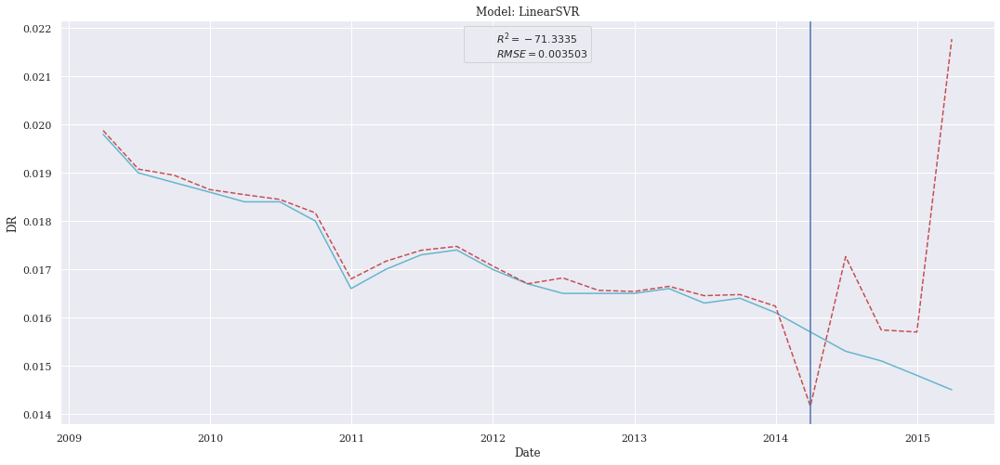

In [ ]:
for i in range(summary.shape[0]):
  y_train_pred = y_pred(X_train,y_train,X_train,y_train,model=summary.index[i])
  y_test_pred = y_pred(X_train,y_train,X_test,y_test,model=summary.index[i])
  plot_pred_detail(y_train,y_test,y_train_pred,y_test_pred,index[start:],name_model=summary.index[i],df_score=summary)

## First Conclusion
The SelectFromModel features and Recursive Features seems to give the most promising results. We will use the Knn, LinearSVR, and DecisionTree in order to design our solution.

### GridSearch on KNeighborsRegressor

In [ ]:
X_train, X_test, y_train, y_test = clean_data(data,start,b"Totale",col_used=cl.col_totale_sfm,split=split,norm=norm)
params_knr = {"n_neighbors":[1,2,3,4,5,6,7,8,9,10],"weights":["uniform"],"algorithm":["auto","ball_tree","kd_tree","brute"],"p":[1,2],"leaf_size":[1,2,3,4,5,10,20,30,40,50]}
params,score = params_grid(X_train,y_train,X_test,y_test,"knn",params_knr,metric="r2")
print(params,score)

Fitting 2 folds for each of 800 candidates, totalling 1600 fits
{'algorithm': 'auto', 'leaf_size': 1, 'n_neighbors': 1, 'p': 2, 'weights': 'uniform'} -21.075471698113088


In [ ]:
summary = summary_ml(X_train,y_train,X_test,y_test,models=["knn"],parameters={"p_knn":params})
summary

,rmse,mse,mae,r2
Index,,,,
KNeighborsRegressor,0.001935,0.000004,0.00188,-21.075472


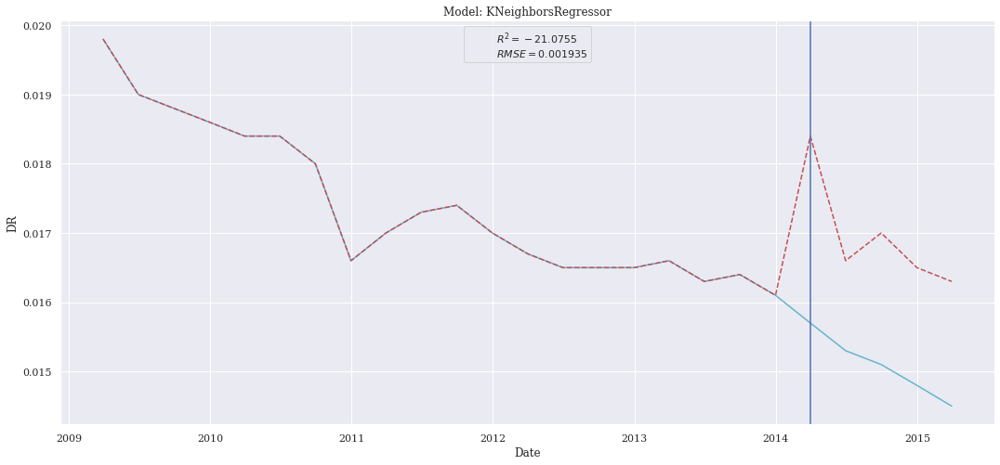

In [ ]:
y_train_pred = y_pred(X_train,y_train,X_train,y_train,model=summary.index[0],parameters={"p_knn":params})
y_test_pred = y_pred(X_train,y_train,X_test,y_test,model=summary.index[0],parameters={"p_knn":params})
plot_pred_detail(y_train,y_test,y_train_pred,y_test_pred,index[start:],name_model=summary.index[0],df_score=summary)

### GridSearch on LinearSVR

In [ ]:
X_train, X_test, y_train, y_test = clean_data(data,start,b"Totale",col_used=cl.col_totale_sfm,split=split,norm=norm)
params_svr = {"epsilon":[0,0.1,0.2],"C":[1,0.7,0.3,0.1],"loss":["epsilon_insensitive","squared_epsilon_insensitive"],"intercept_scaling":[1,5,10,15]}
params,score = params_grid(X_train,y_train,X_test,y_test,"svr",params_svr,metric="r2")
print(params,score)

Fitting 2 folds for each of 96 candidates, totalling 192 fits


/usr/local/lib/python3.7/dist-packages/sklearn/svm/_base.py:1208: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  ConvergenceWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/svm/_base.py:1208: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  ConvergenceWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/svm/_base.py:1208: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  ConvergenceWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/svm/_base.py:1208: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  ConvergenceWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/svm/_base.py:1208: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  ConvergenceWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/svm/_base.py:1208: ConvergenceWarning: Liblinear failed to converge, increase the number

{'C': 0.1, 'epsilon': 0, 'intercept_scaling': 15, 'loss': 'epsilon_insensitive'} -16.266772787877898


/usr/local/lib/python3.7/dist-packages/sklearn/svm/_base.py:1208: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  ConvergenceWarning,


In [ ]:
summary = summary_ml(X_train,y_train,X_test,y_test,models=["svr"],parameters={"p_svr":params})
summary

/usr/local/lib/python3.7/dist-packages/sklearn/svm/_base.py:1208: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  ConvergenceWarning,


,rmse,mse,mae,r2
Index,,,,
LinearSVR,0.001944,0.000004,0.001878,-21.279233


/usr/local/lib/python3.7/dist-packages/sklearn/svm/_base.py:1208: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  ConvergenceWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/svm/_base.py:1208: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  ConvergenceWarning,


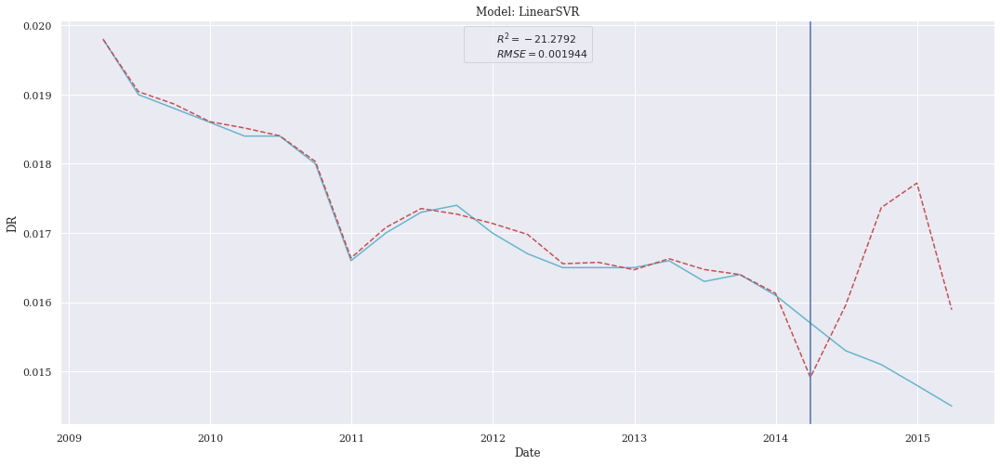

In [ ]:
y_train_pred = y_pred(X_train,y_train,X_train,y_train,model=summary.index[0],parameters={"p_knn":params})
y_test_pred = y_pred(X_train,y_train,X_test,y_test,model=summary.index[0],parameters={"p_knn":params})
plot_pred_detail(y_train,y_test,y_train_pred,y_test_pred,index[start:],name_model=summary.index[0],df_score=summary)

### GridSearch on DecisionTree

In [ ]:
X_train, X_test, y_train, y_test = clean_data(data,start,b"Totale",col_used=cl.col_totale_recur,split=split,norm=norm)
params_tre = {"criterion":["squared_error","friedman_mse","absolute_error","poisson"],"splitter":["best"],"max_features":["auto","sqrt","log2"]}
params,score = params_grid(X_train,y_train,X_test,y_test,"tre",parameters=params_tre,metric='r2')
print(params,score)

Fitting 2 folds for each of 12 candidates, totalling 24 fits
{'criterion': 'poisson', 'max_features': 'auto', 'splitter': 'best'} -12.573113207547093


In [ ]:
summary = summary_ml(X_train,y_train,X_test,y_test,models=["tre"],parameters={"p_tre":params})
summary

,rmse,mse,mae,r2
Index,,,,
DecisionTreeRegressor,0.001517,0.000002,0.00146,-12.573113


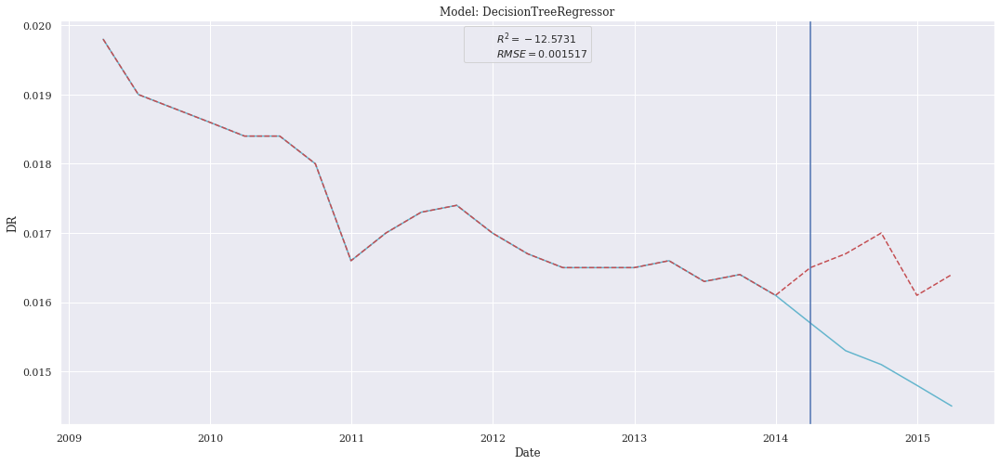

In [ ]:
y_train_pred = y_pred(X_train,y_train,X_train,y_train,model=summary.index[0],parameters={"p_tre":params})
y_test_pred = y_pred(X_train,y_train,X_test,y_test,model=summary.index[0],parameters={"p_tre":params})
plot_pred_detail(y_train,y_test,y_train_pred,y_test_pred,index[start:],name_model=summary.index[0],df_score=summary)

## Final Conclusion
Grid Search is relevant for the DecisionTree model but not for the others. With the Grid we obtain a r2 equals to -12.57 against 15.38 before GridSearch. Concerning the rmse is now 0.001517 against 0.001667.